# DATA

## What is this notebook about

This notebook builds upon the notebook ``` spacenet6_masking.ipynb ```

``` spacenet6_masking.ipynb ``` is used to generate all the masks for all 3401 training images, using only the PAN images and geojson_buildings files. These masks will be the same regardless of the original data format, hence it is a run-once-and-forget. 


**Loss Function**

This notebook will change the loss function that is being used by the efficientnetb0 model to BinaryFocalLoss(). Compare against keras_12D, experiment 1H which uses JaccardLoss()

## Setup COLAB and imports

Mount drive to gain access to files

In [ ]:
''' Used to reference the root directory, for directory traversal ''' 
from google.colab import drive
drive.mount('/content/gdrive', force_remount=True)
mount_dir = '/content/gdrive'
root_dir = '/content/gdrive/My Drive/Colab Notebooks'

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/gdrive


Installations required

In [ ]:
! pip install fiona
! pip install rasterio
! pip install segmentation-models

     |████████████████████████████████| 14.7MB 1.3MB/s 
     |████████████████████████████████| 18.2MB 1.5MB/s 


Imports required

In [ ]:
''' dealing with .tif files '''
import fiona
import rasterio
from rasterio.mask import mask
from rasterio.plot import show, reshape_as_raster, reshape_as_image

''' plotting images '''
from matplotlib import pyplot as plt
%matplotlib inline

''' traversing directories '''
import os
from pathlib import Path

''' core '''
import numpy as np
import pandas as pd

''' utilities '''
from tqdm import tqdm
import copy
import datetime

''' image processing '''
import tensorflow as tf
from tensorflow.keras.preprocessing import image

''' unet model '''
import segmentation_models_dev as sm
from segmentation_models import Unet
from segmentation_models.losses import JaccardLoss, BinaryFocalLoss
from segmentation_models.metrics import IOUScore, FScore

Using TensorFlow backend.


Segmentation Models: using `keras` framework.


## Global

### Constants, IMG
For reference the various image types are as such (amax is a rough gauge) based on the train_all data

```
type             shape                dtype       gauge of max value    gauge of min value
PAN              (1, 900, 900)        uint16      1844                  0
PS-RGB           (3, 900, 900)        uint8       255                   0
PS-RGBNIR        (4, 900, 900)        uint16      2047                  0
RGBNIR           (4, 450, 450)        uint16      2047                  0
SAR-Intensity    (4, 900, 900)        float32     92.87763              0.0
```



In [ ]:
''' get the same sequence for random set every time '''
seed = 42
np.random.seed = seed
tf.seed = seed       

''' lookup - define image channels for each image type '''
IMG_TYPE_LOOKUP = {
    'PAN': {'channels': 1, 'dtype': np.uint16}, 
    'PS-RGB': {'channels': 3, 'dtype': np.uint8}, 
    'PS-RGBNIR': {'channels': 4, 'dtype': np.uint16}, 
    'RGBNIR': {'channels': 4, 'dtype': np.uint16}, 
    'SAR-Intensity': {'channels': 4, 'dtype': np.float32}, 
}

''' image height and width we are working with for the whole notebook '''
IMG_HEIGHT = 256    
IMG_WIDTH = 256

''' root of all paths '''
PATH_SPACENET6 = Path(root_dir + '/spacenet6')
PATH_METRICS = PATH_SPACENET6/'metrics_keras_12.csv'

### SIZE, IDX
We will be setting the amount of data that we want to use for train/test
* There are 3401 images for each image type
* The actual spacenet6 "test folder" has only uneseen SAR-Intensity data

Therefore for training purposes, we will pull out our own "test data" from the training set for ease of verifying output 

Random indexes will be used for training and test

In [ ]:
''' set the various sizes we want to use '''
SIZE_ALL = 3401 
SIZE_TRAIN = 800           # CHANGE HERE
SIZE_TEST = 80            # CHANGE HERE
# 800-80, 1600-160, 3200-201

''' set the various idexes we want to use '''
try:
  TRAIN_IDX = np.load(PATH_SPACENET6/('TRAIN_IDX_'+str(SIZE_TRAIN)+'.npy'))
  TEST_IDX = np.load(PATH_SPACENET6/('TEST_IDX_'+str(SIZE_TEST)+'.npy'))
  print('TRAIN/TEST indexes available. Loading ')
except:
  ''' Generate the indexes that we will be using for train and test '''  
  ALL_IDX = np.arange(SIZE_ALL)

  TRAIN_IDX = np.random.choice(ALL_IDX, SIZE_TRAIN, replace=False)
  TRAIN_IDX.sort()

  ALL_IDX_2 = np.setdiff1d(ALL_IDX, TRAIN_IDX)

  TEST_IDX = np.random.choice(ALL_IDX_2, SIZE_TEST, replace=False)
  TEST_IDX.sort()

  np.save(PATH_SPACENET6/('TRAIN_IDX_'+str(SIZE_TRAIN)), TRAIN_IDX)
  np.save(PATH_SPACENET6/('TEST_IDX_'+str(SIZE_TEST)), TEST_IDX)
  print('TRAIN/TEST indexes not available. Generated and saved ')

TRAIN/TEST indexes available. Loading 


### Rotation file
These are the images that have been rotated

In [ ]:
TO_ROTATE = []
PATH_ORIENTATIONS = PATH_SPACENET6/'spacenet6_data_BACKUP/train_all/AOI_11_Rotterdam/SummaryData/SAR_orientations.txt'

orientation_file = open(PATH_ORIENTATIONS, "r")
for line in orientation_file:
  tilename = line.split(' ')[0]
  orientation_flag = int(line.split(' ')[1])

  if orientation_flag == 1:
    TO_ROTATE.append(tilename)

TO_ROTATE.sort()

print('orientation file loaded')

orientation file loaded


## Helper functions

### rotation()

In [ ]:
def rotation(filename, img):
  try:
    if filename.split(IMG_TYPE+'_')[1].split('_tile_')[0] in TO_ROTATE:
      return np.fliplr(np.flipud(img))
    else:
      return img
  except: 
    pass

  try:
    if filename.split('Buildings_')[1].split('_tile_')[0] in TO_ROTATE:
      return np.fliplr(np.flipud(img))
    else:
      return img
  except: 
    pass
      
  
  return img

### plot_XY()

In [ ]:
def plot_XY(plotname, X, Y, X_name, Y_name):
  ix = np.random.randint(0, len(X))
  print("index: {}".format(ix))
  print(plotname, " set")

  fig, (ax1, ax2) = plt.subplots(1,2, figsize=(16,5))
  show(reshape_as_raster(X[ix]), ax=ax1, title=X_name)
  show(reshape_as_raster(Y[ix]), ax=ax2, title=Y_name)
  plt.show()

### plot_XY_preds()

In [ ]:
def plot_XY_preds(plotname, X, Y, P, X_name, Y_name, P_name, index=None):
  if index==None:
    ix = np.random.randint(0, len(X))
  else:
    ix = index
  print("index: {}".format(ix))
  print(plotname, " set")

  fig, (ax1, ax2, ax3) = plt.subplots(1,3, figsize=(16,5))

  if X.dtype == 'float32':
    show(reshape_as_raster(  (X[ix] - np.amin(X)) / (np.amax(X) - np.amin(X))   ), ax=ax1, title=X_name)
  else:
    show(reshape_as_raster(X[ix]), ax=ax1, title=X_name)
  show(reshape_as_raster(Y[ix]), ax=ax2, title=Y_name)
  show(reshape_as_raster(P[ix]), ax=ax3, title=P_name)
  plt.show()

### plot_history()

In [ ]:
def plot_history(history):
  fig, (ax1, ax2, ax3) = plt.subplots(1,3, figsize=(16,5))

  ax1.plot(history['loss'], label='train')
  ax1.plot(history['val_loss'], label='val')
  ax1.title.set_text('loss')
  ax1.legend()

  ax2.plot(history['iou_score'], label='train')
  ax2.plot(history['val_iou_score'], label='val')
  ax2.title.set_text('iou_score')
  ax2.legend()

  ax3.plot(history['f1-score'], label='train')
  ax3.plot(history['val_f1-score'], label='val')
  ax3.title.set_text('f1-score')
  ax3.legend()

### store_metrics()
Save into the metrics file

In [ ]:
try: 
  METRICS_HISTORY = pd.read_csv(PATH_METRICS)
except:
  TIMESTAMP = datetime.datetime.now().strftime("%d/%m/%Y %H:%M:%S")
  IMG_TYPE, IMG_ROTATED, MODEL_NAME, MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, MODEL_COMMENTS = 'trial', 'trial', 'trial', 'trial', 'trial', 'trial', 'trial'
  MODEL_BATCH_SIZE, MODEL_EPOCHS, SIZE_TRAIN, SIZE_TEST, train_loss, train_iou_score, train_f1_score, val_loss, val_iou_score, val_f1_score, test_loss, test_iou_score, test_f1_score = 0,0,0,0,0,0,0,0,0,0,0,0,0

  METRICS_HISTORY = pd.DataFrame(np.array([[TIMESTAMP, IMG_TYPE, IMG_ROTATED, MODEL_NAME, MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, MODEL_COMMENTS, MODEL_BATCH_SIZE, MODEL_EPOCHS, SIZE_TRAIN, SIZE_TEST, 
                              test_loss, test_iou_score, test_f1_score,
                              val_loss, val_iou_score, val_f1_score, 
                              train_loss, train_iou_score, train_f1_score
                              ]]),
                    columns=['timestamp', 'img_type', 'img_rotated', 'model_name', 'model_type', 'pretrain', 'loss_function', 'comments', 'batch_size', 'epochs', 'size_train', 'size_test', 
                              'test_loss', 'test_iou_score', 'test_f1-score',
                              'val_loss', 'val_iou_score', 'val_f1-score', 
                              'train_loss', 'train_iou_score', 'train_f1-score'
                              ],
                    )
  METRICS_HISTORY.to_csv(PATH_METRICS, index=False)

In [ ]:
def store_metrics(test_loss, test_iou_score, test_f1_score, val_loss, val_iou_score, val_f1_score, train_loss, train_iou_score, train_f1_score, IMG_TYPE, IMG_ROTATED, MODEL_NAME, MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, MODEL_COMMENTS, MODEL_BATCH_SIZE, MODEL_EPOCHS, SIZE_TRAIN, SIZE_TEST, PATH_METRICS):
  TIMESTAMP = datetime.datetime.now().strftime("%d/%m/%Y %H:%M:%S")

  ''' create another df that looks just like that and concat with ''' 
  new_metrics = pd.DataFrame(np.array([[TIMESTAMP, IMG_TYPE, IMG_ROTATED, MODEL_NAME, MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, MODEL_COMMENTS, MODEL_BATCH_SIZE, MODEL_EPOCHS, SIZE_TRAIN, SIZE_TEST,
                             test_loss, test_iou_score, test_f1_score,
                             val_loss, val_iou_score, val_f1_score, 
                             train_loss, train_iou_score, train_f1_score                             
                             ]]),
                   columns=['timestamp', 'img_type', 'img_rotated', 'model_name', 'model_type', 'pretrain', 'loss_function', 'comments', 'batch_size', 'epochs', 'size_train', 'size_test', 
                            'test_loss', 'test_iou_score', 'test_f1-score',
                            'val_loss', 'val_iou_score', 'val_f1-score',
                            'train_loss', 'train_iou_score', 'train_f1-score'                            
                            ],
                  )

  new_metrics.to_csv(PATH_METRICS, mode='a', header=False, index=False)
  print("saved model metrics")

## Generator

### gen_input_image_details()
Set the specifications for the image input into the model

In [ ]:
def gen_input_image_details(IMG_TYPE, IMG_ROTATED, IMG_HEIGHT=IMG_HEIGHT, IMG_WIDTH=IMG_WIDTH, IMG_TYPE_LOOKUP=IMG_TYPE_LOOKUP):
  print('gen_input_image_details()')
  
  IMG_CHANNELS = IMG_TYPE_LOOKUP[IMG_TYPE]['channels']
  IMG_DTYPE_SRC = IMG_TYPE_LOOKUP[IMG_TYPE]['dtype']
  IMG_DTYPE = np.uint8               

  print('IMG_TYPE: {}, IMG_HEIGHT: {}, IMG_WIDTH: {}, IMG_ROTATED: {}, IMG_CHANNELS: {}, IMG_DTYPE_SRC: {}, IMG_DTYPE: {}\n'.format(IMG_TYPE, IMG_HEIGHT, IMG_WIDTH, IMG_ROTATED, IMG_CHANNELS, IMG_DTYPE_SRC, IMG_DTYPE))

  return (IMG_TYPE, IMG_HEIGHT, IMG_WIDTH, IMG_ROTATED, IMG_CHANNELS, IMG_DTYPE_SRC, IMG_DTYPE)

### gen_paths()
Setting the paths that we require, which will change based on the image type and image size specified

In [ ]:
def gen_paths(IMG_TYPE, IMG_ROTATED, IMG_HEIGHT=IMG_HEIGHT, IMG_WIDTH=IMG_WIDTH):
  print('gen_paths()')

  ''' set the original data source folder '''
  PATH_SRC = PATH_SPACENET6/'spacenet6_data_BACKUP/train_all/AOI_11_Rotterdam'
  PATH_SRC_IMAGE = PATH_SRC/IMG_TYPE
  PATH_SRC_MASK = PATH_SRC/'_mask'


  ''' change in accordance to the image type and dimensions '''
  COMBI = IMG_TYPE + '_' + str(IMG_HEIGHT) + 'x' + str(IMG_WIDTH)


  ''' set the directories for this combination '''
  if IMG_ROTATED:
    PATH_DATA = PATH_SPACENET6/('spacenet6_data_rotated/' + COMBI)
    PATH_DATA.mkdir(parents=True, exist_ok=True)
  else:
    PATH_DATA = PATH_SPACENET6/('spacenet6_data/' + COMBI)
    PATH_DATA.mkdir(parents=True, exist_ok=True)

  PATH_IMAGE = PATH_DATA/'image'
  PATH_IMAGE.mkdir(parents=True, exist_ok=True)

  PATH_MASK = PATH_DATA/'mask'
  PATH_MASK.mkdir(parents=True, exist_ok=True)

  PATH_SAMPLE = PATH_DATA/'sample'
  PATH_SAMPLE.mkdir(parents=True, exist_ok=True)

  PATH_SAVED_MODELS = PATH_DATA/'saved_models'
  PATH_SAVED_MODELS.mkdir(parents=True, exist_ok=True)

  print('PATH_SRC: {}, \nPATH_SRC_IMAGE: {}, \nPATH_SRC_MASK: {}, \nPATH_DATA: {}, \nPATH_IMAGE: {}, \nPATH_MASK: {}, \nPATH_SAMPLE: {}, \nPATH_SAVED_MODELS: {}\n'.format(PATH_SRC, PATH_SRC_IMAGE, PATH_SRC_MASK, PATH_DATA, PATH_IMAGE, PATH_MASK, PATH_SAMPLE, PATH_SAVED_MODELS))

  return (PATH_SRC, PATH_SRC_IMAGE, PATH_SRC_MASK, PATH_DATA, PATH_IMAGE, PATH_MASK, PATH_SAMPLE, PATH_SAVED_MODELS)

### gen_resized_images()
This will check if the required resized images have already been created. If not, it will create it.

In [ ]:
def gen_resized_images(PATH_SRC_IMAGE, PATH_SRC_MASK, PATH_IMAGE, PATH_MASK, IMG_HEIGHT=IMG_HEIGHT, IMG_WIDTH=IMG_WIDTH):
  print('gen_resized_images()')
  
  
  def resize_and_save(img_src_path, img_fname, img_save_path):
    img = rasterio.open(img_src_path/img_fname)

    ''' use the metadata from the original image '''
    transform = img.transform
    meta = img.meta.copy()

    ''' resize the image '''
    resized_img = img.read()
    # print(resized_img.shape, resized_img.dtype, 'amax: {}'.format(np.amax(resized_img)), 'amin: {}'.format(np.amin(resized_img)))
    resized_img = reshape_as_image(resized_img)
    # print(resized_img.shape, resized_img.dtype, 'amax: {}'.format(np.amax(resized_img)), 'amin: {}'.format(np.amin(resized_img)))

    resized_img = tf.image.resize(resized_img, [IMG_HEIGHT, IMG_WIDTH], method='nearest', preserve_aspect_ratio=True, antialias=True)
    resized_img = reshape_as_raster(resized_img)
    # print(resized_img.shape, resized_img.dtype, 'amax: {}'.format(np.amax(resized_img)), 'amin: {}'.format(np.amin(resized_img)))

    resized_img = rotation(img_fname, resized_img)


    ''' update metadata with new size '''
    meta.update({"transform": transform,
                "height": resized_img.shape[1],
                "width": resized_img.shape[2]
                })

    ''' write the resized image to a new geotiff '''
    with rasterio.open(img_save_path/img_fname, 'w', **meta) as dst:
      dst.write(resized_img)




  ''' Verify contents in source directory are present and assign to iterator '''
  src_image_ids = next(os.walk(PATH_SRC_IMAGE))[2]
  src_image_ids.sort()
  # print('len(src_image_ids): {}'.format(len(src_image_ids)))
  # print(src_image_ids[:3])

  src_mask_ids = next(os.walk(PATH_SRC_MASK))[2]
  src_mask_ids.sort()
  # print('len(src_mask_ids): {}'.format(len(src_mask_ids)))
  # print(src_mask_ids[:3])


  ''' check the target directory for existing files '''
  existing_image_ids = next(os.walk(PATH_IMAGE))[2]
  existing_image_ids.sort()
  # print('len(existing_image_ids): {}'.format(len(existing_image_ids)))
  # print(existing_image_ids[:3])

  existing_mask_ids = next(os.walk(PATH_MASK))[2]
  existing_mask_ids.sort()
  # print('len(existing_mask_ids): {}'.format(len(existing_mask_ids)))
  # print(existing_mask_ids[:3])


  ''' check if resized files already exist, else create them '''
  if (existing_image_ids == src_image_ids) and (existing_mask_ids == src_mask_ids): 
    print('Resized images and masks available\n')
    pass
  else:
    print('Resized images and masks not available')
    print('Resizing image')
    for n, id in tqdm(enumerate(src_image_ids), total=len(src_image_ids), position=0, leave=True):
      resize_and_save(PATH_SRC_IMAGE, id, PATH_IMAGE)
    print('Finished resizing image')

    print('Resizing mask')
    for n, id in tqdm(enumerate(src_mask_ids), total=len(src_mask_ids), position=0, leave=True):
      resize_and_save(PATH_SRC_MASK, id, PATH_MASK)
    print('Finished resizing mask')

    print('Resized images and masks generated\n')

### gen_train_test_set()
This will return the train test set 

In [ ]:
def gen_train_test_set(PATH_IMAGE, PATH_MASK, IMG_CHANNELS, IMG_DTYPE_SRC, TRAIN_IDX, TEST_IDX, SIZE_TRAIN=SIZE_TRAIN, SIZE_TEST=SIZE_TEST, IMG_HEIGHT=IMG_HEIGHT, IMG_WIDTH=IMG_WIDTH):
  print('gen_train_test_set()')  
  
  X_train_sample_fname = 'sample_X_train_{}.npy'.format(SIZE_TRAIN)
  Y_train_sample_fname = 'sample_Y_train_{}.npy'.format(SIZE_TRAIN)
  X_test_sample_fname = 'sample_X_test_{}.npy'.format(SIZE_TEST)
  Y_test_sample_fname = 'sample_Y_test_{}.npy'.format(SIZE_TEST)
  
  
  ''' load sample data if present '''
  try:
    X_train = np.load(PATH_SAMPLE/X_train_sample_fname).reshape((SIZE_TRAIN,IMG_HEIGHT,IMG_WIDTH,IMG_CHANNELS))
    Y_train = np.load(PATH_SAMPLE/Y_train_sample_fname).reshape((SIZE_TRAIN,IMG_HEIGHT,IMG_WIDTH,1))
    X_test = np.load(PATH_SAMPLE/X_test_sample_fname).reshape((SIZE_TEST,IMG_HEIGHT,IMG_WIDTH,IMG_CHANNELS))
    Y_test = np.load(PATH_SAMPLE/Y_test_sample_fname).reshape((SIZE_TEST,IMG_HEIGHT,IMG_WIDTH,1))
    print('Sample data available. Loaded sample data\n')

  except:
    ''' get the ids/filenames that we need, based on the random index allocation to avoid grouping '''
    ''' X are image files, Y are mask files '''
    print('Sample data not available')
    all_img_ids = next(os.walk(PATH_IMAGE))[2]
    all_img_ids.sort()
    all_img_ids = np.array(all_img_ids)

    all_mask_ids = next(os.walk(PATH_MASK))[2]
    all_mask_ids.sort()
    all_mask_ids = np.array(all_mask_ids)

    X_train_ids = all_img_ids[TRAIN_IDX]
    X_train_ids.sort()
    Y_train_ids = all_mask_ids[TRAIN_IDX]
    Y_train_ids.sort()

    X_test_ids = all_img_ids[TEST_IDX]
    X_test_ids.sort()
    Y_test_ids = all_mask_ids[TEST_IDX]
    Y_test_ids.sort()

    # print(len(all_img_ids))
    # print(all_img_ids[:3])
    # print(len(all_mask_ids))
    # print(all_mask_ids[:3])
    # print(len(X_train_ids))
    # print(X_train_ids[:3])
    # print(len(Y_train_ids))
    # print(Y_train_ids[:3])
    # print(len(X_test_ids))
    # print(X_test_ids[:3])
    # print(len(Y_test_ids))
    # print(Y_test_ids[:3])


    ''' prepare numpy arrays to store converted image and mask files. Image files will need to be converted to IMG_DTYPE_SRC and mask files will be converted to np.bool '''
    X_train = np.zeros((len(X_train_ids), IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS), dtype=IMG_DTYPE_SRC) 
    Y_train = np.zeros((len(Y_train_ids), IMG_HEIGHT, IMG_WIDTH, 1), dtype=np.bool)
    X_test = np.zeros((len(X_test_ids), IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS), dtype=IMG_DTYPE_SRC) 
    Y_test = np.zeros((len(Y_test_ids), IMG_HEIGHT, IMG_WIDTH, 1), dtype=np.bool)

    # print('X_train', X_train.shape, X_train.dtype)
    # print('Y_train', Y_train.shape, Y_train.dtype)
    # print('X_test', X_test.shape, X_test.dtype)
    # print('Y_test', Y_test.shape, Y_test.dtype)

    ''' actually format the imaegs into the correct data shape and type '''
    print('formatting training images')
    for n, id in tqdm(enumerate(X_train_ids), total=len(X_train_ids), position=0, leave=True):
      img = rasterio.open(PATH_IMAGE/id).read()
      img = reshape_as_image(img)
      X_train[n] = img
    print('Finished formatting training images')

    print('formatting training masks')
    for n, id in tqdm(enumerate(Y_train_ids), total=len(Y_train_ids), position=0, leave=True):
      img = rasterio.open(PATH_MASK/id).read()
      img = reshape_as_image(img)
      img = img.astype(np.bool) 
      Y_train[n] = img
    print('Finished formatting training masks')

    print('formatting test images')
    for n, id in tqdm(enumerate(X_test_ids), total=len(X_test_ids), position=0, leave=True):
      img = rasterio.open(PATH_IMAGE/id).read()
      img = reshape_as_image(img)
      X_test[n] = img
    print('Finished formatting test images')

    print('formatting test masks')
    for n, id in tqdm(enumerate(Y_test_ids), total=len(Y_test_ids), position=0, leave=True):
      img = rasterio.open(PATH_MASK/id).read()
      img = reshape_as_image(img)
      img = img.astype(np.bool) 
      Y_test[n] = img
    print('Finished formatting test masks')  


    np.save(PATH_SAMPLE/X_train_sample_fname, X_train.ravel())
    np.save(PATH_SAMPLE/Y_train_sample_fname, Y_train.ravel())
    np.save(PATH_SAMPLE/X_test_sample_fname, X_test.ravel())
    np.save(PATH_SAMPLE/Y_test_sample_fname, Y_test.ravel())

    print('Sample data generated and saved\n')

  return (X_train, Y_train, X_test, Y_test)

### gen_model()
This will generate a basic model to use 

In [ ]:
def gen_model(MODEL_LOSS, MODEL_BATCH_SIZE, MODEL_EPOCHS, MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, IMG_CHANNELS, MODEL_ID=None, MODEL_COMMENTS=''): 
  MODEL_OPTIMIZER = 'adam'
  MODEL_LOSS = MODEL_LOSS                                            # CHANGE HERE
  MODEL_METRICS =[IOUScore(), FScore()]
  MODEL_VAL_SPLIT = 0.1
  MODEL_VAL_OFFSET = int(SIZE_TRAIN*(1-MODEL_VAL_SPLIT))    
  MODEL_BATCH_SIZE = MODEL_BATCH_SIZE
  MODEL_EPOCHS = MODEL_EPOCHS                                               # CHANGE HERE

  MODEL_TYPE = 'segmentation-models Unet'
  MODEL_PRETRAIN = MODEL_PRETRAIN                                     # CHANGE HERE
  MODEL_LOSS_FUNCTION = MODEL_LOSS_FUNCTION                           # CHANGE HERE
  MODEL_COMMENTS = MODEL_COMMENTS

  if MODEL_ID == None:
    MODEL_NAME = 'MODEL_{}__PRETRAIN_{}__LOSS_{}__EPOCH_{}__TRAIN_{}__TEST_{}'.format(MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, MODEL_EPOCHS, SIZE_TRAIN, SIZE_TEST)
  else:
    MODEL_NAME = 'ID_{}__MODEL_{}__PRETRAIN_{}__LOSS_{}__EPOCH_{}__TRAIN_{}__TEST_{}'.format(MODEL_ID, MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, MODEL_EPOCHS, SIZE_TRAIN, SIZE_TEST)

  model = Unet(backbone_name=MODEL_PRETRAIN, encoder_weights=None, input_shape=(None, None, IMG_CHANNELS))
  model.compile(optimizer=MODEL_OPTIMIZER, loss=MODEL_LOSS, metrics=MODEL_METRICS)

  return (MODEL_OPTIMIZER, MODEL_LOSS, MODEL_METRICS, MODEL_VAL_SPLIT, MODEL_VAL_OFFSET, MODEL_BATCH_SIZE, MODEL_EPOCHS, MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, MODEL_COMMENTS, MODEL_ID, MODEL_NAME, model)


### gen_model_results()
This will generate a basic model to use 

In [ ]:
def gen_model_results(PATH_SAVED_MODELS, MODEL_NAME, X_train, Y_train, MODEL_BATCH_SIZE, MODEL_EPOCHS, MODEL_VAL_SPLIT, load_weights_filename='', load_weights_epochs=0, save_model=False):
  checkpointer = tf.keras.callbacks.ModelCheckpoint( PATH_SAVED_MODELS/(MODEL_NAME+'_WEIGHTS.h5'), verbose=1, save_best_only=True)
  callbacks = [tf.keras.callbacks.EarlyStopping(patience=20, monitor='val_loss', mode='min')]   

  if load_weights_filename == '':
    print('No weights loaded. Training new model')
    results = model.fit(X_train, Y_train, batch_size=MODEL_BATCH_SIZE, epochs=MODEL_EPOCHS, validation_split=MODEL_VAL_SPLIT, callbacks=callbacks)
  else:
    model.load_weights(str(PATH_SAVED_MODELS/load_weights_filename))

    # load_weights_epochs: the extra epochs to train for, after loading in weights. 
    if load_weights_epochs == 0:
      print('Just loading weights')
      results = None
    else:
      print('Weights loaded, training for extra {} epochs'.format(load_weights_epochs))
      results = model.fit(X_train, Y_train, batch_size=MODEL_BATCH_SIZE, epochs=load_weights_epochs, validation_split=MODEL_VAL_SPLIT, callbacks=callbacks)

  if save_model == True:
    # model.save(str(PATH_SAVED_MODELS/(MODEL_NAME+'.h5')))
    model.save_weights(str(PATH_SAVED_MODELS/(MODEL_NAME+'_WEIGHTS.h5')))
    print('model saved')
  
  return (results, model)

### gen_predictions()
This will generate the predictions based on a trained model

In [ ]:
def gen_predictions(model, X_train, Y_train, X_test, Y_test, MODEL_VAL_OFFSET, IMG_TYPE, IMG_ROTATED, MODEL_NAME, MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, MODEL_COMMENTS, MODEL_BATCH_SIZE, MODEL_EPOCHS, SIZE_TRAIN=SIZE_TRAIN, SIZE_TEST=SIZE_TEST, PATH_METRICS=PATH_METRICS):
  ''' split train, val 90-10. validation_split takes the percentage from the back '''
  preds_train = model.predict(X_train[:MODEL_VAL_OFFSET], verbose=1)
  preds_val = model.predict(X_train[MODEL_VAL_OFFSET:], verbose=1)
  preds_test = model.predict(X_test, verbose=1)

  preds_train_t = (preds_train > 0.5).astype(np.uint8)
  preds_val_t = (preds_val > 0.5).astype(np.uint8)
  preds_test_t = (preds_test > 0.5).astype(np.uint8)


  ''' evaluation of prediction '''
  metric_names = model.metrics_names
  
  print("train set evaluation")
  train_metrics = model.evaluate(X_train[:MODEL_VAL_OFFSET], Y_train[:MODEL_VAL_OFFSET])
  for x in range(len(metric_names)):
    print(metric_names[x], ': ', train_metrics[x])

  print("\nvalidation set evaluation")
  val_metrics = model.evaluate(X_train[MODEL_VAL_OFFSET:], X_train[MODEL_VAL_OFFSET:])
  for x in range(len(metric_names)):
    print(metric_names[x], ': ', val_metrics[x])

  print("\ntest set evaluation")
  test_metrics = model.evaluate(X_test, Y_test)
  for x in range(len(metric_names)):
    print(metric_names[x], ': ', test_metrics[x])

  store_metrics(test_metrics[0], test_metrics[1], test_metrics[2], val_metrics[0], val_metrics[1], val_metrics[2], train_metrics[0], train_metrics[1], train_metrics[2], IMG_TYPE, IMG_ROTATED, MODEL_NAME, MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, MODEL_COMMENTS, MODEL_BATCH_SIZE, MODEL_EPOCHS, SIZE_TRAIN, SIZE_TEST, PATH_METRICS)

  return (preds_train_t, preds_val_t, preds_test_t)

## Bring in the SAR data, both rotated and un-rotated
The geotiff metadata has probably been copied wrongly for now for rotated images

In [ ]:
''' run when changing parameters '''
IMG_TYPE, IMG_WIDTH, IMG_HEIGHT, IMG_ROTATED, IMG_CHANNELS, IMG_DTYPE_SRC, IMG_DTYPE = gen_input_image_details('SAR-Intensity', False)       # CHANGE HERE

PATH_SRC, PATH_SRC_IMAGE, PATH_SRC_MASK, PATH_DATA, PATH_IMAGE, PATH_MASK, PATH_SAMPLE, PATH_SAVED_MODELS = gen_paths(IMG_TYPE, IMG_ROTATED)
gen_resized_images(PATH_SRC_IMAGE, PATH_SRC_MASK, PATH_IMAGE, PATH_MASK)
X_train_no_rotate, Y_train_no_rotate, X_test_no_rotate, Y_test_no_rotate = gen_train_test_set(PATH_IMAGE, PATH_MASK, IMG_CHANNELS, IMG_DTYPE_SRC, TRAIN_IDX, TEST_IDX)

gen_input_image_details()
IMG_TYPE: SAR-Intensity, IMG_HEIGHT: 256, IMG_WIDTH: 256, IMG_ROTATED: False, IMG_CHANNELS: 4, IMG_DTYPE_SRC: <class 'numpy.float32'>, IMG_DTYPE: <class 'numpy.uint8'>

gen_paths()
PATH_SRC: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_BACKUP/train_all/AOI_11_Rotterdam, 
PATH_SRC_IMAGE: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_BACKUP/train_all/AOI_11_Rotterdam/SAR-Intensity, 
PATH_SRC_MASK: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_BACKUP/train_all/AOI_11_Rotterdam/_mask, 
PATH_DATA: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data/SAR-Intensity_256x256, 
PATH_IMAGE: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data/SAR-Intensity_256x256/image, 
PATH_MASK: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data/SAR-Intensity_256x256/mask, 
PATH_SAMPLE: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data/SAR-Intensity_256x256/sample, 
P

In [ ]:
''' run when changing parameters '''
IMG_TYPE, IMG_WIDTH, IMG_HEIGHT, IMG_ROTATED, IMG_CHANNELS, IMG_DTYPE_SRC, IMG_DTYPE = gen_input_image_details('SAR-Intensity', True)       # CHANGE HERE

PATH_SRC, PATH_SRC_IMAGE, PATH_SRC_MASK, PATH_DATA, PATH_IMAGE, PATH_MASK, PATH_SAMPLE, PATH_SAVED_MODELS = gen_paths(IMG_TYPE, IMG_ROTATED)
gen_resized_images(PATH_SRC_IMAGE, PATH_SRC_MASK, PATH_IMAGE, PATH_MASK)
X_train_rotate, Y_train_rotate, X_test_rotate, Y_test_rotate = gen_train_test_set(PATH_IMAGE, PATH_MASK, IMG_CHANNELS, IMG_DTYPE_SRC, TRAIN_IDX, TEST_IDX)

gen_input_image_details()
IMG_TYPE: SAR-Intensity, IMG_HEIGHT: 256, IMG_WIDTH: 256, IMG_ROTATED: True, IMG_CHANNELS: 4, IMG_DTYPE_SRC: <class 'numpy.float32'>, IMG_DTYPE: <class 'numpy.uint8'>

gen_paths()
PATH_SRC: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_BACKUP/train_all/AOI_11_Rotterdam, 
PATH_SRC_IMAGE: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_BACKUP/train_all/AOI_11_Rotterdam/SAR-Intensity, 
PATH_SRC_MASK: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_BACKUP/train_all/AOI_11_Rotterdam/_mask, 
PATH_DATA: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_rotated/SAR-Intensity_256x256, 
PATH_IMAGE: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_rotated/SAR-Intensity_256x256/image, 
PATH_MASK: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_rotated/SAR-Intensity_256x256/mask, 
PATH_SAMPLE: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_rotated/S

Boolean masks to float32 masks
Package updates as of 4 Aug 2020 rejected the boolean masks, so convert them into np.float32 to match with the X data

In [ ]:
Y_train_rotate = Y_train_rotate.astype(np.float32)
Y_test_rotate = Y_test_rotate.astype(np.float32)
Y_train_no_rotate = Y_train_no_rotate.astype(np.float32)
Y_test_no_rotate = Y_test_no_rotate.astype(np.float32)

In [ ]:
print(X_train_no_rotate.shape, Y_train_no_rotate.shape, X_test_no_rotate.shape, Y_test_no_rotate.shape)
print(X_train_rotate.shape, Y_train_rotate.shape, X_test_rotate.shape, Y_test_rotate.shape)

(800, 256, 256, 4) (800, 256, 256, 1) (80, 256, 256, 4) (80, 256, 256, 1)
(800, 256, 256, 4) (800, 256, 256, 1) (80, 256, 256, 4) (80, 256, 256, 1)


# EXPERIMENT

**There are lots of things that we can experiment with right now**
* float32 vs uint8
* float32 vs float32 normalized to 0,1
* rotation vs no rotation
* early stopping: mode=max, val_iou_score
* various backbones
  *  resnet18 / 34 / 50 / 101 / 152
  *  seresnet18 / 34 / 50 / 101 / 152
  *  seresnext50 / 101 / 154 / 50 / 101
  *  vgg16 / 19
  *  densenet121 / 169 / 201
  *  inceptionresnetv2 / 3
  *  mobilenet / v2
  *  efficientnetb0 / 1 / 2 / 3 / 4 / 5 / 6 / 7
*various loss functions 
  *  jaccardloss
  *  diceloss (play with beta)
  *  binaryceloss
  *  binaryfocalloss (play with alpha, gamma)
    

**focal loss**

α and γ are hyperparameters that can be tweaked for further calibration. γ can also be said as a relaxation parameter in laymen’s terms.
More the value of γ, more importance will be given to misclassified examples and very less loss will be propagated from easy examples. According to the study mentioned in [5], γ=2 gives the best results.

α is used to specify the weight of different categories/labels, the size of the array needs to be consistent with the number of classes.


## Experiment details
patience=10, epochs=100, efficientnetb0, batchsize=4, size=800-80, SAR not rotated

1I: BinaryFocalLoss()

## Experiment 1I: BinaryFocalLoss()

### ID 81. JaccardLoss()

In [ ]:
''' set the train/test ''' 
IMG_TYPE, IMG_WIDTH, IMG_HEIGHT, IMG_ROTATED, IMG_CHANNELS, IMG_DTYPE_SRC, IMG_DTYPE = gen_input_image_details('SAR-Intensity', False)       # CHANGE HERE
PATH_SRC, PATH_SRC_IMAGE, PATH_SRC_MASK, PATH_DATA, PATH_IMAGE, PATH_MASK, PATH_SAMPLE, PATH_SAVED_MODELS = gen_paths(IMG_TYPE, IMG_ROTATED)
if IMG_ROTATED:
  X_train, Y_train, X_test, Y_test = X_train_rotate, Y_train_rotate, X_test_rotate, Y_test_rotate
else:
  X_train, Y_train, X_test, Y_test = X_train_no_rotate, Y_train_no_rotate, X_test_no_rotate, Y_test_no_rotate

gen_input_image_details()
IMG_TYPE: SAR-Intensity, IMG_HEIGHT: 256, IMG_WIDTH: 256, IMG_ROTATED: False, IMG_CHANNELS: 4, IMG_DTYPE_SRC: <class 'numpy.float32'>, IMG_DTYPE: <class 'numpy.uint8'>

gen_paths()
PATH_SRC: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_BACKUP/train_all/AOI_11_Rotterdam, 
PATH_SRC_IMAGE: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_BACKUP/train_all/AOI_11_Rotterdam/SAR-Intensity, 
PATH_SRC_MASK: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_BACKUP/train_all/AOI_11_Rotterdam/_mask, 
PATH_DATA: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data/SAR-Intensity_256x256, 
PATH_IMAGE: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data/SAR-Intensity_256x256/image, 
PATH_MASK: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data/SAR-Intensity_256x256/mask, 
PATH_SAMPLE: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data/SAR-Intensity_256x256/sample, 
P

In [ ]:
''' set the model parameters, train model '''
MODEL_OPTIMIZER, MODEL_LOSS, MODEL_METRICS, MODEL_VAL_SPLIT, MODEL_VAL_OFFSET, MODEL_BATCH_SIZE, MODEL_EPOCHS, MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, MODEL_COMMENTS, MODEL_ID, MODEL_NAME, model = gen_model(
    JaccardLoss(), 4, 100, 'segmentation-models Unet', 'efficientnetb0', 'JaccardLoss()', IMG_CHANNELS, MODEL_ID=81, MODEL_COMMENTS='loss function test, early stopping patience 10')          # CHANGE HERE

results, model = gen_model_results(PATH_SAVED_MODELS, MODEL_NAME, X_train, Y_train, MODEL_BATCH_SIZE, MODEL_EPOCHS, MODEL_VAL_SPLIT, 
                                   load_weights_filename='', load_weights_epochs=0, save_model=True)                                            # CHANGE HERE

/usr/local/lib/python3.6/dist-packages/keras_applications/imagenet_utils.py:279: UserWarning: This model usually expects 1 or 3 input channels. However, it was passed an input_shape with 4 input channels.
  str(input_shape[-1]) + ' input channels.')


No weights loaded. Training new model
Train on 720 samples, validate on 80 samples
Epoch 1/100
720/720 [==============================] - 100s 138ms/step - loss: 0.8362 - iou_score: 0.1638 - f1-score: 0.2727 - val_loss: 1.0000 - val_iou_score: 1.4715e-05 - val_f1-score: 2.9428e-05
Epoch 2/100
720/720 [==============================] - 67s 93ms/step - loss: 0.7794 - iou_score: 0.2206 - f1-score: 0.3525 - val_loss: 0.7846 - val_iou_score: 0.2154 - val_f1-score: 0.3365
Epoch 3/100
720/720 [==============================] - 67s 92ms/step - loss: 0.7644 - iou_score: 0.2356 - f1-score: 0.3700 - val_loss: 0.7784 - val_iou_score: 0.2216 - val_f1-score: 0.3390
Epoch 4/100
720/720 [==============================] - 67s 93ms/step - loss: 0.7530 - iou_score: 0.2470 - f1-score: 0.3865 - val_loss: 0.8492 - val_iou_score: 0.1508 - val_f1-score: 0.2431
Epoch 5/100
720/720 [==============================] - 67s 92ms/step - loss: 0.7482 - iou_score: 0.2518 - f1-score: 0.3930 - val_loss: 0.7375 - val_iou

In [ ]:
''' predict using model '''
preds_train_t, preds_val_t, preds_test_t = gen_predictions(model, X_train, Y_train, X_test, Y_test, MODEL_VAL_OFFSET, IMG_TYPE, IMG_ROTATED, MODEL_NAME, MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, MODEL_COMMENTS, MODEL_BATCH_SIZE, MODEL_EPOCHS)

80/80 [==============================] - 1s 15ms/step
train set evaluation
720/720 [==============================] - 10s 14ms/step
loss :  0.4630314588546753
iou_score :  0.536708652973175
f1-score :  0.6976096034049988

validation set evaluation
80/80 [==============================] - 1s 16ms/step
loss :  0.8733271956443787
iou_score :  0.1382349580526352
f1-score :  0.24036727845668793

test set evaluation
80/80 [==============================] - 1s 15ms/step
loss :  0.6056659340858459
iou_score :  0.40446028113365173
f1-score :  0.5750434994697571
saved model metrics


index: 359
train preds  set


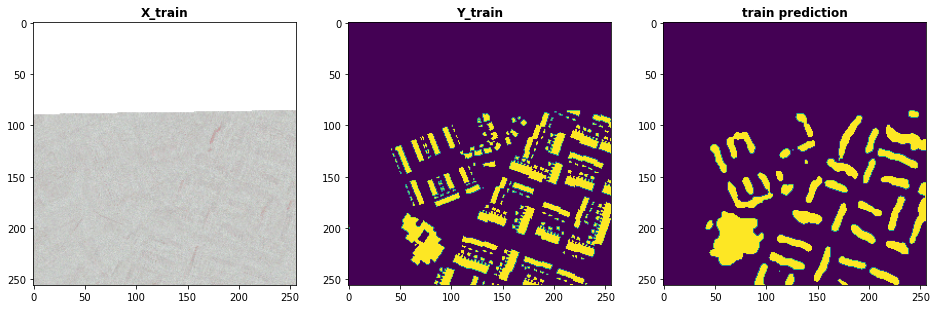

index: 13
val preds  set


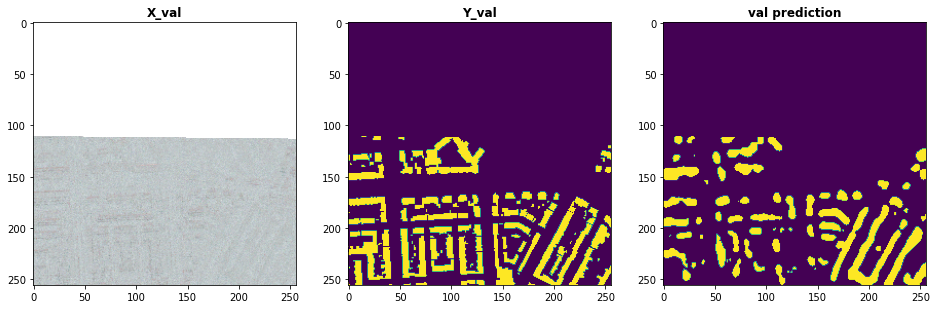

index: 27
test preds  set


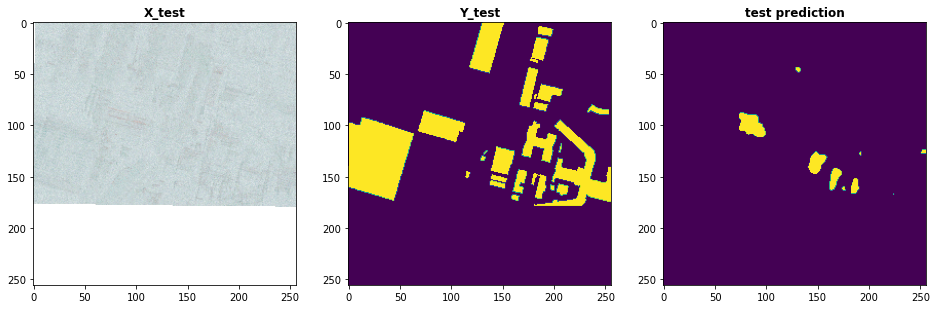

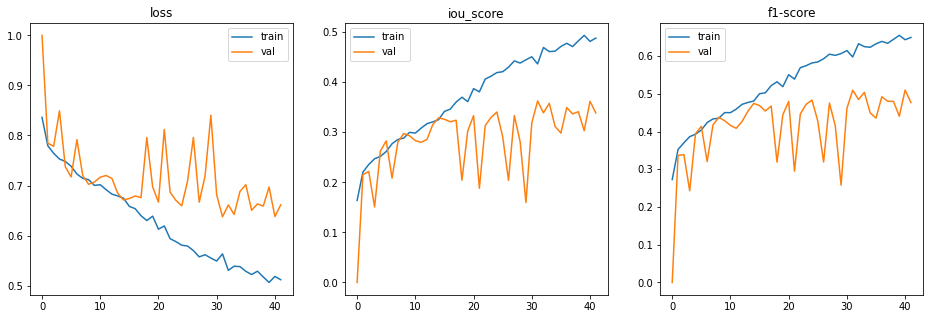

In [ ]:
''' plot predictions to visualize ''' 
plot_XY_preds('train preds', X_train[:MODEL_VAL_OFFSET], Y_train[:MODEL_VAL_OFFSET], preds_train_t, 'X_train', 'Y_train', 'train prediction')
plot_XY_preds('val preds', X_train[MODEL_VAL_OFFSET:], Y_train[MODEL_VAL_OFFSET:], preds_val_t, 'X_val', 'Y_val', 'val prediction')
plot_XY_preds('test preds', X_test, Y_test, preds_test_t, 'X_test', 'Y_test', 'test prediction')
if results != None:
  plot_history(results.history)

### ID 82. BinaryFocalLoss(alpha=0.25, gamma=2.0)

In [ ]:
''' set the train/test ''' 
IMG_TYPE, IMG_WIDTH, IMG_HEIGHT, IMG_ROTATED, IMG_CHANNELS, IMG_DTYPE_SRC, IMG_DTYPE = gen_input_image_details('SAR-Intensity', False)       # CHANGE HERE
PATH_SRC, PATH_SRC_IMAGE, PATH_SRC_MASK, PATH_DATA, PATH_IMAGE, PATH_MASK, PATH_SAMPLE, PATH_SAVED_MODELS = gen_paths(IMG_TYPE, IMG_ROTATED)
if IMG_ROTATED:
  X_train, Y_train, X_test, Y_test = X_train_rotate, Y_train_rotate, X_test_rotate, Y_test_rotate
else:
  X_train, Y_train, X_test, Y_test = X_train_no_rotate, Y_train_no_rotate, X_test_no_rotate, Y_test_no_rotate

gen_input_image_details()
IMG_TYPE: SAR-Intensity, IMG_HEIGHT: 256, IMG_WIDTH: 256, IMG_ROTATED: False, IMG_CHANNELS: 4, IMG_DTYPE_SRC: <class 'numpy.float32'>, IMG_DTYPE: <class 'numpy.uint8'>

gen_paths()
PATH_SRC: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_BACKUP/train_all/AOI_11_Rotterdam, 
PATH_SRC_IMAGE: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_BACKUP/train_all/AOI_11_Rotterdam/SAR-Intensity, 
PATH_SRC_MASK: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_BACKUP/train_all/AOI_11_Rotterdam/_mask, 
PATH_DATA: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data/SAR-Intensity_256x256, 
PATH_IMAGE: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data/SAR-Intensity_256x256/image, 
PATH_MASK: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data/SAR-Intensity_256x256/mask, 
PATH_SAMPLE: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data/SAR-Intensity_256x256/sample, 
P

In [ ]:
''' set the model parameters, train model '''
MODEL_OPTIMIZER, MODEL_LOSS, MODEL_METRICS, MODEL_VAL_SPLIT, MODEL_VAL_OFFSET, MODEL_BATCH_SIZE, MODEL_EPOCHS, MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, MODEL_COMMENTS, MODEL_ID, MODEL_NAME, model = gen_model(
     BinaryFocalLoss(alpha=0.25, gamma=2.0), 4, 100, 'segmentation-models Unet', 'efficientnetb0', ' BinaryFocalLoss(alpha=0.25, gamma=2.0)', IMG_CHANNELS, MODEL_ID=82, MODEL_COMMENTS='loss function test, early stopping patience 10')          # CHANGE HERE

results, model = gen_model_results(PATH_SAVED_MODELS, MODEL_NAME, X_train, Y_train, MODEL_BATCH_SIZE, MODEL_EPOCHS, MODEL_VAL_SPLIT, 
                                   load_weights_filename='', load_weights_epochs=0, save_model=True)                                            # CHANGE HERE

/usr/local/lib/python3.6/dist-packages/keras_applications/imagenet_utils.py:279: UserWarning: This model usually expects 1 or 3 input channels. However, it was passed an input_shape with 4 input channels.
  str(input_shape[-1]) + ' input channels.')


No weights loaded. Training new model
Train on 720 samples, validate on 80 samples
Epoch 1/100
720/720 [==============================] - 93s 130ms/step - loss: 0.0235 - iou_score: 0.0725 - f1-score: 0.1336 - val_loss: 0.0237 - val_iou_score: 0.0790 - val_f1-score: 0.1438
Epoch 2/100
720/720 [==============================] - 66s 92ms/step - loss: 0.0179 - iou_score: 0.0856 - f1-score: 0.1561 - val_loss: 0.0276 - val_iou_score: 0.0953 - val_f1-score: 0.1700
Epoch 3/100
720/720 [==============================] - 67s 93ms/step - loss: 0.0176 - iou_score: 0.0890 - f1-score: 0.1616 - val_loss: 0.0214 - val_iou_score: 0.0953 - val_f1-score: 0.1704
Epoch 4/100
720/720 [==============================] - 67s 93ms/step - loss: 0.0173 - iou_score: 0.0908 - f1-score: 0.1643 - val_loss: 0.0191 - val_iou_score: 0.1129 - val_f1-score: 0.1981
Epoch 5/100
720/720 [==============================] - 67s 93ms/step - loss: 0.0170 - iou_score: 0.0950 - f1-score: 0.1713 - val_loss: 0.0194 - val_iou_score: 0

In [ ]:
''' predict using model '''
preds_train_t, preds_val_t, preds_test_t = gen_predictions(model, X_train, Y_train, X_test, Y_test, MODEL_VAL_OFFSET, IMG_TYPE, IMG_ROTATED, MODEL_NAME, MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, MODEL_COMMENTS, MODEL_BATCH_SIZE, MODEL_EPOCHS)

80/80 [==============================] - 1s 15ms/step
train set evaluation
720/720 [==============================] - 11s 15ms/step
loss :  0.010992982673148315
iou_score :  0.2051861435174942
f1-score :  0.3401948809623718

validation set evaluation
80/80 [==============================] - 1s 16ms/step
loss :  10.809255599975586
iou_score :  0.15417857468128204
f1-score :  0.26587387919425964

test set evaluation
80/80 [==============================] - 1s 15ms/step
loss :  0.02144451327621937
iou_score :  0.15186800062656403
f1-score :  0.2636127471923828
saved model metrics


index: 270
train preds  set


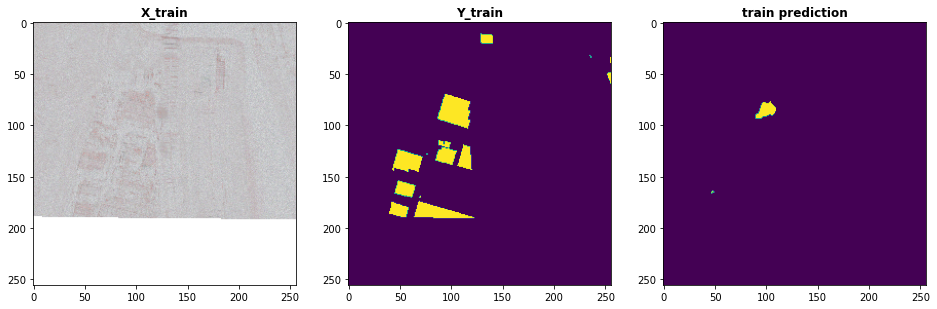

index: 9
val preds  set


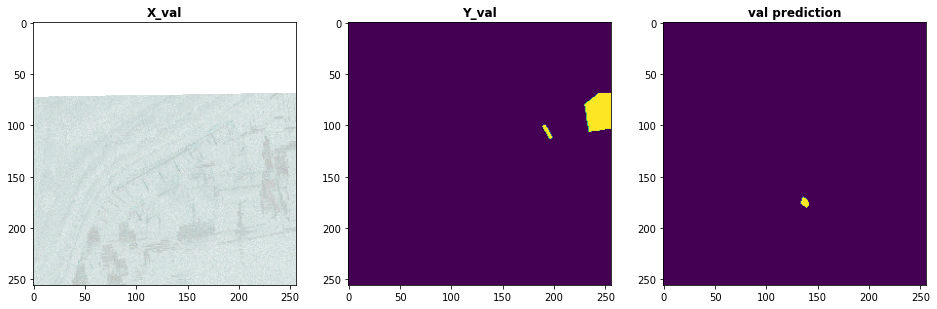

index: 50
test preds  set


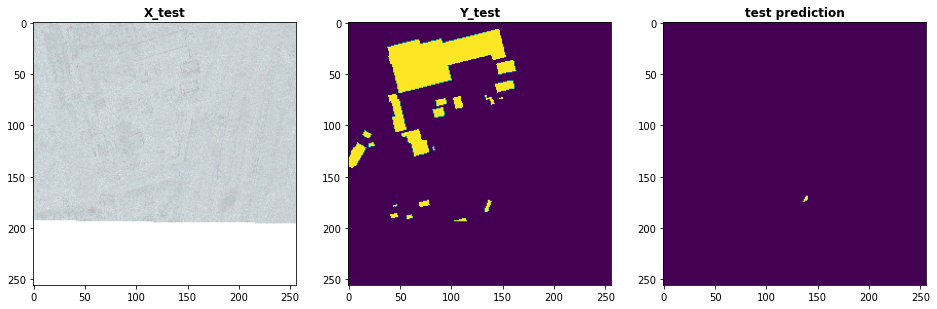

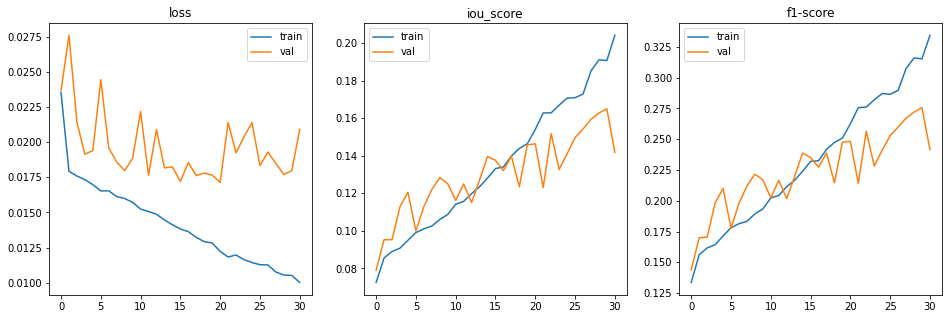

In [ ]:
''' plot predictions to visualize ''' 
plot_XY_preds('train preds', X_train[:MODEL_VAL_OFFSET], Y_train[:MODEL_VAL_OFFSET], preds_train_t, 'X_train', 'Y_train', 'train prediction')
plot_XY_preds('val preds', X_train[MODEL_VAL_OFFSET:], Y_train[MODEL_VAL_OFFSET:], preds_val_t, 'X_val', 'Y_val', 'val prediction')
plot_XY_preds('test preds', X_test, Y_test, preds_test_t, 'X_test', 'Y_test', 'test prediction')
if results != None:
  plot_history(results.history)

### ID 83. BinaryFocalLoss(alpha=0.5, gamma=2.0)

In [ ]:
''' set the train/test ''' 
IMG_TYPE, IMG_WIDTH, IMG_HEIGHT, IMG_ROTATED, IMG_CHANNELS, IMG_DTYPE_SRC, IMG_DTYPE = gen_input_image_details('SAR-Intensity', False)       # CHANGE HERE
PATH_SRC, PATH_SRC_IMAGE, PATH_SRC_MASK, PATH_DATA, PATH_IMAGE, PATH_MASK, PATH_SAMPLE, PATH_SAVED_MODELS = gen_paths(IMG_TYPE, IMG_ROTATED)
if IMG_ROTATED:
  X_train, Y_train, X_test, Y_test = X_train_rotate, Y_train_rotate, X_test_rotate, Y_test_rotate
else:
  X_train, Y_train, X_test, Y_test = X_train_no_rotate, Y_train_no_rotate, X_test_no_rotate, Y_test_no_rotate

gen_input_image_details()
IMG_TYPE: SAR-Intensity, IMG_HEIGHT: 256, IMG_WIDTH: 256, IMG_ROTATED: False, IMG_CHANNELS: 4, IMG_DTYPE_SRC: <class 'numpy.float32'>, IMG_DTYPE: <class 'numpy.uint8'>

gen_paths()
PATH_SRC: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_BACKUP/train_all/AOI_11_Rotterdam, 
PATH_SRC_IMAGE: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_BACKUP/train_all/AOI_11_Rotterdam/SAR-Intensity, 
PATH_SRC_MASK: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_BACKUP/train_all/AOI_11_Rotterdam/_mask, 
PATH_DATA: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data/SAR-Intensity_256x256, 
PATH_IMAGE: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data/SAR-Intensity_256x256/image, 
PATH_MASK: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data/SAR-Intensity_256x256/mask, 
PATH_SAMPLE: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data/SAR-Intensity_256x256/sample, 
P

In [ ]:
''' set the model parameters, train model '''
MODEL_OPTIMIZER, MODEL_LOSS, MODEL_METRICS, MODEL_VAL_SPLIT, MODEL_VAL_OFFSET, MODEL_BATCH_SIZE, MODEL_EPOCHS, MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, MODEL_COMMENTS, MODEL_ID, MODEL_NAME, model = gen_model(
     BinaryFocalLoss(alpha=0.5, gamma=2.0), 4, 100, 'segmentation-models Unet', 'efficientnetb0', ' BinaryFocalLoss(alpha=0.5, gamma=2.0)', IMG_CHANNELS, MODEL_ID=83, MODEL_COMMENTS='loss function test, early stopping patience 10')          # CHANGE HERE

results, model = gen_model_results(PATH_SAVED_MODELS, MODEL_NAME, X_train, Y_train, MODEL_BATCH_SIZE, MODEL_EPOCHS, MODEL_VAL_SPLIT, 
                                   load_weights_filename='', load_weights_epochs=0, save_model=True)                                            # CHANGE HERE

/usr/local/lib/python3.6/dist-packages/keras_applications/imagenet_utils.py:279: UserWarning: This model usually expects 1 or 3 input channels. However, it was passed an input_shape with 4 input channels.
  str(input_shape[-1]) + ' input channels.')


No weights loaded. Training new model
Train on 720 samples, validate on 80 samples
Epoch 1/100
720/720 [==============================] - 91s 127ms/step - loss: 0.0283 - iou_score: 0.0841 - f1-score: 0.1533 - val_loss: 0.0457 - val_iou_score: 0.0766 - val_f1-score: 0.1401
Epoch 2/100
720/720 [==============================] - 67s 93ms/step - loss: 0.0243 - iou_score: 0.0961 - f1-score: 0.1730 - val_loss: 0.0313 - val_iou_score: 0.1083 - val_f1-score: 0.1909
Epoch 3/100
720/720 [==============================] - 67s 93ms/step - loss: 0.0239 - iou_score: 0.1001 - f1-score: 0.1794 - val_loss: 0.0286 - val_iou_score: 0.1100 - val_f1-score: 0.1932
Epoch 4/100
720/720 [==============================] - 67s 92ms/step - loss: 0.0234 - iou_score: 0.1024 - f1-score: 0.1831 - val_loss: 0.0332 - val_iou_score: 0.1145 - val_f1-score: 0.2006
Epoch 5/100
720/720 [==============================] - 67s 92ms/step - loss: 0.0230 - iou_score: 0.1057 - f1-score: 0.1885 - val_loss: 0.0290 - val_iou_score: 0

In [ ]:
''' predict using model '''
preds_train_t, preds_val_t, preds_test_t = gen_predictions(model, X_train, Y_train, X_test, Y_test, MODEL_VAL_OFFSET, IMG_TYPE, IMG_ROTATED, MODEL_NAME, MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, MODEL_COMMENTS, MODEL_BATCH_SIZE, MODEL_EPOCHS)

80/80 [==============================] - 1s 15ms/step
train set evaluation
720/720 [==============================] - 11s 15ms/step
loss :  0.011987830284568998
iou_score :  0.23752260208129883
f1-score :  0.38341224193573

validation set evaluation
80/80 [==============================] - 1s 16ms/step
loss :  15.980504608154297
iou_score :  0.28591564297676086
f1-score :  0.44028162956237793

test set evaluation
80/80 [==============================] - 1s 15ms/step
loss :  0.022964001074433325
iou_score :  0.20007221400737762
f1-score :  0.33298832178115845
saved model metrics


index: 290
train preds  set


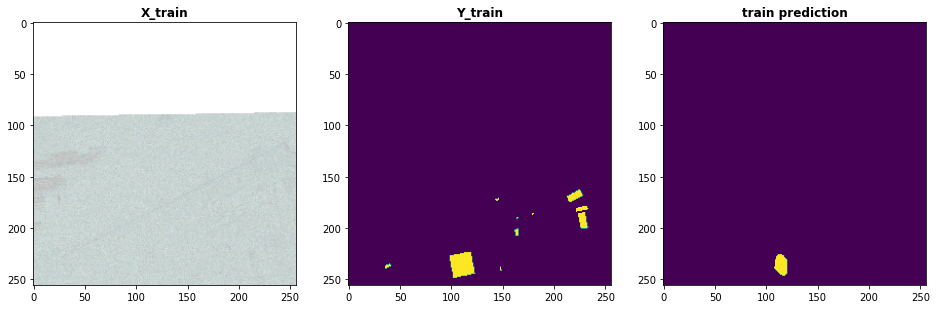

index: 73
val preds  set


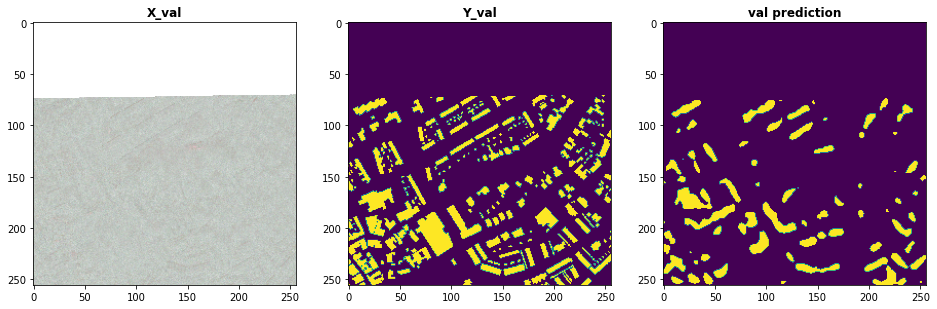

index: 1
test preds  set


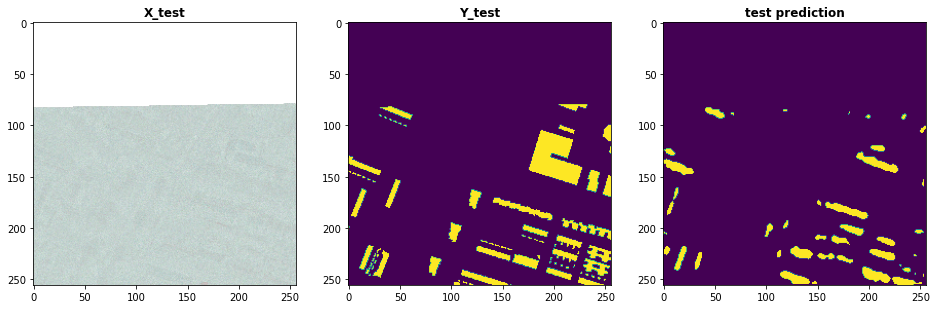

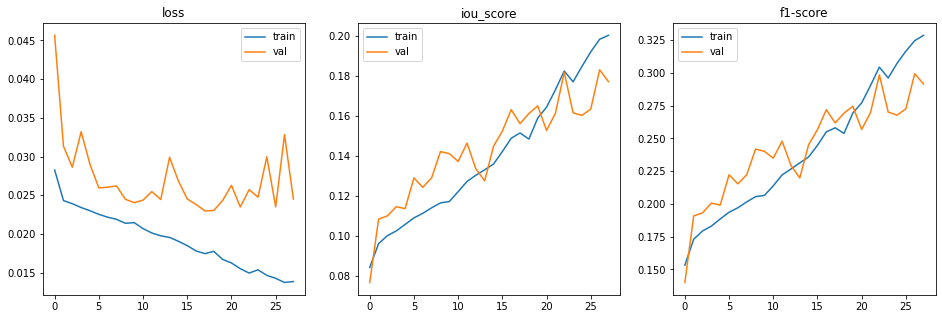

In [ ]:
''' plot predictions to visualize ''' 
plot_XY_preds('train preds', X_train[:MODEL_VAL_OFFSET], Y_train[:MODEL_VAL_OFFSET], preds_train_t, 'X_train', 'Y_train', 'train prediction')
plot_XY_preds('val preds', X_train[MODEL_VAL_OFFSET:], Y_train[MODEL_VAL_OFFSET:], preds_val_t, 'X_val', 'Y_val', 'val prediction')
plot_XY_preds('test preds', X_test, Y_test, preds_test_t, 'X_test', 'Y_test', 'test prediction')
if results != None:
  plot_history(results.history)

### ID 84. BinaryFocalLoss(alpha=0.75, gamma=2.0)

In [ ]:
''' set the train/test ''' 
IMG_TYPE, IMG_WIDTH, IMG_HEIGHT, IMG_ROTATED, IMG_CHANNELS, IMG_DTYPE_SRC, IMG_DTYPE = gen_input_image_details('SAR-Intensity', False)       # CHANGE HERE
PATH_SRC, PATH_SRC_IMAGE, PATH_SRC_MASK, PATH_DATA, PATH_IMAGE, PATH_MASK, PATH_SAMPLE, PATH_SAVED_MODELS = gen_paths(IMG_TYPE, IMG_ROTATED)
if IMG_ROTATED:
  X_train, Y_train, X_test, Y_test = X_train_rotate, Y_train_rotate, X_test_rotate, Y_test_rotate
else:
  X_train, Y_train, X_test, Y_test = X_train_no_rotate, Y_train_no_rotate, X_test_no_rotate, Y_test_no_rotate

gen_input_image_details()
IMG_TYPE: SAR-Intensity, IMG_HEIGHT: 256, IMG_WIDTH: 256, IMG_ROTATED: False, IMG_CHANNELS: 4, IMG_DTYPE_SRC: <class 'numpy.float32'>, IMG_DTYPE: <class 'numpy.uint8'>

gen_paths()
PATH_SRC: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_BACKUP/train_all/AOI_11_Rotterdam, 
PATH_SRC_IMAGE: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_BACKUP/train_all/AOI_11_Rotterdam/SAR-Intensity, 
PATH_SRC_MASK: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_BACKUP/train_all/AOI_11_Rotterdam/_mask, 
PATH_DATA: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data/SAR-Intensity_256x256, 
PATH_IMAGE: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data/SAR-Intensity_256x256/image, 
PATH_MASK: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data/SAR-Intensity_256x256/mask, 
PATH_SAMPLE: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data/SAR-Intensity_256x256/sample, 
P

In [ ]:
''' set the model parameters, train model '''
MODEL_OPTIMIZER, MODEL_LOSS, MODEL_METRICS, MODEL_VAL_SPLIT, MODEL_VAL_OFFSET, MODEL_BATCH_SIZE, MODEL_EPOCHS, MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, MODEL_COMMENTS, MODEL_ID, MODEL_NAME, model = gen_model(
     BinaryFocalLoss(alpha=0.75, gamma=2.0), 4, 100, 'segmentation-models Unet', 'efficientnetb0', ' BinaryFocalLoss(alpha=0.5, gamma=2.0)', IMG_CHANNELS, MODEL_ID=84, MODEL_COMMENTS='loss function test, early stopping patience 10')          # CHANGE HERE

results, model = gen_model_results(PATH_SAVED_MODELS, MODEL_NAME, X_train, Y_train, MODEL_BATCH_SIZE, MODEL_EPOCHS, MODEL_VAL_SPLIT, 
                                   load_weights_filename='', load_weights_epochs=0, save_model=True)                                            # CHANGE HERE

/usr/local/lib/python3.6/dist-packages/keras_applications/imagenet_utils.py:279: UserWarning: This model usually expects 1 or 3 input channels. However, it was passed an input_shape with 4 input channels.
  str(input_shape[-1]) + ' input channels.')


No weights loaded. Training new model
Train on 720 samples, validate on 80 samples
Epoch 1/100
720/720 [==============================] - 92s 128ms/step - loss: 0.0265 - iou_score: 0.0900 - f1-score: 0.1624 - val_loss: 0.0349 - val_iou_score: 0.1086 - val_f1-score: 0.1911
Epoch 2/100
720/720 [==============================] - 67s 93ms/step - loss: 0.0238 - iou_score: 0.0996 - f1-score: 0.1783 - val_loss: 0.0284 - val_iou_score: 0.1169 - val_f1-score: 0.2033
Epoch 3/100
720/720 [==============================] - 67s 93ms/step - loss: 0.0231 - iou_score: 0.1035 - f1-score: 0.1845 - val_loss: 0.0252 - val_iou_score: 0.1285 - val_f1-score: 0.2211
Epoch 4/100
720/720 [==============================] - 67s 93ms/step - loss: 0.0225 - iou_score: 0.1081 - f1-score: 0.1917 - val_loss: 0.0289 - val_iou_score: 0.1355 - val_f1-score: 0.2319
Epoch 5/100
720/720 [==============================] - 67s 93ms/step - loss: 0.0223 - iou_score: 0.1090 - f1-score: 0.1935 - val_loss: 0.0351 - val_iou_score: 0

In [ ]:
''' predict using model '''
preds_train_t, preds_val_t, preds_test_t = gen_predictions(model, X_train, Y_train, X_test, Y_test, MODEL_VAL_OFFSET, IMG_TYPE, IMG_ROTATED, MODEL_NAME, MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, MODEL_COMMENTS, MODEL_BATCH_SIZE, MODEL_EPOCHS)

80/80 [==============================] - 1s 15ms/step
train set evaluation
720/720 [==============================] - 11s 15ms/step
loss :  0.012428689334127638
iou_score :  0.2201533317565918
f1-score :  0.36041268706321716

validation set evaluation
80/80 [==============================] - 1s 15ms/step
loss :  22.11487560272217
iou_score :  0.411388635635376
f1-score :  0.5776172280311584

test set evaluation
80/80 [==============================] - 1s 15ms/step
loss :  0.022765568271279336
iou_score :  0.19564545154571533
f1-score :  0.3267272412776947
saved model metrics


index: 397
train preds  set


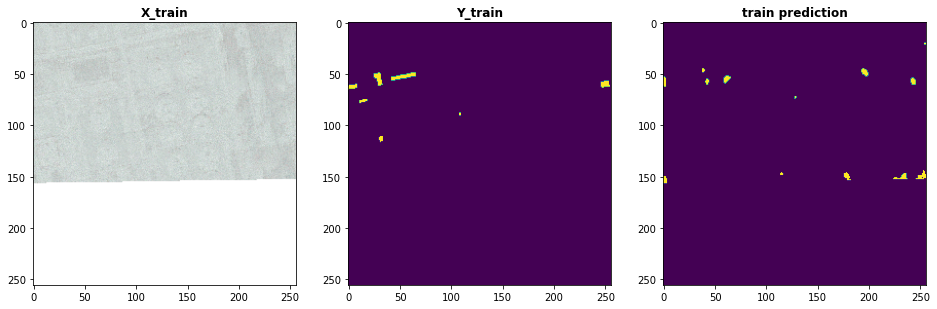

index: 32
val preds  set


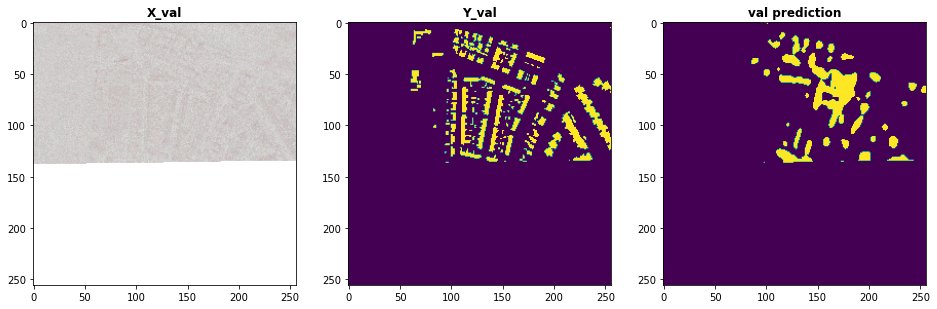

index: 26
test preds  set


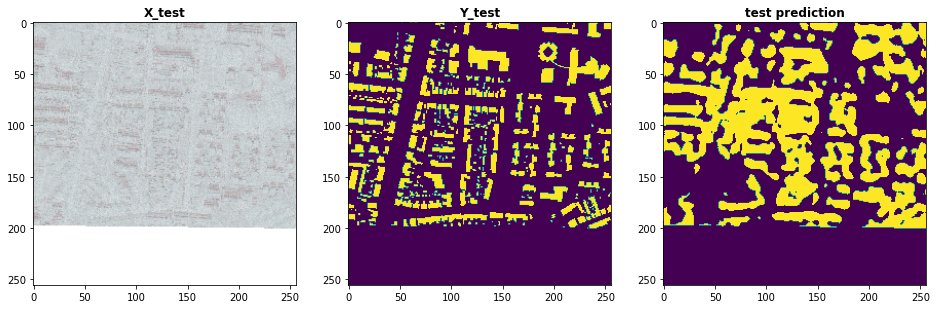

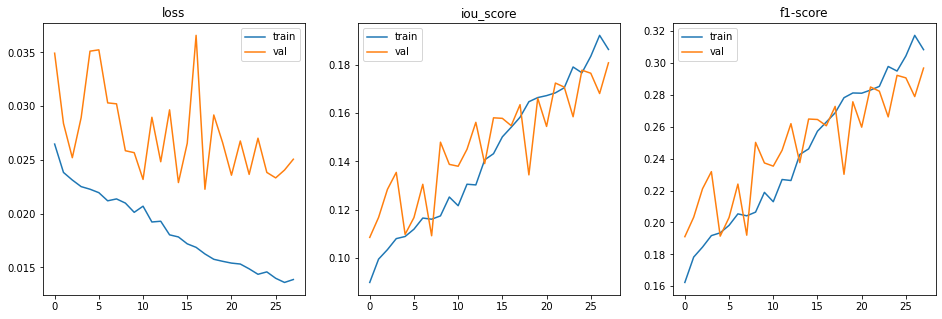

In [ ]:
''' plot predictions to visualize ''' 
plot_XY_preds('train preds', X_train[:MODEL_VAL_OFFSET], Y_train[:MODEL_VAL_OFFSET], preds_train_t, 'X_train', 'Y_train', 'train prediction')
plot_XY_preds('val preds', X_train[MODEL_VAL_OFFSET:], Y_train[MODEL_VAL_OFFSET:], preds_val_t, 'X_val', 'Y_val', 'val prediction')
plot_XY_preds('test preds', X_test, Y_test, preds_test_t, 'X_test', 'Y_test', 'test prediction')
if results != None:
  plot_history(results.history)

### ID 85. BinaryFocalLoss(alpha=1.0, gamma=2.0)

In [ ]:
''' set the train/test ''' 
IMG_TYPE, IMG_WIDTH, IMG_HEIGHT, IMG_ROTATED, IMG_CHANNELS, IMG_DTYPE_SRC, IMG_DTYPE = gen_input_image_details('SAR-Intensity', False)       # CHANGE HERE
PATH_SRC, PATH_SRC_IMAGE, PATH_SRC_MASK, PATH_DATA, PATH_IMAGE, PATH_MASK, PATH_SAMPLE, PATH_SAVED_MODELS = gen_paths(IMG_TYPE, IMG_ROTATED)
if IMG_ROTATED:
  X_train, Y_train, X_test, Y_test = X_train_rotate, Y_train_rotate, X_test_rotate, Y_test_rotate
else:
  X_train, Y_train, X_test, Y_test = X_train_no_rotate, Y_train_no_rotate, X_test_no_rotate, Y_test_no_rotate

gen_input_image_details()
IMG_TYPE: SAR-Intensity, IMG_HEIGHT: 256, IMG_WIDTH: 256, IMG_ROTATED: False, IMG_CHANNELS: 4, IMG_DTYPE_SRC: <class 'numpy.float32'>, IMG_DTYPE: <class 'numpy.uint8'>

gen_paths()
PATH_SRC: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_BACKUP/train_all/AOI_11_Rotterdam, 
PATH_SRC_IMAGE: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_BACKUP/train_all/AOI_11_Rotterdam/SAR-Intensity, 
PATH_SRC_MASK: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_BACKUP/train_all/AOI_11_Rotterdam/_mask, 
PATH_DATA: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data/SAR-Intensity_256x256, 
PATH_IMAGE: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data/SAR-Intensity_256x256/image, 
PATH_MASK: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data/SAR-Intensity_256x256/mask, 
PATH_SAMPLE: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data/SAR-Intensity_256x256/sample, 
P

In [ ]:
''' set the model parameters, train model '''
MODEL_OPTIMIZER, MODEL_LOSS, MODEL_METRICS, MODEL_VAL_SPLIT, MODEL_VAL_OFFSET, MODEL_BATCH_SIZE, MODEL_EPOCHS, MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, MODEL_COMMENTS, MODEL_ID, MODEL_NAME, model = gen_model(
     BinaryFocalLoss(alpha=1.0, gamma=2.0), 4, 100, 'segmentation-models Unet', 'efficientnetb0', ' BinaryFocalLoss(alpha=1.0, gamma=2.0)', IMG_CHANNELS, MODEL_ID=85, MODEL_COMMENTS='loss function test, early stopping patience 10')          # CHANGE HERE

results, model = gen_model_results(PATH_SAVED_MODELS, MODEL_NAME, X_train, Y_train, MODEL_BATCH_SIZE, MODEL_EPOCHS, MODEL_VAL_SPLIT, 
                                   load_weights_filename='', load_weights_epochs=0, save_model=True)                                            # CHANGE HERE

/usr/local/lib/python3.6/dist-packages/keras_applications/imagenet_utils.py:279: UserWarning: This model usually expects 1 or 3 input channels. However, it was passed an input_shape with 4 input channels.
  str(input_shape[-1]) + ' input channels.')


No weights loaded. Training new model
Train on 720 samples, validate on 80 samples
Epoch 1/100
720/720 [==============================] - 89s 123ms/step - loss: 1.6211e-04 - iou_score: 0.0823 - f1-score: 0.1494 - val_loss: 1.0470e-04 - val_iou_score: 0.1050 - val_f1-score: 0.1840
Epoch 2/100
720/720 [==============================] - 66s 92ms/step - loss: 3.6358e-06 - iou_score: 0.0839 - f1-score: 0.1523 - val_loss: 9.7454e-06 - val_iou_score: 0.1067 - val_f1-score: 0.1868
Epoch 3/100
720/720 [==============================] - 66s 92ms/step - loss: 1.7721e-06 - iou_score: 0.0843 - f1-score: 0.1520 - val_loss: 1.8158e-06 - val_iou_score: 0.1054 - val_f1-score: 0.1850
Epoch 4/100
720/720 [==============================] - 66s 92ms/step - loss: 1.0851e-06 - iou_score: 0.0845 - f1-score: 0.1528 - val_loss: 8.2274e-07 - val_iou_score: 0.1055 - val_f1-score: 0.1852
Epoch 5/100
720/720 [==============================] - 66s 92ms/step - loss: 6.5103e-07 - iou_score: 0.0847 - f1-score: 0.1536 -

In [ ]:
''' predict using model '''
preds_train_t, preds_val_t, preds_test_t = gen_predictions(model, X_train, Y_train, X_test, Y_test, MODEL_VAL_OFFSET, IMG_TYPE, IMG_ROTATED, MODEL_NAME, MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, MODEL_COMMENTS, MODEL_BATCH_SIZE, MODEL_EPOCHS)

80/80 [==============================] - 1s 15ms/step
train set evaluation
720/720 [==============================] - 11s 15ms/step
loss :  1.4840288809553966e-09
iou_score :  0.08348271995782852
f1-score :  0.15373697876930237

validation set evaluation
80/80 [==============================] - 1s 16ms/step
loss :  2.0720613065350334e-07
iou_score :  25.2896728515625
f1-score :  1.9231010675430298

test set evaluation
80/80 [==============================] - 1s 15ms/step
loss :  8.796531170141009e-10
iou_score :  0.09731581062078476
f1-score :  0.17687492072582245
saved model metrics


index: 42
train preds  set


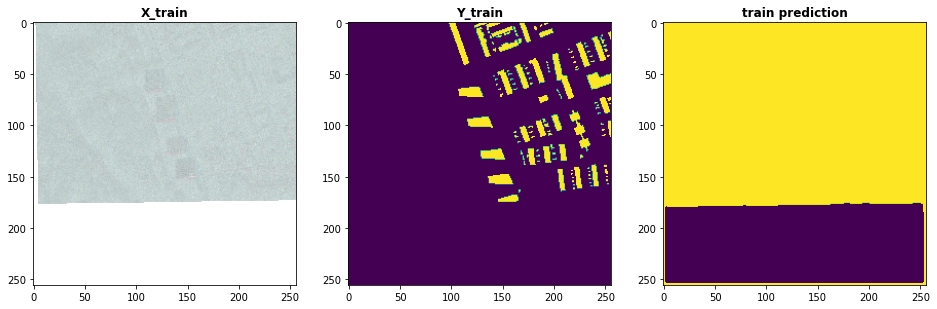

index: 12
val preds  set


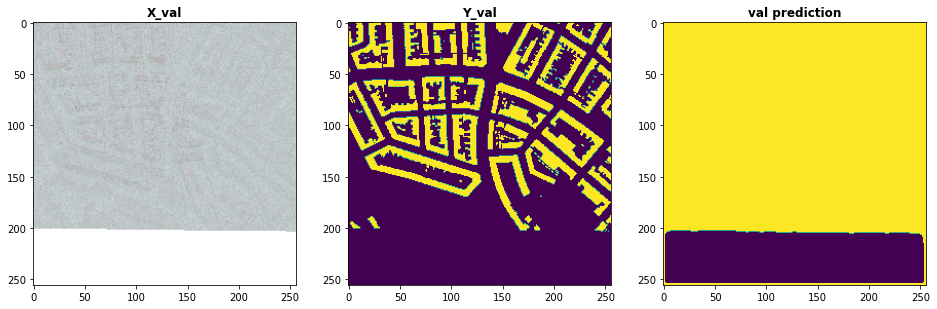

index: 76
test preds  set


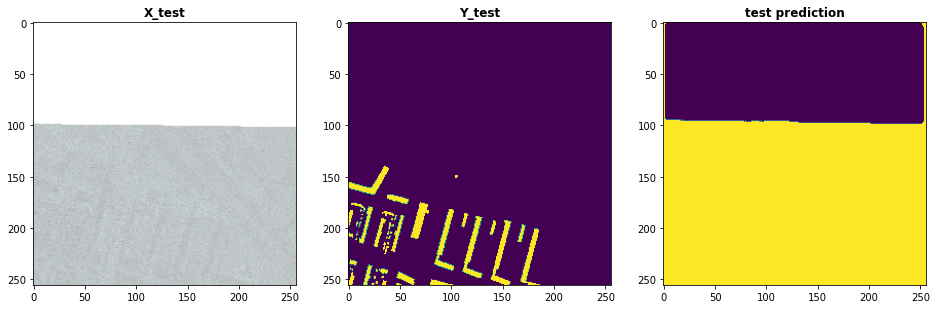

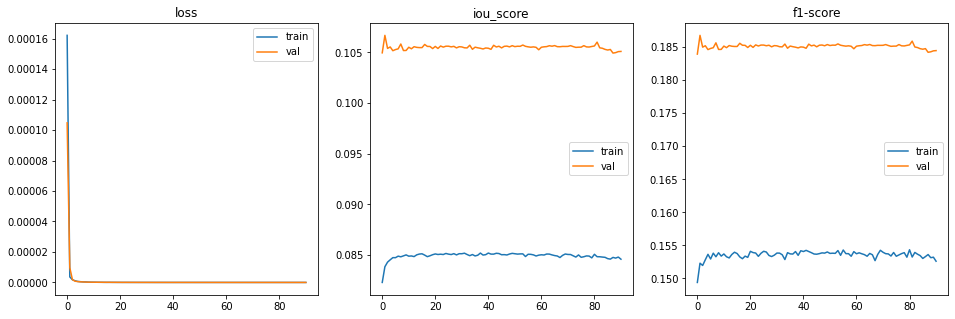

In [ ]:
''' plot predictions to visualize ''' 
plot_XY_preds('train preds', X_train[:MODEL_VAL_OFFSET], Y_train[:MODEL_VAL_OFFSET], preds_train_t, 'X_train', 'Y_train', 'train prediction')
plot_XY_preds('val preds', X_train[MODEL_VAL_OFFSET:], Y_train[MODEL_VAL_OFFSET:], preds_val_t, 'X_val', 'Y_val', 'val prediction')
plot_XY_preds('test preds', X_test, Y_test, preds_test_t, 'X_test', 'Y_test', 'test prediction')
if results != None:
  plot_history(results.history)

### ID 86. BinaryFocalLoss(alpha=0.5, gamma=1.5)

In [ ]:
''' set the train/test ''' 
IMG_TYPE, IMG_WIDTH, IMG_HEIGHT, IMG_ROTATED, IMG_CHANNELS, IMG_DTYPE_SRC, IMG_DTYPE = gen_input_image_details('SAR-Intensity', False)       # CHANGE HERE
PATH_SRC, PATH_SRC_IMAGE, PATH_SRC_MASK, PATH_DATA, PATH_IMAGE, PATH_MASK, PATH_SAMPLE, PATH_SAVED_MODELS = gen_paths(IMG_TYPE, IMG_ROTATED)
if IMG_ROTATED:
  X_train, Y_train, X_test, Y_test = X_train_rotate, Y_train_rotate, X_test_rotate, Y_test_rotate
else:
  X_train, Y_train, X_test, Y_test = X_train_no_rotate, Y_train_no_rotate, X_test_no_rotate, Y_test_no_rotate

gen_input_image_details()
IMG_TYPE: SAR-Intensity, IMG_HEIGHT: 256, IMG_WIDTH: 256, IMG_ROTATED: False, IMG_CHANNELS: 4, IMG_DTYPE_SRC: <class 'numpy.float32'>, IMG_DTYPE: <class 'numpy.uint8'>

gen_paths()
PATH_SRC: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_BACKUP/train_all/AOI_11_Rotterdam, 
PATH_SRC_IMAGE: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_BACKUP/train_all/AOI_11_Rotterdam/SAR-Intensity, 
PATH_SRC_MASK: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_BACKUP/train_all/AOI_11_Rotterdam/_mask, 
PATH_DATA: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data/SAR-Intensity_256x256, 
PATH_IMAGE: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data/SAR-Intensity_256x256/image, 
PATH_MASK: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data/SAR-Intensity_256x256/mask, 
PATH_SAMPLE: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data/SAR-Intensity_256x256/sample, 
P

In [ ]:
''' set the model parameters, train model '''
MODEL_OPTIMIZER, MODEL_LOSS, MODEL_METRICS, MODEL_VAL_SPLIT, MODEL_VAL_OFFSET, MODEL_BATCH_SIZE, MODEL_EPOCHS, MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, MODEL_COMMENTS, MODEL_ID, MODEL_NAME, model = gen_model(
     BinaryFocalLoss(alpha=0.5, gamma=1.5), 4, 100, 'segmentation-models Unet', 'efficientnetb0', ' BinaryFocalLoss(alpha=0.5, gamma=1.5)', IMG_CHANNELS, MODEL_ID=86, MODEL_COMMENTS='loss function test, early stopping patience 10')          # CHANGE HERE

results, model = gen_model_results(PATH_SAVED_MODELS, MODEL_NAME, X_train, Y_train, MODEL_BATCH_SIZE, MODEL_EPOCHS, MODEL_VAL_SPLIT, 
                                   load_weights_filename='', load_weights_epochs=0, save_model=True)                                            # CHANGE HERE

/usr/local/lib/python3.6/dist-packages/keras_applications/imagenet_utils.py:279: UserWarning: This model usually expects 1 or 3 input channels. However, it was passed an input_shape with 4 input channels.
  str(input_shape[-1]) + ' input channels.')


No weights loaded. Training new model
Train on 720 samples, validate on 80 samples
Epoch 1/100
720/720 [==============================] - 90s 124ms/step - loss: 0.0401 - iou_score: 0.0818 - f1-score: 0.1495 - val_loss: 0.0647 - val_iou_score: 0.0771 - val_f1-score: 0.1408
Epoch 2/100
720/720 [==============================] - 66s 92ms/step - loss: 0.0344 - iou_score: 0.0955 - f1-score: 0.1716 - val_loss: 0.0402 - val_iou_score: 0.1168 - val_f1-score: 0.2040
Epoch 3/100
720/720 [==============================] - 66s 92ms/step - loss: 0.0333 - iou_score: 0.0997 - f1-score: 0.1781 - val_loss: 0.0412 - val_iou_score: 0.1143 - val_f1-score: 0.2004
Epoch 4/100
720/720 [==============================] - 66s 92ms/step - loss: 0.0325 - iou_score: 0.1067 - f1-score: 0.1904 - val_loss: 0.0435 - val_iou_score: 0.1263 - val_f1-score: 0.2189
Epoch 5/100
720/720 [==============================] - 66s 92ms/step - loss: 0.0320 - iou_score: 0.1086 - f1-score: 0.1931 - val_loss: 0.0363 - val_iou_score: 0

In [ ]:
''' predict using model '''
preds_train_t, preds_val_t, preds_test_t = gen_predictions(model, X_train, Y_train, X_test, Y_test, MODEL_VAL_OFFSET, IMG_TYPE, IMG_ROTATED, MODEL_NAME, MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, MODEL_COMMENTS, MODEL_BATCH_SIZE, MODEL_EPOCHS)

80/80 [==============================] - 1s 15ms/step
train set evaluation
720/720 [==============================] - 11s 15ms/step
loss :  0.01915004402399063
iou_score :  0.2574442923069
f1-score :  0.4088989198207855

validation set evaluation
80/80 [==============================] - 1s 16ms/step
loss :  22.735930252075196
iou_score :  0.22001004219055176
f1-score :  0.35714617371559143

test set evaluation
80/80 [==============================] - 1s 15ms/step
loss :  0.03888427577912808
iou_score :  0.1911848932504654
f1-score :  0.3208598792552948
saved model metrics


index: 206
train preds  set


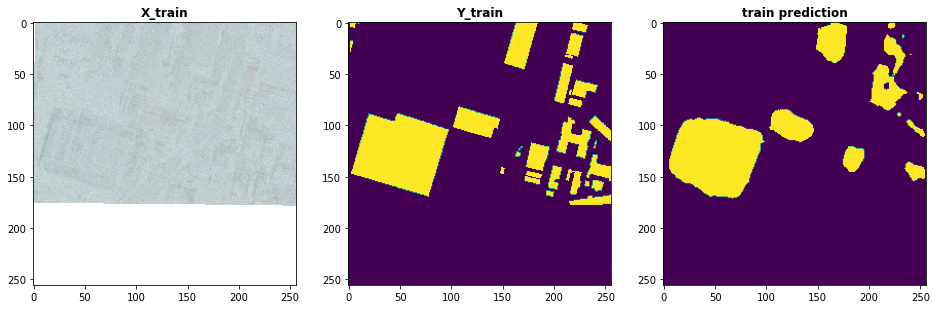

index: 32
val preds  set


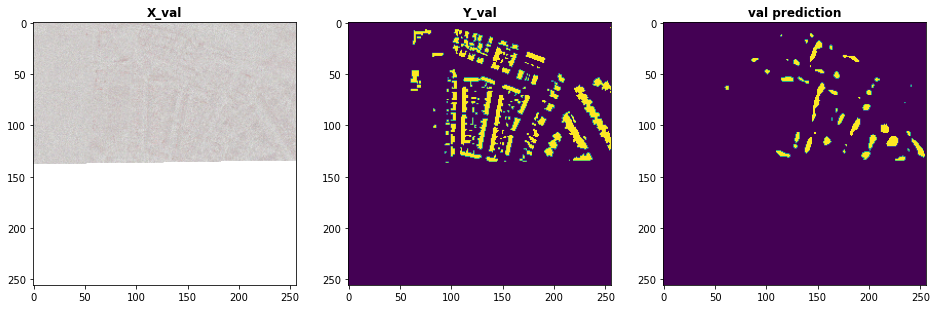

index: 67
test preds  set


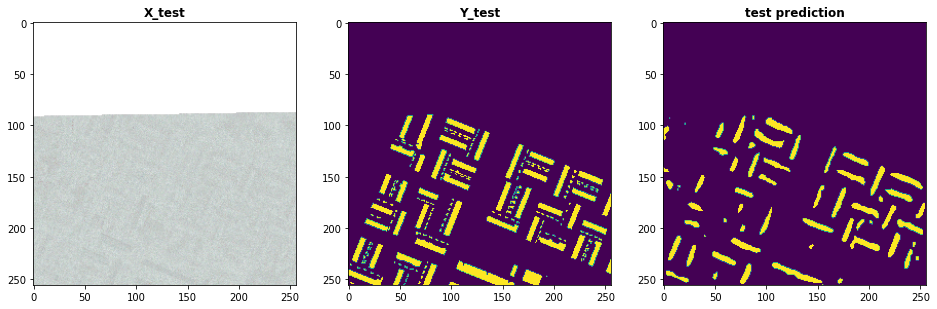

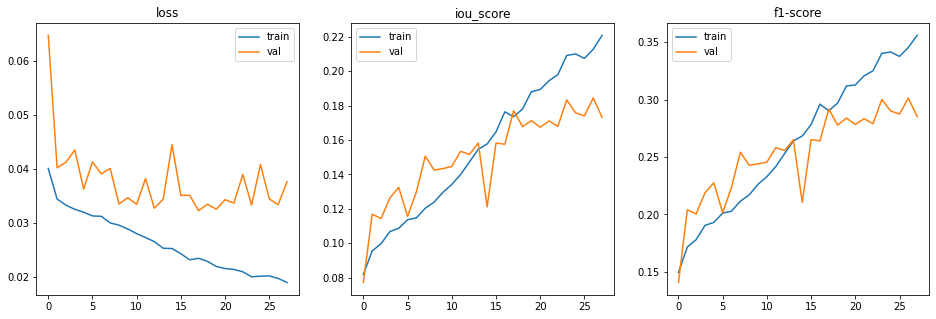

In [ ]:
''' plot predictions to visualize ''' 
plot_XY_preds('train preds', X_train[:MODEL_VAL_OFFSET], Y_train[:MODEL_VAL_OFFSET], preds_train_t, 'X_train', 'Y_train', 'train prediction')
plot_XY_preds('val preds', X_train[MODEL_VAL_OFFSET:], Y_train[MODEL_VAL_OFFSET:], preds_val_t, 'X_val', 'Y_val', 'val prediction')
plot_XY_preds('test preds', X_test, Y_test, preds_test_t, 'X_test', 'Y_test', 'test prediction')
if results != None:
  plot_history(results.history)

### ID 87. BinaryFocalLoss(alpha=0.5, gamma=1.0)

In [ ]:
''' set the train/test ''' 
IMG_TYPE, IMG_WIDTH, IMG_HEIGHT, IMG_ROTATED, IMG_CHANNELS, IMG_DTYPE_SRC, IMG_DTYPE = gen_input_image_details('SAR-Intensity', False)       # CHANGE HERE
PATH_SRC, PATH_SRC_IMAGE, PATH_SRC_MASK, PATH_DATA, PATH_IMAGE, PATH_MASK, PATH_SAMPLE, PATH_SAVED_MODELS = gen_paths(IMG_TYPE, IMG_ROTATED)
if IMG_ROTATED:
  X_train, Y_train, X_test, Y_test = X_train_rotate, Y_train_rotate, X_test_rotate, Y_test_rotate
else:
  X_train, Y_train, X_test, Y_test = X_train_no_rotate, Y_train_no_rotate, X_test_no_rotate, Y_test_no_rotate

gen_input_image_details()
IMG_TYPE: SAR-Intensity, IMG_HEIGHT: 256, IMG_WIDTH: 256, IMG_ROTATED: False, IMG_CHANNELS: 4, IMG_DTYPE_SRC: <class 'numpy.float32'>, IMG_DTYPE: <class 'numpy.uint8'>

gen_paths()
PATH_SRC: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_BACKUP/train_all/AOI_11_Rotterdam, 
PATH_SRC_IMAGE: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_BACKUP/train_all/AOI_11_Rotterdam/SAR-Intensity, 
PATH_SRC_MASK: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_BACKUP/train_all/AOI_11_Rotterdam/_mask, 
PATH_DATA: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data/SAR-Intensity_256x256, 
PATH_IMAGE: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data/SAR-Intensity_256x256/image, 
PATH_MASK: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data/SAR-Intensity_256x256/mask, 
PATH_SAMPLE: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data/SAR-Intensity_256x256/sample, 
P

In [ ]:
''' set the model parameters, train model '''
MODEL_OPTIMIZER, MODEL_LOSS, MODEL_METRICS, MODEL_VAL_SPLIT, MODEL_VAL_OFFSET, MODEL_BATCH_SIZE, MODEL_EPOCHS, MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, MODEL_COMMENTS, MODEL_ID, MODEL_NAME, model = gen_model(
     BinaryFocalLoss(alpha=0.5, gamma=1.0), 4, 100, 'segmentation-models Unet', 'efficientnetb0', ' BinaryFocalLoss(alpha=0.5, gamma=1.0)', IMG_CHANNELS, MODEL_ID=87, MODEL_COMMENTS='loss function test, early stopping patience 10')          # CHANGE HERE

results, model = gen_model_results(PATH_SAVED_MODELS, MODEL_NAME, X_train, Y_train, MODEL_BATCH_SIZE, MODEL_EPOCHS, MODEL_VAL_SPLIT, 
                                   load_weights_filename='', load_weights_epochs=0, save_model=True)                                            # CHANGE HERE

/usr/local/lib/python3.6/dist-packages/keras_applications/imagenet_utils.py:279: UserWarning: This model usually expects 1 or 3 input channels. However, it was passed an input_shape with 4 input channels.
  str(input_shape[-1]) + ' input channels.')


No weights loaded. Training new model
Train on 720 samples, validate on 80 samples
Epoch 1/100
720/720 [==============================] - 94s 131ms/step - loss: 0.0524 - iou_score: 0.0905 - f1-score: 0.1634 - val_loss: 0.1542 - val_iou_score: 0.0322 - val_f1-score: 0.0620
Epoch 2/100
720/720 [==============================] - 64s 89ms/step - loss: 0.0458 - iou_score: 0.1048 - f1-score: 0.1871 - val_loss: 0.0921 - val_iou_score: 0.0848 - val_f1-score: 0.1537
Epoch 3/100
720/720 [==============================] - 64s 89ms/step - loss: 0.0449 - iou_score: 0.1103 - f1-score: 0.1958 - val_loss: 0.0515 - val_iou_score: 0.1282 - val_f1-score: 0.2212
Epoch 4/100
720/720 [==============================] - 64s 89ms/step - loss: 0.0439 - iou_score: 0.1151 - f1-score: 0.2032 - val_loss: 0.0522 - val_iou_score: 0.1340 - val_f1-score: 0.2297
Epoch 5/100
720/720 [==============================] - 64s 89ms/step - loss: 0.0427 - iou_score: 0.1219 - f1-score: 0.2143 - val_loss: 0.0545 - val_iou_score: 0

In [ ]:
''' predict using model '''
preds_train_t, preds_val_t, preds_test_t = gen_predictions(model, X_train, Y_train, X_test, Y_test, MODEL_VAL_OFFSET, IMG_TYPE, IMG_ROTATED, MODEL_NAME, MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, MODEL_COMMENTS, MODEL_BATCH_SIZE, MODEL_EPOCHS)

80/80 [==============================] - 1s 15ms/step
train set evaluation
720/720 [==============================] - 11s 15ms/step
loss :  0.026073981076478958
iou_score :  0.33453699946403503
f1-score :  0.5006030201911926

validation set evaluation
80/80 [==============================] - 1s 16ms/step
loss :  37.881099700927734
iou_score :  0.14767961204051971
f1-score :  0.2547436058521271

test set evaluation
80/80 [==============================] - 1s 15ms/step
loss :  0.05119950324296951
iou_score :  0.2467312067747116
f1-score :  0.3956887722015381
saved model metrics


index: 407
train preds  set


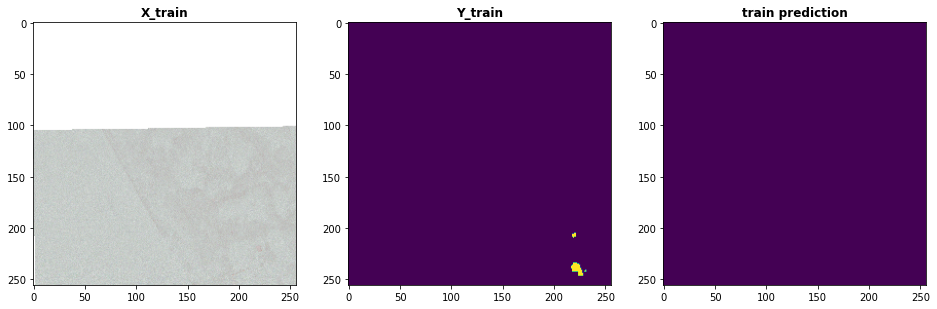

index: 41
val preds  set


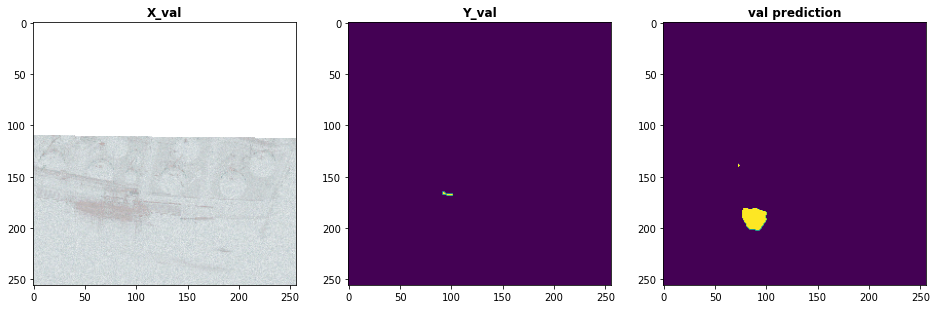

index: 64
test preds  set


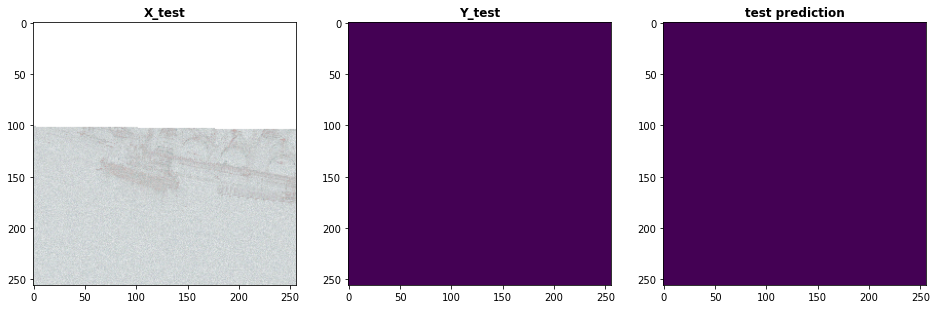

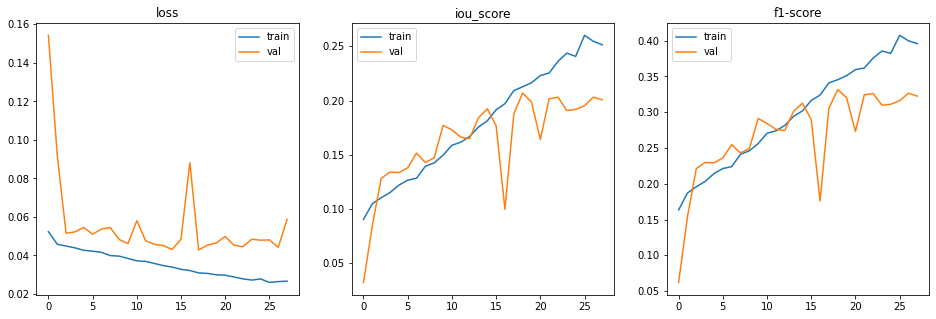

In [ ]:
''' plot predictions to visualize ''' 
plot_XY_preds('train preds', X_train[:MODEL_VAL_OFFSET], Y_train[:MODEL_VAL_OFFSET], preds_train_t, 'X_train', 'Y_train', 'train prediction')
plot_XY_preds('val preds', X_train[MODEL_VAL_OFFSET:], Y_train[MODEL_VAL_OFFSET:], preds_val_t, 'X_val', 'Y_val', 'val prediction')
plot_XY_preds('test preds', X_test, Y_test, preds_test_t, 'X_test', 'Y_test', 'test prediction')
if results != None:
  plot_history(results.history)

### ID 88. BinaryFocalLoss(alpha=0.5, gamma=0.5)

In [ ]:
''' set the train/test ''' 
IMG_TYPE, IMG_WIDTH, IMG_HEIGHT, IMG_ROTATED, IMG_CHANNELS, IMG_DTYPE_SRC, IMG_DTYPE = gen_input_image_details('SAR-Intensity', False)       # CHANGE HERE
PATH_SRC, PATH_SRC_IMAGE, PATH_SRC_MASK, PATH_DATA, PATH_IMAGE, PATH_MASK, PATH_SAMPLE, PATH_SAVED_MODELS = gen_paths(IMG_TYPE, IMG_ROTATED)
if IMG_ROTATED:
  X_train, Y_train, X_test, Y_test = X_train_rotate, Y_train_rotate, X_test_rotate, Y_test_rotate
else:
  X_train, Y_train, X_test, Y_test = X_train_no_rotate, Y_train_no_rotate, X_test_no_rotate, Y_test_no_rotate

gen_input_image_details()
IMG_TYPE: SAR-Intensity, IMG_HEIGHT: 256, IMG_WIDTH: 256, IMG_ROTATED: False, IMG_CHANNELS: 4, IMG_DTYPE_SRC: <class 'numpy.float32'>, IMG_DTYPE: <class 'numpy.uint8'>

gen_paths()
PATH_SRC: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_BACKUP/train_all/AOI_11_Rotterdam, 
PATH_SRC_IMAGE: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_BACKUP/train_all/AOI_11_Rotterdam/SAR-Intensity, 
PATH_SRC_MASK: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_BACKUP/train_all/AOI_11_Rotterdam/_mask, 
PATH_DATA: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data/SAR-Intensity_256x256, 
PATH_IMAGE: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data/SAR-Intensity_256x256/image, 
PATH_MASK: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data/SAR-Intensity_256x256/mask, 
PATH_SAMPLE: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data/SAR-Intensity_256x256/sample, 
P

In [ ]:
''' set the model parameters, train model '''
MODEL_OPTIMIZER, MODEL_LOSS, MODEL_METRICS, MODEL_VAL_SPLIT, MODEL_VAL_OFFSET, MODEL_BATCH_SIZE, MODEL_EPOCHS, MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, MODEL_COMMENTS, MODEL_ID, MODEL_NAME, model = gen_model(
     BinaryFocalLoss(alpha=0.5, gamma=0.5), 4, 100, 'segmentation-models Unet', 'efficientnetb0', ' BinaryFocalLoss(alpha=0.5, gamma=0.5)', IMG_CHANNELS, MODEL_ID=88, MODEL_COMMENTS='loss function test, early stopping patience 10')          # CHANGE HERE

results, model = gen_model_results(PATH_SAVED_MODELS, MODEL_NAME, X_train, Y_train, MODEL_BATCH_SIZE, MODEL_EPOCHS, MODEL_VAL_SPLIT, 
                                   load_weights_filename='', load_weights_epochs=0, save_model=True)                                            # CHANGE HERE

/usr/local/lib/python3.6/dist-packages/keras_applications/imagenet_utils.py:279: UserWarning: This model usually expects 1 or 3 input channels. However, it was passed an input_shape with 4 input channels.
  str(input_shape[-1]) + ' input channels.')


No weights loaded. Training new model
Train on 720 samples, validate on 80 samples
Epoch 1/100
720/720 [==============================] - 86s 119ms/step - loss: 0.0744 - iou_score: 0.0869 - f1-score: 0.1581 - val_loss: 0.1431 - val_iou_score: 0.0416 - val_f1-score: 0.0795
Epoch 2/100
720/720 [==============================] - 64s 89ms/step - loss: 0.0645 - iou_score: 0.1051 - f1-score: 0.1878 - val_loss: 0.0846 - val_iou_score: 0.0968 - val_f1-score: 0.1730
Epoch 3/100
720/720 [==============================] - 64s 89ms/step - loss: 0.0622 - iou_score: 0.1140 - f1-score: 0.2020 - val_loss: 0.0760 - val_iou_score: 0.1326 - val_f1-score: 0.2283
Epoch 4/100
720/720 [==============================] - 64s 89ms/step - loss: 0.0617 - iou_score: 0.1178 - f1-score: 0.2080 - val_loss: 0.0702 - val_iou_score: 0.1372 - val_f1-score: 0.2350
Epoch 5/100
720/720 [==============================] - 64s 89ms/step - loss: 0.0603 - iou_score: 0.1229 - f1-score: 0.2160 - val_loss: 0.0687 - val_iou_score: 0

In [ ]:
''' predict using model '''
preds_train_t, preds_val_t, preds_test_t = gen_predictions(model, X_train, Y_train, X_test, Y_test, MODEL_VAL_OFFSET, IMG_TYPE, IMG_ROTATED, MODEL_NAME, MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, MODEL_COMMENTS, MODEL_BATCH_SIZE, MODEL_EPOCHS)

80/80 [==============================] - 1s 15ms/step
train set evaluation
720/720 [==============================] - 11s 15ms/step
loss :  0.028816414831413163
iou_score :  0.38171258568763733
f1-score :  0.5516438484191895

validation set evaluation
80/80 [==============================] - 1s 16ms/step
loss :  32.36327629089355
iou_score :  0.1778174638748169
f1-score :  0.299719899892807

test set evaluation
80/80 [==============================] - 1s 15ms/step
loss :  0.061029963195323944
iou_score :  0.2600294053554535
f1-score :  0.4122253954410553
saved model metrics


index: 413
train preds  set


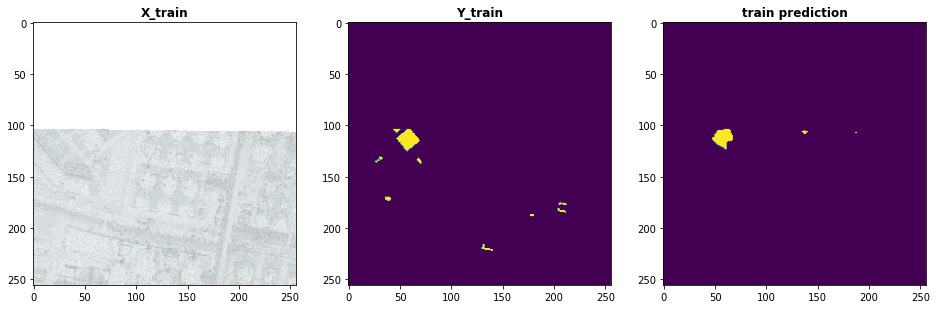

index: 27
val preds  set


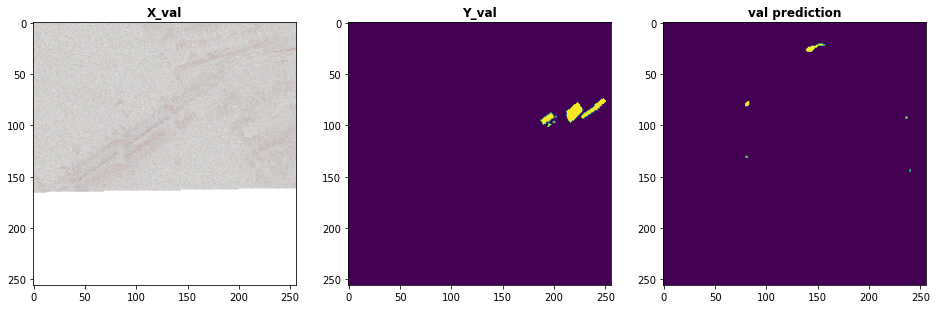

index: 33
test preds  set


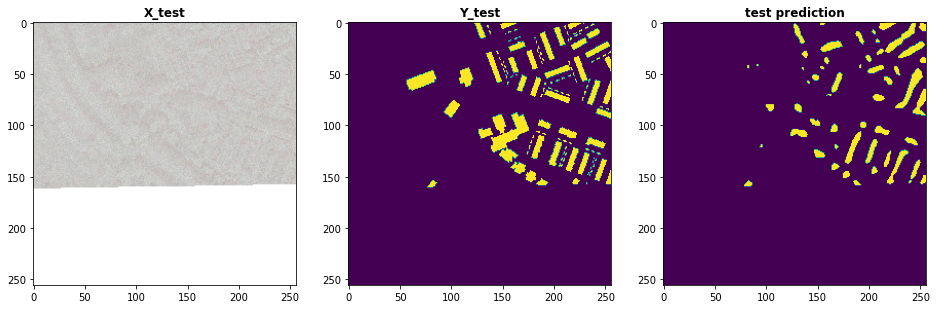

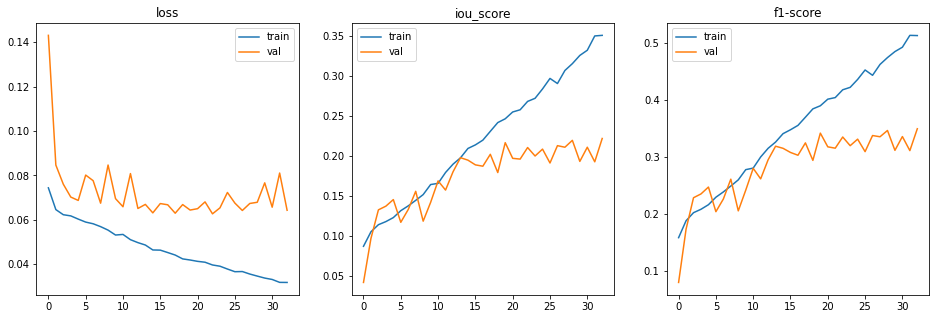

In [ ]:
''' plot predictions to visualize ''' 
plot_XY_preds('train preds', X_train[:MODEL_VAL_OFFSET], Y_train[:MODEL_VAL_OFFSET], preds_train_t, 'X_train', 'Y_train', 'train prediction')
plot_XY_preds('val preds', X_train[MODEL_VAL_OFFSET:], Y_train[MODEL_VAL_OFFSET:], preds_val_t, 'X_val', 'Y_val', 'val prediction')
plot_XY_preds('test preds', X_test, Y_test, preds_test_t, 'X_test', 'Y_test', 'test prediction')
if results != None:
  plot_history(results.history)

### ID 89. BinaryFocalLoss(alpha=0.5, gamma=0.75)

In [ ]:
''' set the train/test ''' 
IMG_TYPE, IMG_WIDTH, IMG_HEIGHT, IMG_ROTATED, IMG_CHANNELS, IMG_DTYPE_SRC, IMG_DTYPE = gen_input_image_details('SAR-Intensity', False)       # CHANGE HERE
PATH_SRC, PATH_SRC_IMAGE, PATH_SRC_MASK, PATH_DATA, PATH_IMAGE, PATH_MASK, PATH_SAMPLE, PATH_SAVED_MODELS = gen_paths(IMG_TYPE, IMG_ROTATED)
if IMG_ROTATED:
  X_train, Y_train, X_test, Y_test = X_train_rotate, Y_train_rotate, X_test_rotate, Y_test_rotate
else:
  X_train, Y_train, X_test, Y_test = X_train_no_rotate, Y_train_no_rotate, X_test_no_rotate, Y_test_no_rotate

gen_input_image_details()
IMG_TYPE: SAR-Intensity, IMG_HEIGHT: 256, IMG_WIDTH: 256, IMG_ROTATED: False, IMG_CHANNELS: 4, IMG_DTYPE_SRC: <class 'numpy.float32'>, IMG_DTYPE: <class 'numpy.uint8'>

gen_paths()
PATH_SRC: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_BACKUP/train_all/AOI_11_Rotterdam, 
PATH_SRC_IMAGE: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_BACKUP/train_all/AOI_11_Rotterdam/SAR-Intensity, 
PATH_SRC_MASK: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_BACKUP/train_all/AOI_11_Rotterdam/_mask, 
PATH_DATA: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data/SAR-Intensity_256x256, 
PATH_IMAGE: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data/SAR-Intensity_256x256/image, 
PATH_MASK: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data/SAR-Intensity_256x256/mask, 
PATH_SAMPLE: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data/SAR-Intensity_256x256/sample, 
P

In [ ]:
''' set the model parameters, train model '''
MODEL_OPTIMIZER, MODEL_LOSS, MODEL_METRICS, MODEL_VAL_SPLIT, MODEL_VAL_OFFSET, MODEL_BATCH_SIZE, MODEL_EPOCHS, MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, MODEL_COMMENTS, MODEL_ID, MODEL_NAME, model = gen_model(
     BinaryFocalLoss(alpha=0.5, gamma=0.75), 4, 100, 'segmentation-models Unet', 'efficientnetb0', ' BinaryFocalLoss(alpha=0.5, gamma=0.75)', IMG_CHANNELS, MODEL_ID=89, MODEL_COMMENTS='loss function test, early stopping patience 10')          # CHANGE HERE

results, model = gen_model_results(PATH_SAVED_MODELS, MODEL_NAME, X_train, Y_train, MODEL_BATCH_SIZE, MODEL_EPOCHS, MODEL_VAL_SPLIT, 
                                   load_weights_filename='', load_weights_epochs=0, save_model=True)                                            # CHANGE HERE

/usr/local/lib/python3.6/dist-packages/keras_applications/imagenet_utils.py:279: UserWarning: This model usually expects 1 or 3 input channels. However, it was passed an input_shape with 4 input channels.
  str(input_shape[-1]) + ' input channels.')


No weights loaded. Training new model
Train on 720 samples, validate on 80 samples
Epoch 1/100
720/720 [==============================] - 98s 136ms/step - loss: 0.0684 - iou_score: 0.0808 - f1-score: 0.1477 - val_loss: 0.0753 - val_iou_score: 0.0901 - val_f1-score: 0.1623
Epoch 2/100
720/720 [==============================] - 64s 89ms/step - loss: 0.0556 - iou_score: 0.1016 - f1-score: 0.1823 - val_loss: 0.0696 - val_iou_score: 0.0993 - val_f1-score: 0.1766
Epoch 3/100
720/720 [==============================] - 65s 90ms/step - loss: 0.0531 - iou_score: 0.1109 - f1-score: 0.1973 - val_loss: 0.0734 - val_iou_score: 0.0930 - val_f1-score: 0.1667
Epoch 4/100
720/720 [==============================] - 64s 90ms/step - loss: 0.0521 - iou_score: 0.1169 - f1-score: 0.2068 - val_loss: 0.0635 - val_iou_score: 0.1376 - val_f1-score: 0.2353
Epoch 5/100
720/720 [==============================] - 65s 90ms/step - loss: 0.0515 - iou_score: 0.1214 - f1-score: 0.2139 - val_loss: 0.0584 - val_iou_score: 0

In [ ]:
''' predict using model '''
preds_train_t, preds_val_t, preds_test_t = gen_predictions(model, X_train, Y_train, X_test, Y_test, MODEL_VAL_OFFSET, IMG_TYPE, IMG_ROTATED, MODEL_NAME, MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, MODEL_COMMENTS, MODEL_BATCH_SIZE, MODEL_EPOCHS)

80/80 [==============================] - 1s 15ms/step
train set evaluation
720/720 [==============================] - 11s 15ms/step
loss :  0.02647545010679298
iou_score :  0.3363613188266754
f1-score :  0.502687931060791

validation set evaluation
80/80 [==============================] - 1s 16ms/step
loss :  31.13165626525879
iou_score :  0.16826295852661133
f1-score :  0.2849659025669098

test set evaluation
80/80 [==============================] - 1s 15ms/step
loss :  0.053406932204961774
iou_score :  0.24494314193725586
f1-score :  0.39306363463401794
saved model metrics


index: 467
train preds  set


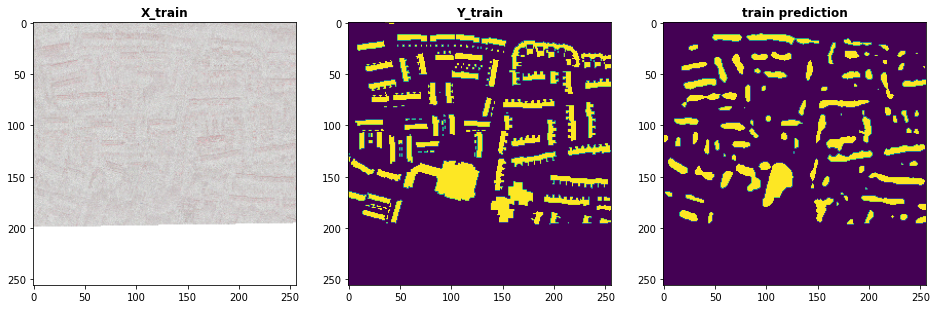

index: 55
val preds  set


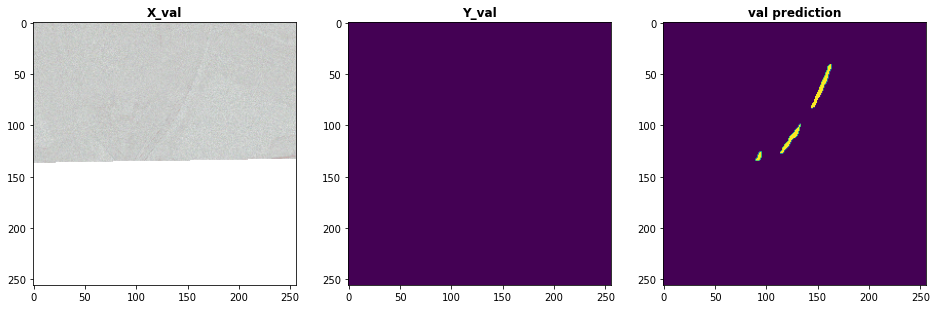

index: 23
test preds  set


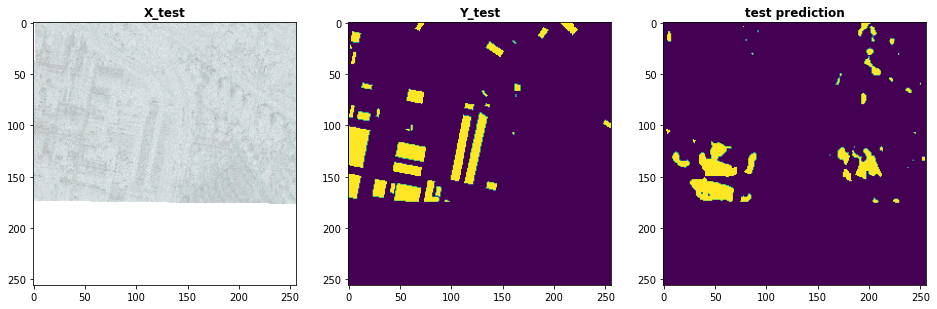

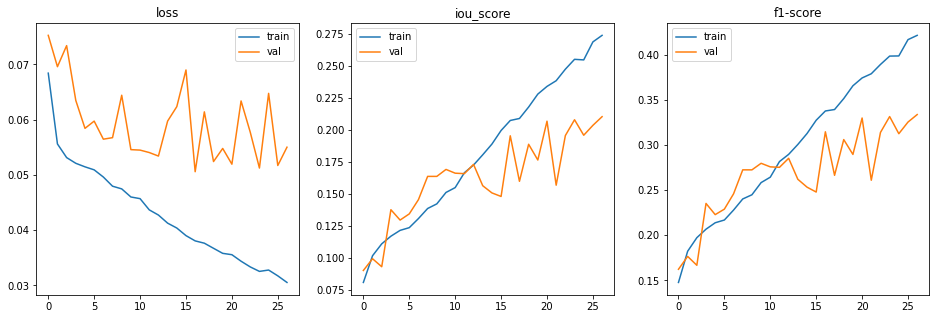

In [ ]:
''' plot predictions to visualize ''' 
plot_XY_preds('train preds', X_train[:MODEL_VAL_OFFSET], Y_train[:MODEL_VAL_OFFSET], preds_train_t, 'X_train', 'Y_train', 'train prediction')
plot_XY_preds('val preds', X_train[MODEL_VAL_OFFSET:], Y_train[MODEL_VAL_OFFSET:], preds_val_t, 'X_val', 'Y_val', 'val prediction')
plot_XY_preds('test preds', X_test, Y_test, preds_test_t, 'X_test', 'Y_test', 'test prediction')
if results != None:
  plot_history(results.history)

### ID 90. BinaryFocalLoss(alpha=0.25, gamma=0.5)

In [ ]:
''' set the train/test ''' 
IMG_TYPE, IMG_WIDTH, IMG_HEIGHT, IMG_ROTATED, IMG_CHANNELS, IMG_DTYPE_SRC, IMG_DTYPE = gen_input_image_details('SAR-Intensity', False)       # CHANGE HERE
PATH_SRC, PATH_SRC_IMAGE, PATH_SRC_MASK, PATH_DATA, PATH_IMAGE, PATH_MASK, PATH_SAMPLE, PATH_SAVED_MODELS = gen_paths(IMG_TYPE, IMG_ROTATED)
if IMG_ROTATED:
  X_train, Y_train, X_test, Y_test = X_train_rotate, Y_train_rotate, X_test_rotate, Y_test_rotate
else:
  X_train, Y_train, X_test, Y_test = X_train_no_rotate, Y_train_no_rotate, X_test_no_rotate, Y_test_no_rotate

gen_input_image_details()
IMG_TYPE: SAR-Intensity, IMG_HEIGHT: 256, IMG_WIDTH: 256, IMG_ROTATED: False, IMG_CHANNELS: 4, IMG_DTYPE_SRC: <class 'numpy.float32'>, IMG_DTYPE: <class 'numpy.uint8'>

gen_paths()
PATH_SRC: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_BACKUP/train_all/AOI_11_Rotterdam, 
PATH_SRC_IMAGE: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_BACKUP/train_all/AOI_11_Rotterdam/SAR-Intensity, 
PATH_SRC_MASK: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_BACKUP/train_all/AOI_11_Rotterdam/_mask, 
PATH_DATA: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data/SAR-Intensity_256x256, 
PATH_IMAGE: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data/SAR-Intensity_256x256/image, 
PATH_MASK: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data/SAR-Intensity_256x256/mask, 
PATH_SAMPLE: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data/SAR-Intensity_256x256/sample, 
P

In [ ]:
''' set the model parameters, train model '''
MODEL_OPTIMIZER, MODEL_LOSS, MODEL_METRICS, MODEL_VAL_SPLIT, MODEL_VAL_OFFSET, MODEL_BATCH_SIZE, MODEL_EPOCHS, MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, MODEL_COMMENTS, MODEL_ID, MODEL_NAME, model = gen_model(
     BinaryFocalLoss(alpha=0.25, gamma=0.5), 4, 100, 'segmentation-models Unet', 'efficientnetb0', ' BinaryFocalLoss(alpha=0.25, gamma=0.5)', IMG_CHANNELS, MODEL_ID=90, MODEL_COMMENTS='loss function test, early stopping patience 10')          # CHANGE HERE

results, model = gen_model_results(PATH_SAVED_MODELS, MODEL_NAME, X_train, Y_train, MODEL_BATCH_SIZE, MODEL_EPOCHS, MODEL_VAL_SPLIT, 
                                   load_weights_filename='', load_weights_epochs=0, save_model=True)                                            # CHANGE HERE

/usr/local/lib/python3.6/dist-packages/keras_applications/imagenet_utils.py:279: UserWarning: This model usually expects 1 or 3 input channels. However, it was passed an input_shape with 4 input channels.
  str(input_shape[-1]) + ' input channels.')


No weights loaded. Training new model
Train on 720 samples, validate on 80 samples
Epoch 1/100
720/720 [==============================] - 91s 126ms/step - loss: 0.0654 - iou_score: 0.0592 - f1-score: 0.1111 - val_loss: 0.0611 - val_iou_score: 0.0628 - val_f1-score: 0.1165
Epoch 2/100
720/720 [==============================] - 64s 90ms/step - loss: 0.0455 - iou_score: 0.0717 - f1-score: 0.1329 - val_loss: 0.0710 - val_iou_score: 0.0419 - val_f1-score: 0.0798
Epoch 3/100
720/720 [==============================] - 65s 90ms/step - loss: 0.0441 - iou_score: 0.0813 - f1-score: 0.1491 - val_loss: 0.0526 - val_iou_score: 0.0884 - val_f1-score: 0.1595
Epoch 4/100
720/720 [==============================] - 65s 90ms/step - loss: 0.0430 - iou_score: 0.0881 - f1-score: 0.1605 - val_loss: 0.0551 - val_iou_score: 0.0758 - val_f1-score: 0.1384
Epoch 5/100
720/720 [==============================] - 65s 90ms/step - loss: 0.0425 - iou_score: 0.0910 - f1-score: 0.1653 - val_loss: 0.0505 - val_iou_score: 0

In [ ]:
''' predict using model '''
preds_train_t, preds_val_t, preds_test_t = gen_predictions(model, X_train, Y_train, X_test, Y_test, MODEL_VAL_OFFSET, IMG_TYPE, IMG_ROTATED, MODEL_NAME, MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, MODEL_COMMENTS, MODEL_BATCH_SIZE, MODEL_EPOCHS)

80/80 [==============================] - 1s 15ms/step
train set evaluation
720/720 [==============================] - 11s 15ms/step
loss :  0.01985706802871492
iou_score :  0.4592859745025635
f1-score :  0.6283284425735474

validation set evaluation
80/80 [==============================] - 1s 16ms/step
loss :  24.043563461303712
iou_score :  0.11813323944807053
f1-score :  0.2104233056306839

test set evaluation
80/80 [==============================] - 1s 15ms/step
loss :  0.04521040692925453
iou_score :  0.29679742455482483
f1-score :  0.4570070505142212
saved model metrics


index: 324
train preds  set


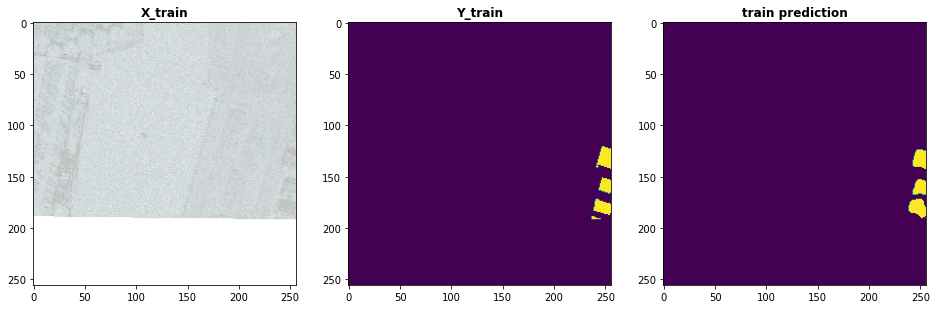

index: 50
val preds  set


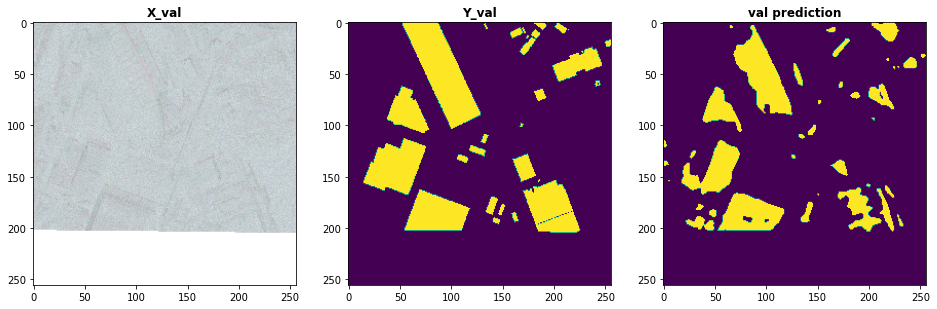

index: 37
test preds  set


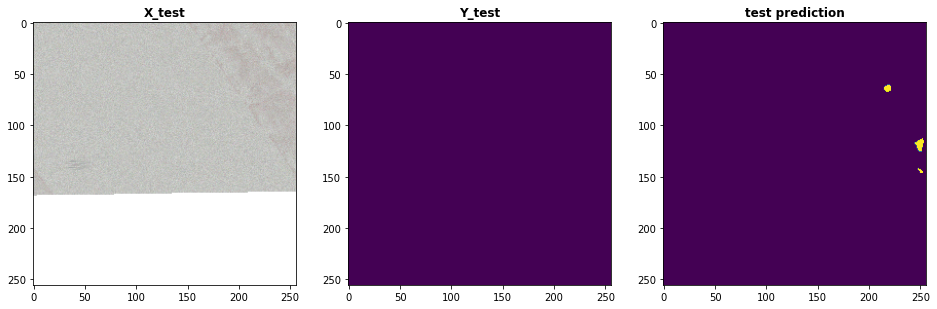

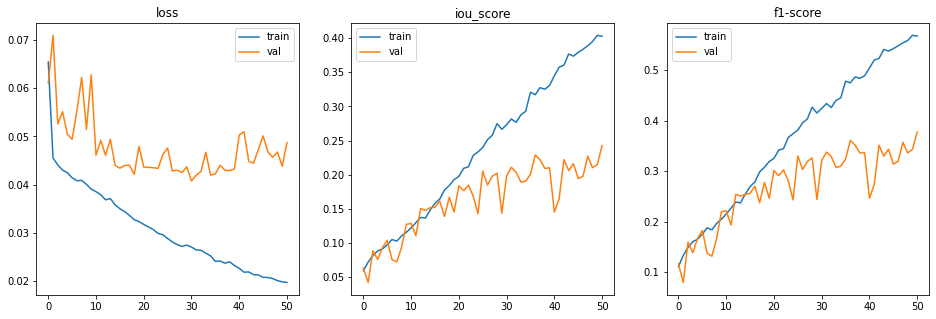

In [ ]:
''' plot predictions to visualize ''' 
plot_XY_preds('train preds', X_train[:MODEL_VAL_OFFSET], Y_train[:MODEL_VAL_OFFSET], preds_train_t, 'X_train', 'Y_train', 'train prediction')
plot_XY_preds('val preds', X_train[MODEL_VAL_OFFSET:], Y_train[MODEL_VAL_OFFSET:], preds_val_t, 'X_val', 'Y_val', 'val prediction')
plot_XY_preds('test preds', X_test, Y_test, preds_test_t, 'X_test', 'Y_test', 'test prediction')
if results != None:
  plot_history(results.history)

### ID 91. BinaryFocalLoss(alpha=0.25, gamma=0.75)

In [ ]:
''' set the train/test ''' 
IMG_TYPE, IMG_WIDTH, IMG_HEIGHT, IMG_ROTATED, IMG_CHANNELS, IMG_DTYPE_SRC, IMG_DTYPE = gen_input_image_details('SAR-Intensity', False)       # CHANGE HERE
PATH_SRC, PATH_SRC_IMAGE, PATH_SRC_MASK, PATH_DATA, PATH_IMAGE, PATH_MASK, PATH_SAMPLE, PATH_SAVED_MODELS = gen_paths(IMG_TYPE, IMG_ROTATED)
if IMG_ROTATED:
  X_train, Y_train, X_test, Y_test = X_train_rotate, Y_train_rotate, X_test_rotate, Y_test_rotate
else:
  X_train, Y_train, X_test, Y_test = X_train_no_rotate, Y_train_no_rotate, X_test_no_rotate, Y_test_no_rotate

gen_input_image_details()
IMG_TYPE: SAR-Intensity, IMG_HEIGHT: 256, IMG_WIDTH: 256, IMG_ROTATED: False, IMG_CHANNELS: 4, IMG_DTYPE_SRC: <class 'numpy.float32'>, IMG_DTYPE: <class 'numpy.uint8'>

gen_paths()
PATH_SRC: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_BACKUP/train_all/AOI_11_Rotterdam, 
PATH_SRC_IMAGE: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_BACKUP/train_all/AOI_11_Rotterdam/SAR-Intensity, 
PATH_SRC_MASK: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_BACKUP/train_all/AOI_11_Rotterdam/_mask, 
PATH_DATA: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data/SAR-Intensity_256x256, 
PATH_IMAGE: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data/SAR-Intensity_256x256/image, 
PATH_MASK: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data/SAR-Intensity_256x256/mask, 
PATH_SAMPLE: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data/SAR-Intensity_256x256/sample, 
P

In [ ]:
''' set the model parameters, train model '''
MODEL_OPTIMIZER, MODEL_LOSS, MODEL_METRICS, MODEL_VAL_SPLIT, MODEL_VAL_OFFSET, MODEL_BATCH_SIZE, MODEL_EPOCHS, MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, MODEL_COMMENTS, MODEL_ID, MODEL_NAME, model = gen_model(
     BinaryFocalLoss(alpha=0.25, gamma=0.75), 4, 100, 'segmentation-models Unet', 'efficientnetb0', ' BinaryFocalLoss(alpha=0.25, gamma=0.75)', IMG_CHANNELS, MODEL_ID=91, MODEL_COMMENTS='loss function test, early stopping patience 20')          # CHANGE HERE

results, model = gen_model_results(PATH_SAVED_MODELS, MODEL_NAME, X_train, Y_train, MODEL_BATCH_SIZE, MODEL_EPOCHS, MODEL_VAL_SPLIT, 
                                   load_weights_filename='', load_weights_epochs=0, save_model=True)                                            # CHANGE HERE

/usr/local/lib/python3.6/dist-packages/keras_applications/imagenet_utils.py:279: UserWarning: This model usually expects 1 or 3 input channels. However, it was passed an input_shape with 4 input channels.
  str(input_shape[-1]) + ' input channels.')


No weights loaded. Training new model
Train on 720 samples, validate on 80 samples
Epoch 1/100
720/720 [==============================] - 51s 71ms/step - loss: 0.0621 - iou_score: 0.0613 - f1-score: 0.1144 - val_loss: 0.0802 - val_iou_score: 0.0392 - val_f1-score: 0.0746
Epoch 2/100
720/720 [==============================] - 26s 37ms/step - loss: 0.0392 - iou_score: 0.0750 - f1-score: 0.1384 - val_loss: 0.0512 - val_iou_score: 0.0986 - val_f1-score: 0.1759
Epoch 3/100
720/720 [==============================] - 27s 37ms/step - loss: 0.0377 - iou_score: 0.0847 - f1-score: 0.1550 - val_loss: 0.0460 - val_iou_score: 0.0935 - val_f1-score: 0.1670
Epoch 4/100
720/720 [==============================] - 27s 37ms/step - loss: 0.0369 - iou_score: 0.0897 - f1-score: 0.1633 - val_loss: 0.0428 - val_iou_score: 0.1045 - val_f1-score: 0.1850
Epoch 5/100
720/720 [==============================] - 27s 37ms/step - loss: 0.0365 - iou_score: 0.0923 - f1-score: 0.1672 - val_loss: 0.0447 - val_iou_score: 0.

In [ ]:
''' predict using model '''
preds_train_t, preds_val_t, preds_test_t = gen_predictions(model, X_train, Y_train, X_test, Y_test, MODEL_VAL_OFFSET, IMG_TYPE, IMG_ROTATED, MODEL_NAME, MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, MODEL_COMMENTS, MODEL_BATCH_SIZE, MODEL_EPOCHS)

80/80 [==============================] - 0s 5ms/step
train set evaluation
720/720 [==============================] - 4s 5ms/step
loss :  0.0154305100440979
iou_score :  0.4290042817592621
f1-score :  0.5992093086242676

validation set evaluation
80/80 [==============================] - 0s 6ms/step
loss :  17.91581611633301
iou_score :  0.11778059601783752
f1-score :  0.20969225466251373

test set evaluation
80/80 [==============================] - 0s 5ms/step
loss :  0.03691841512918472
iou_score :  0.2553320825099945
f1-score :  0.4064130485057831
saved model metrics


index: 139
train preds  set


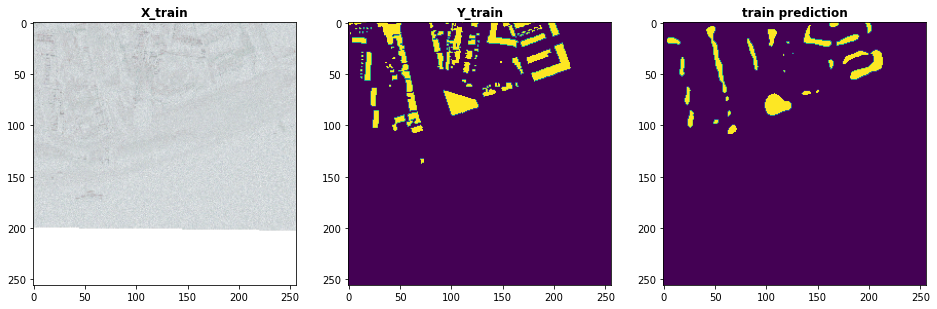

index: 3
val preds  set


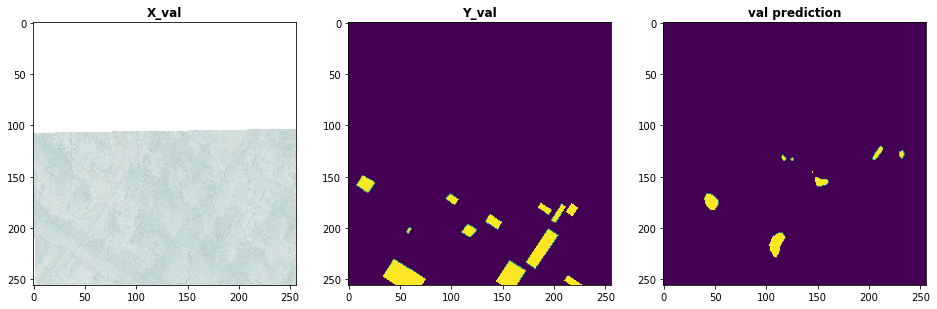

index: 62
test preds  set


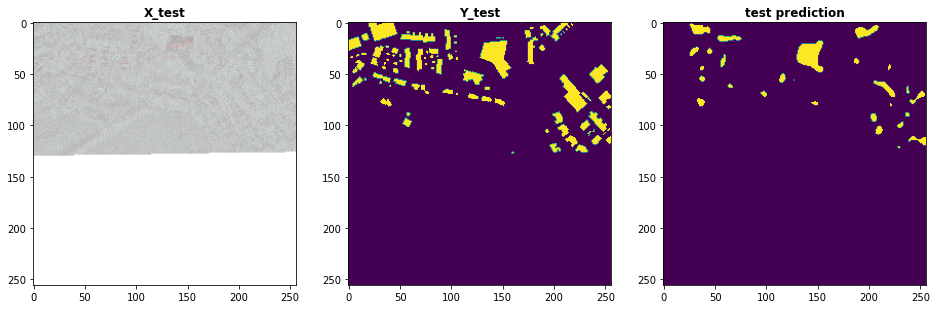

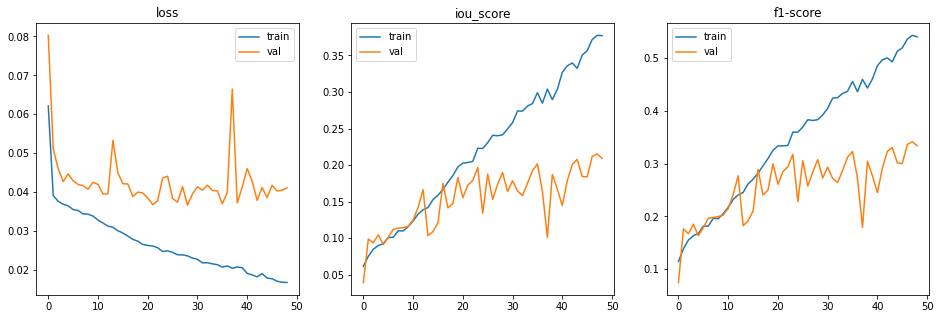

In [ ]:
''' plot predictions to visualize ''' 
plot_XY_preds('train preds', X_train[:MODEL_VAL_OFFSET], Y_train[:MODEL_VAL_OFFSET], preds_train_t, 'X_train', 'Y_train', 'train prediction')
plot_XY_preds('val preds', X_train[MODEL_VAL_OFFSET:], Y_train[MODEL_VAL_OFFSET:], preds_val_t, 'X_val', 'Y_val', 'val prediction')
plot_XY_preds('test preds', X_test, Y_test, preds_test_t, 'X_test', 'Y_test', 'test prediction')
if results != None:
  plot_history(results.history)

### ID 92. BinaryFocalLoss(alpha=0.25, gamma=0.25)

In [ ]:
''' set the train/test ''' 
IMG_TYPE, IMG_WIDTH, IMG_HEIGHT, IMG_ROTATED, IMG_CHANNELS, IMG_DTYPE_SRC, IMG_DTYPE = gen_input_image_details('SAR-Intensity', False)       # CHANGE HERE
PATH_SRC, PATH_SRC_IMAGE, PATH_SRC_MASK, PATH_DATA, PATH_IMAGE, PATH_MASK, PATH_SAMPLE, PATH_SAVED_MODELS = gen_paths(IMG_TYPE, IMG_ROTATED)
if IMG_ROTATED:
  X_train, Y_train, X_test, Y_test = X_train_rotate, Y_train_rotate, X_test_rotate, Y_test_rotate
else:
  X_train, Y_train, X_test, Y_test = X_train_no_rotate, Y_train_no_rotate, X_test_no_rotate, Y_test_no_rotate

gen_input_image_details()
IMG_TYPE: SAR-Intensity, IMG_HEIGHT: 256, IMG_WIDTH: 256, IMG_ROTATED: False, IMG_CHANNELS: 4, IMG_DTYPE_SRC: <class 'numpy.float32'>, IMG_DTYPE: <class 'numpy.uint8'>

gen_paths()
PATH_SRC: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_BACKUP/train_all/AOI_11_Rotterdam, 
PATH_SRC_IMAGE: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_BACKUP/train_all/AOI_11_Rotterdam/SAR-Intensity, 
PATH_SRC_MASK: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_BACKUP/train_all/AOI_11_Rotterdam/_mask, 
PATH_DATA: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data/SAR-Intensity_256x256, 
PATH_IMAGE: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data/SAR-Intensity_256x256/image, 
PATH_MASK: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data/SAR-Intensity_256x256/mask, 
PATH_SAMPLE: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data/SAR-Intensity_256x256/sample, 
P

In [ ]:
''' set the model parameters, train model '''
MODEL_OPTIMIZER, MODEL_LOSS, MODEL_METRICS, MODEL_VAL_SPLIT, MODEL_VAL_OFFSET, MODEL_BATCH_SIZE, MODEL_EPOCHS, MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, MODEL_COMMENTS, MODEL_ID, MODEL_NAME, model = gen_model(
     BinaryFocalLoss(alpha=0.25, gamma=0.25), 4, 100, 'segmentation-models Unet', 'efficientnetb0', ' BinaryFocalLoss(alpha=0.25, gamma=0.25)', IMG_CHANNELS, MODEL_ID=92, MODEL_COMMENTS='loss function test, early stopping patience 20')          # CHANGE HERE

results, model = gen_model_results(PATH_SAVED_MODELS, MODEL_NAME, X_train, Y_train, MODEL_BATCH_SIZE, MODEL_EPOCHS, MODEL_VAL_SPLIT, 
                                   load_weights_filename='', load_weights_epochs=0, save_model=True)                                            # CHANGE HERE

/usr/local/lib/python3.6/dist-packages/keras_applications/imagenet_utils.py:279: UserWarning: This model usually expects 1 or 3 input channels. However, it was passed an input_shape with 4 input channels.
  str(input_shape[-1]) + ' input channels.')


No weights loaded. Training new model
Train on 720 samples, validate on 80 samples
Epoch 1/100
720/720 [==============================] - 44s 61ms/step - loss: 0.0711 - iou_score: 0.0622 - f1-score: 0.1163 - val_loss: 0.0740 - val_iou_score: 0.0366 - val_f1-score: 0.0702
Epoch 2/100
720/720 [==============================] - 26s 36ms/step - loss: 0.0527 - iou_score: 0.0705 - f1-score: 0.1310 - val_loss: 0.0668 - val_iou_score: 0.0573 - val_f1-score: 0.1070
Epoch 3/100
720/720 [==============================] - 26s 37ms/step - loss: 0.0516 - iou_score: 0.0740 - f1-score: 0.1369 - val_loss: 0.0641 - val_iou_score: 0.0851 - val_f1-score: 0.1538
Epoch 4/100
720/720 [==============================] - 27s 37ms/step - loss: 0.0508 - iou_score: 0.0802 - f1-score: 0.1474 - val_loss: 0.0611 - val_iou_score: 0.0884 - val_f1-score: 0.1587
Epoch 5/100
720/720 [==============================] - 26s 37ms/step - loss: 0.0501 - iou_score: 0.0819 - f1-score: 0.1498 - val_loss: 0.0574 - val_iou_score: 0.

In [ ]:
''' predict using model '''
preds_train_t, preds_val_t, preds_test_t = gen_predictions(model, X_train, Y_train, X_test, Y_test, MODEL_VAL_OFFSET, IMG_TYPE, IMG_ROTATED, MODEL_NAME, MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, MODEL_COMMENTS, MODEL_BATCH_SIZE, MODEL_EPOCHS)

80/80 [==============================] - 0s 5ms/step
train set evaluation
720/720 [==============================] - 4s 5ms/step
loss :  0.021587120865782104
iou_score :  0.47526177763938904
f1-score :  0.6431061625480652

validation set evaluation
80/80 [==============================] - 0s 6ms/step
loss :  24.478084564208984
iou_score :  0.0920189693570137
f1-score :  0.1677953004837036

test set evaluation
80/80 [==============================] - 0s 5ms/step
loss :  0.05241065919399261
iou_score :  0.25513672828674316
f1-score :  0.40566352009773254
saved model metrics


index: 693
train preds  set


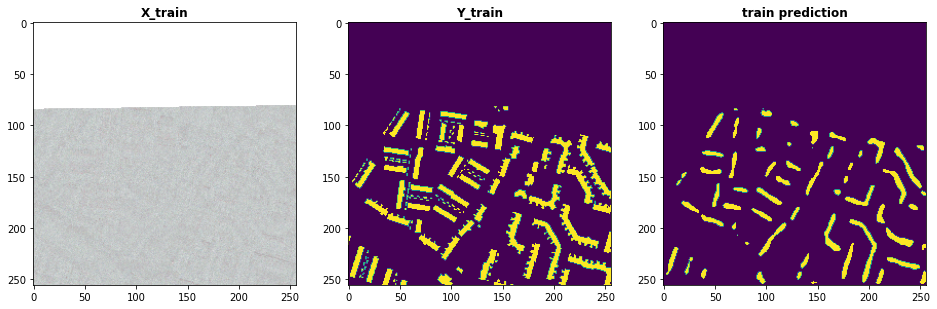

index: 53
val preds  set


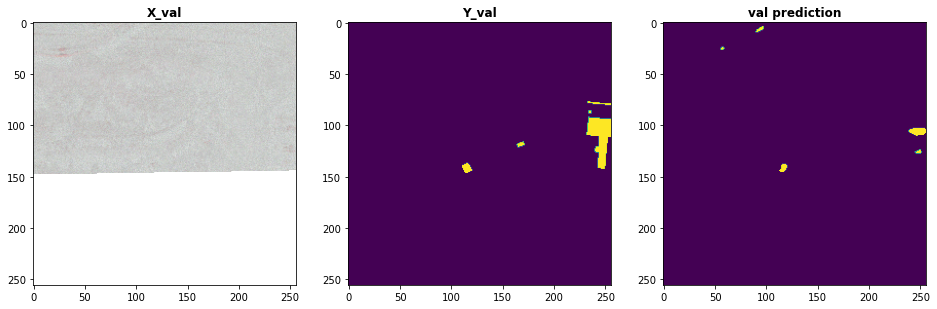

index: 51
test preds  set


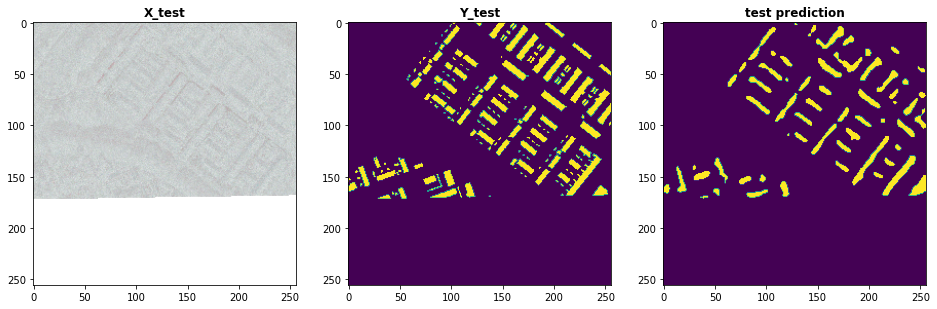

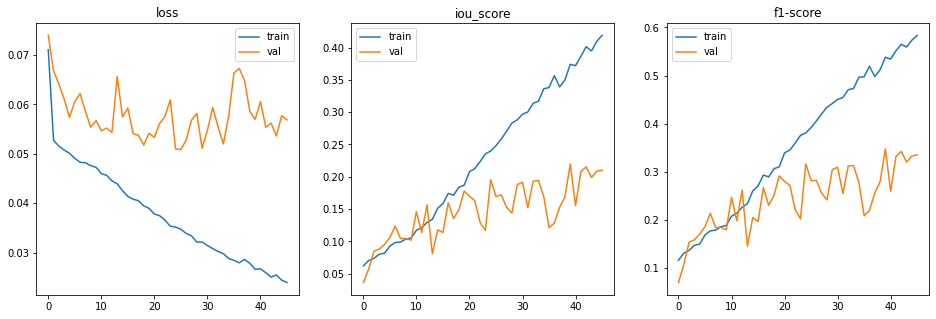

In [ ]:
''' plot predictions to visualize ''' 
plot_XY_preds('train preds', X_train[:MODEL_VAL_OFFSET], Y_train[:MODEL_VAL_OFFSET], preds_train_t, 'X_train', 'Y_train', 'train prediction')
plot_XY_preds('val preds', X_train[MODEL_VAL_OFFSET:], Y_train[MODEL_VAL_OFFSET:], preds_val_t, 'X_val', 'Y_val', 'val prediction')
plot_XY_preds('test preds', X_test, Y_test, preds_test_t, 'X_test', 'Y_test', 'test prediction')
if results != None:
  plot_history(results.history)

### ID 93. BinaryFocalLoss(alpha=0.25, gamma=1.0)

In [ ]:
''' set the train/test ''' 
IMG_TYPE, IMG_WIDTH, IMG_HEIGHT, IMG_ROTATED, IMG_CHANNELS, IMG_DTYPE_SRC, IMG_DTYPE = gen_input_image_details('SAR-Intensity', False)       # CHANGE HERE
PATH_SRC, PATH_SRC_IMAGE, PATH_SRC_MASK, PATH_DATA, PATH_IMAGE, PATH_MASK, PATH_SAMPLE, PATH_SAVED_MODELS = gen_paths(IMG_TYPE, IMG_ROTATED)
if IMG_ROTATED:
  X_train, Y_train, X_test, Y_test = X_train_rotate, Y_train_rotate, X_test_rotate, Y_test_rotate
else:
  X_train, Y_train, X_test, Y_test = X_train_no_rotate, Y_train_no_rotate, X_test_no_rotate, Y_test_no_rotate

gen_input_image_details()
IMG_TYPE: SAR-Intensity, IMG_HEIGHT: 256, IMG_WIDTH: 256, IMG_ROTATED: False, IMG_CHANNELS: 4, IMG_DTYPE_SRC: <class 'numpy.float32'>, IMG_DTYPE: <class 'numpy.uint8'>

gen_paths()
PATH_SRC: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_BACKUP/train_all/AOI_11_Rotterdam, 
PATH_SRC_IMAGE: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_BACKUP/train_all/AOI_11_Rotterdam/SAR-Intensity, 
PATH_SRC_MASK: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_BACKUP/train_all/AOI_11_Rotterdam/_mask, 
PATH_DATA: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data/SAR-Intensity_256x256, 
PATH_IMAGE: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data/SAR-Intensity_256x256/image, 
PATH_MASK: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data/SAR-Intensity_256x256/mask, 
PATH_SAMPLE: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data/SAR-Intensity_256x256/sample, 
P

In [ ]:
''' set the model parameters, train model '''
MODEL_OPTIMIZER, MODEL_LOSS, MODEL_METRICS, MODEL_VAL_SPLIT, MODEL_VAL_OFFSET, MODEL_BATCH_SIZE, MODEL_EPOCHS, MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, MODEL_COMMENTS, MODEL_ID, MODEL_NAME, model = gen_model(
     BinaryFocalLoss(alpha=0.25, gamma=1.0), 4, 100, 'segmentation-models Unet', 'efficientnetb0', ' BinaryFocalLoss(alpha=0.25, gamma=1.0)', IMG_CHANNELS, MODEL_ID=93, MODEL_COMMENTS='loss function test, early stopping patience 20')          # CHANGE HERE

results, model = gen_model_results(PATH_SAVED_MODELS, MODEL_NAME, X_train, Y_train, MODEL_BATCH_SIZE, MODEL_EPOCHS, MODEL_VAL_SPLIT, 
                                   load_weights_filename='', load_weights_epochs=0, save_model=True)                                            # CHANGE HERE

/usr/local/lib/python3.6/dist-packages/keras_applications/imagenet_utils.py:279: UserWarning: This model usually expects 1 or 3 input channels. However, it was passed an input_shape with 4 input channels.
  str(input_shape[-1]) + ' input channels.')


No weights loaded. Training new model
Train on 720 samples, validate on 80 samples
Epoch 1/100
720/720 [==============================] - 45s 62ms/step - loss: 0.0465 - iou_score: 0.0673 - f1-score: 0.1249 - val_loss: 0.0658 - val_iou_score: 0.0327 - val_f1-score: 0.0629
Epoch 2/100
720/720 [==============================] - 27s 38ms/step - loss: 0.0327 - iou_score: 0.0826 - f1-score: 0.1510 - val_loss: 0.0516 - val_iou_score: 0.0529 - val_f1-score: 0.0993
Epoch 3/100
720/720 [==============================] - 27s 38ms/step - loss: 0.0324 - iou_score: 0.0874 - f1-score: 0.1591 - val_loss: 0.0410 - val_iou_score: 0.0789 - val_f1-score: 0.1438
Epoch 4/100
720/720 [==============================] - 27s 38ms/step - loss: 0.0315 - iou_score: 0.0918 - f1-score: 0.1664 - val_loss: 0.0375 - val_iou_score: 0.1091 - val_f1-score: 0.1927
Epoch 5/100
720/720 [==============================] - 27s 38ms/step - loss: 0.0311 - iou_score: 0.0954 - f1-score: 0.1723 - val_loss: 0.0375 - val_iou_score: 0.

In [ ]:
''' predict using model '''
preds_train_t, preds_val_t, preds_test_t = gen_predictions(model, X_train, Y_train, X_test, Y_test, MODEL_VAL_OFFSET, IMG_TYPE, IMG_ROTATED, MODEL_NAME, MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, MODEL_COMMENTS, MODEL_BATCH_SIZE, MODEL_EPOCHS)

80/80 [==============================] - 0s 5ms/step
train set evaluation
720/720 [==============================] - 4s 5ms/step
loss :  0.012440932707654105
iou_score :  0.424425333738327
f1-score :  0.594948947429657

validation set evaluation
80/80 [==============================] - 0s 6ms/step
loss :  15.278452491760254
iou_score :  0.13836504518985748
f1-score :  0.24146389961242676

test set evaluation
80/80 [==============================] - 0s 5ms/step
loss :  0.03332695066928863
iou_score :  0.24160706996917725
f1-score :  0.38826408982276917
saved model metrics


index: 326
train preds  set


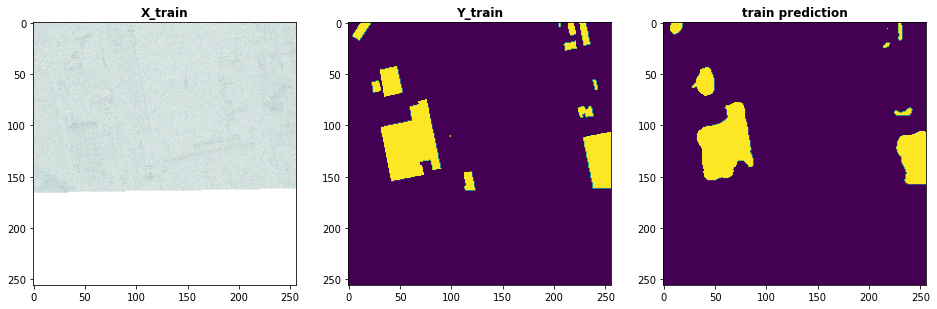

index: 0
val preds  set


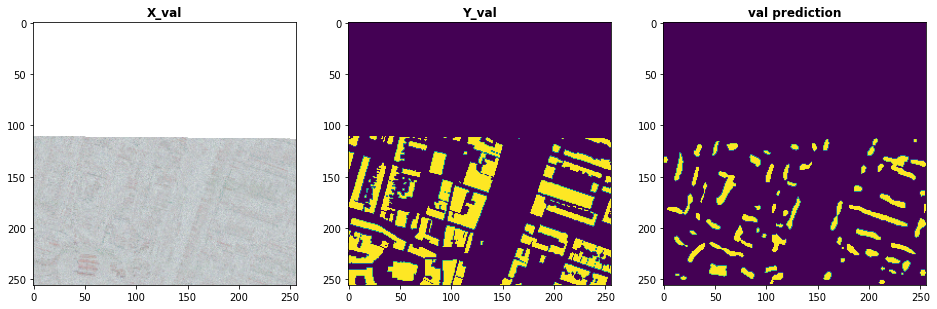

index: 35
test preds  set


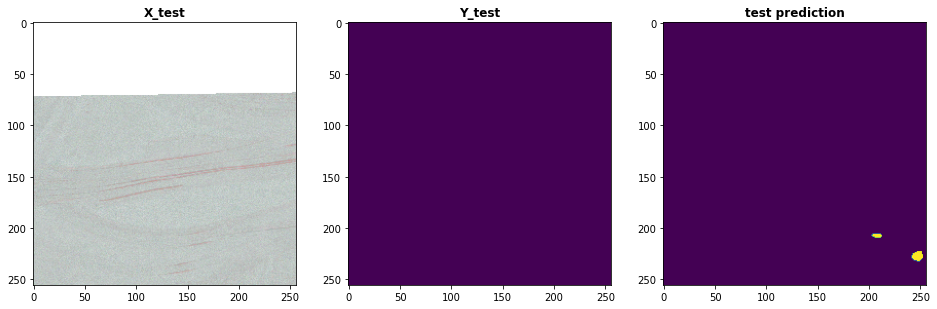

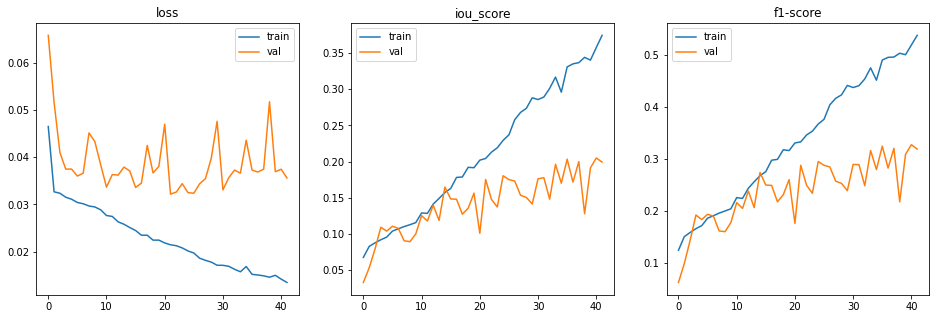

In [ ]:
''' plot predictions to visualize ''' 
plot_XY_preds('train preds', X_train[:MODEL_VAL_OFFSET], Y_train[:MODEL_VAL_OFFSET], preds_train_t, 'X_train', 'Y_train', 'train prediction')
plot_XY_preds('val preds', X_train[MODEL_VAL_OFFSET:], Y_train[MODEL_VAL_OFFSET:], preds_val_t, 'X_val', 'Y_val', 'val prediction')
plot_XY_preds('test preds', X_test, Y_test, preds_test_t, 'X_test', 'Y_test', 'test prediction')
if results != None:
  plot_history(results.history)

### ID 94. BinaryFocalLoss(alpha=0.25, gamma=1.5)

In [ ]:
''' set the train/test ''' 
IMG_TYPE, IMG_WIDTH, IMG_HEIGHT, IMG_ROTATED, IMG_CHANNELS, IMG_DTYPE_SRC, IMG_DTYPE = gen_input_image_details('SAR-Intensity', False)       # CHANGE HERE
PATH_SRC, PATH_SRC_IMAGE, PATH_SRC_MASK, PATH_DATA, PATH_IMAGE, PATH_MASK, PATH_SAMPLE, PATH_SAVED_MODELS = gen_paths(IMG_TYPE, IMG_ROTATED)
if IMG_ROTATED:
  X_train, Y_train, X_test, Y_test = X_train_rotate, Y_train_rotate, X_test_rotate, Y_test_rotate
else:
  X_train, Y_train, X_test, Y_test = X_train_no_rotate, Y_train_no_rotate, X_test_no_rotate, Y_test_no_rotate

gen_input_image_details()
IMG_TYPE: SAR-Intensity, IMG_HEIGHT: 256, IMG_WIDTH: 256, IMG_ROTATED: False, IMG_CHANNELS: 4, IMG_DTYPE_SRC: <class 'numpy.float32'>, IMG_DTYPE: <class 'numpy.uint8'>

gen_paths()
PATH_SRC: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_BACKUP/train_all/AOI_11_Rotterdam, 
PATH_SRC_IMAGE: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_BACKUP/train_all/AOI_11_Rotterdam/SAR-Intensity, 
PATH_SRC_MASK: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_BACKUP/train_all/AOI_11_Rotterdam/_mask, 
PATH_DATA: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data/SAR-Intensity_256x256, 
PATH_IMAGE: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data/SAR-Intensity_256x256/image, 
PATH_MASK: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data/SAR-Intensity_256x256/mask, 
PATH_SAMPLE: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data/SAR-Intensity_256x256/sample, 
P

In [ ]:
''' set the model parameters, train model '''
MODEL_OPTIMIZER, MODEL_LOSS, MODEL_METRICS, MODEL_VAL_SPLIT, MODEL_VAL_OFFSET, MODEL_BATCH_SIZE, MODEL_EPOCHS, MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, MODEL_COMMENTS, MODEL_ID, MODEL_NAME, model = gen_model(
     BinaryFocalLoss(alpha=0.25, gamma=1.5), 4, 100, 'segmentation-models Unet', 'efficientnetb0', ' BinaryFocalLoss(alpha=0.25, gamma=1.5)', IMG_CHANNELS, MODEL_ID=94, MODEL_COMMENTS='loss function test, early stopping patience 20')          # CHANGE HERE

results, model = gen_model_results(PATH_SAVED_MODELS, MODEL_NAME, X_train, Y_train, MODEL_BATCH_SIZE, MODEL_EPOCHS, MODEL_VAL_SPLIT, 
                                   load_weights_filename='', load_weights_epochs=0, save_model=True)                                            # CHANGE HERE

/usr/local/lib/python3.6/dist-packages/keras_applications/imagenet_utils.py:279: UserWarning: This model usually expects 1 or 3 input channels. However, it was passed an input_shape with 4 input channels.
  str(input_shape[-1]) + ' input channels.')


No weights loaded. Training new model
Train on 720 samples, validate on 80 samples
Epoch 1/100
720/720 [==============================] - 46s 64ms/step - loss: 0.0310 - iou_score: 0.0722 - f1-score: 0.1332 - val_loss: 0.0424 - val_iou_score: 0.0509 - val_f1-score: 0.0960
Epoch 2/100
720/720 [==============================] - 27s 37ms/step - loss: 0.0244 - iou_score: 0.0854 - f1-score: 0.1555 - val_loss: 0.0302 - val_iou_score: 0.0979 - val_f1-score: 0.1745
Epoch 3/100
720/720 [==============================] - 27s 37ms/step - loss: 0.0240 - iou_score: 0.0898 - f1-score: 0.1627 - val_loss: 0.0298 - val_iou_score: 0.1068 - val_f1-score: 0.1890
Epoch 4/100
720/720 [==============================] - 27s 37ms/step - loss: 0.0232 - iou_score: 0.0956 - f1-score: 0.1725 - val_loss: 0.0278 - val_iou_score: 0.1075 - val_f1-score: 0.1896
Epoch 5/100
720/720 [==============================] - 27s 37ms/step - loss: 0.0227 - iou_score: 0.1003 - f1-score: 0.1805 - val_loss: 0.0287 - val_iou_score: 0.

In [ ]:
''' predict using model '''
preds_train_t, preds_val_t, preds_test_t = gen_predictions(model, X_train, Y_train, X_test, Y_test, MODEL_VAL_OFFSET, IMG_TYPE, IMG_ROTATED, MODEL_NAME, MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, MODEL_COMMENTS, MODEL_BATCH_SIZE, MODEL_EPOCHS)

80/80 [==============================] - 0s 5ms/step
train set evaluation
720/720 [==============================] - 4s 5ms/step
loss :  0.011773153642813365
iou_score :  0.28772610425949097
f1-score :  0.44644632935523987

validation set evaluation
80/80 [==============================] - 0s 6ms/step
loss :  12.85111598968506
iou_score :  0.16421550512313843
f1-score :  0.28038468956947327

test set evaluation
80/80 [==============================] - 0s 5ms/step
loss :  0.023292335122823714
iou_score :  0.20382173359394073
f1-score :  0.3384219706058502
saved model metrics


index: 674
train preds  set


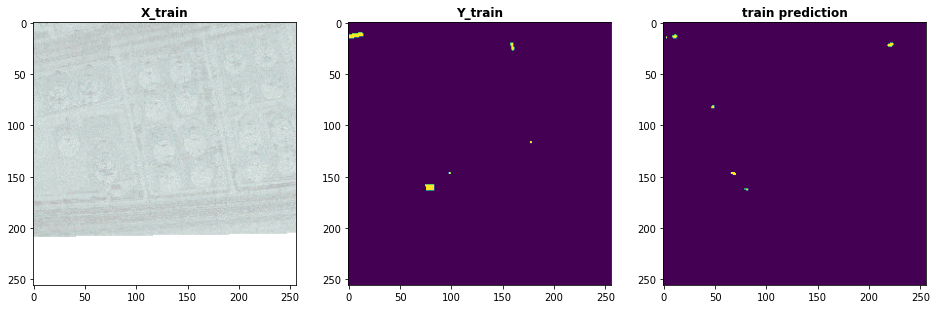

index: 25
val preds  set


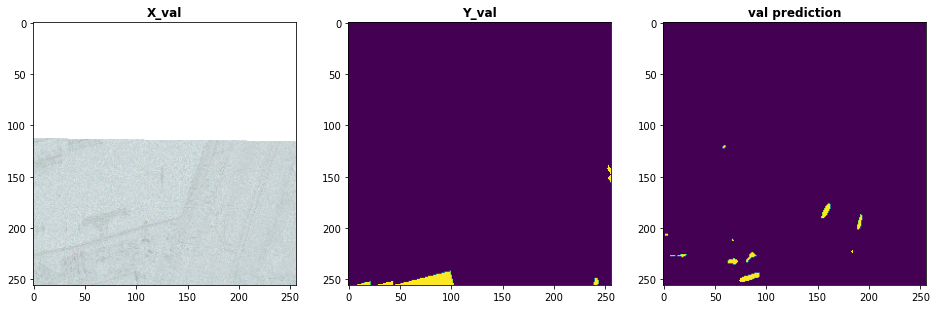

index: 20
test preds  set


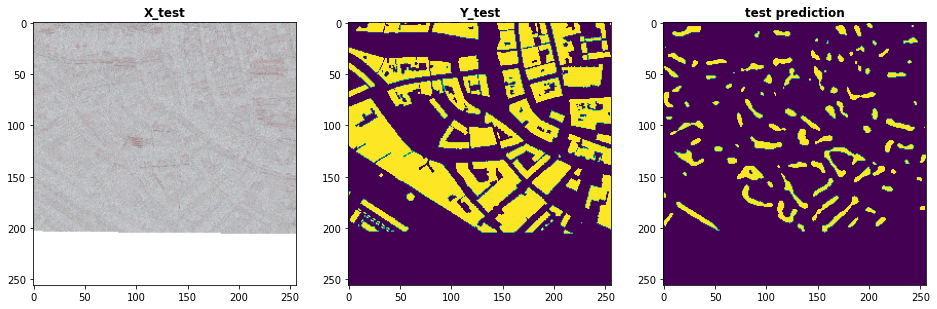

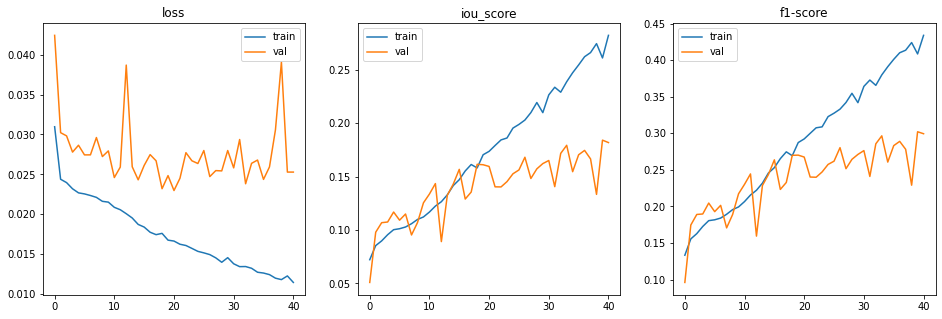

In [ ]:
''' plot predictions to visualize ''' 
plot_XY_preds('train preds', X_train[:MODEL_VAL_OFFSET], Y_train[:MODEL_VAL_OFFSET], preds_train_t, 'X_train', 'Y_train', 'train prediction')
plot_XY_preds('val preds', X_train[MODEL_VAL_OFFSET:], Y_train[MODEL_VAL_OFFSET:], preds_val_t, 'X_val', 'Y_val', 'val prediction')
plot_XY_preds('test preds', X_test, Y_test, preds_test_t, 'X_test', 'Y_test', 'test prediction')
if results != None:
  plot_history(results.history)

### ID 95. BinaryFocalLoss(alpha=0.5, gamma=0.25)

In [ ]:
''' set the train/test ''' 
IMG_TYPE, IMG_WIDTH, IMG_HEIGHT, IMG_ROTATED, IMG_CHANNELS, IMG_DTYPE_SRC, IMG_DTYPE = gen_input_image_details('SAR-Intensity', False)       # CHANGE HERE
PATH_SRC, PATH_SRC_IMAGE, PATH_SRC_MASK, PATH_DATA, PATH_IMAGE, PATH_MASK, PATH_SAMPLE, PATH_SAVED_MODELS = gen_paths(IMG_TYPE, IMG_ROTATED)
if IMG_ROTATED:
  X_train, Y_train, X_test, Y_test = X_train_rotate, Y_train_rotate, X_test_rotate, Y_test_rotate
else:
  X_train, Y_train, X_test, Y_test = X_train_no_rotate, Y_train_no_rotate, X_test_no_rotate, Y_test_no_rotate

gen_input_image_details()
IMG_TYPE: SAR-Intensity, IMG_HEIGHT: 256, IMG_WIDTH: 256, IMG_ROTATED: False, IMG_CHANNELS: 4, IMG_DTYPE_SRC: <class 'numpy.float32'>, IMG_DTYPE: <class 'numpy.uint8'>

gen_paths()
PATH_SRC: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_BACKUP/train_all/AOI_11_Rotterdam, 
PATH_SRC_IMAGE: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_BACKUP/train_all/AOI_11_Rotterdam/SAR-Intensity, 
PATH_SRC_MASK: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_BACKUP/train_all/AOI_11_Rotterdam/_mask, 
PATH_DATA: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data/SAR-Intensity_256x256, 
PATH_IMAGE: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data/SAR-Intensity_256x256/image, 
PATH_MASK: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data/SAR-Intensity_256x256/mask, 
PATH_SAMPLE: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data/SAR-Intensity_256x256/sample, 
P

In [ ]:
''' set the model parameters, train model '''
MODEL_OPTIMIZER, MODEL_LOSS, MODEL_METRICS, MODEL_VAL_SPLIT, MODEL_VAL_OFFSET, MODEL_BATCH_SIZE, MODEL_EPOCHS, MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, MODEL_COMMENTS, MODEL_ID, MODEL_NAME, model = gen_model(
     BinaryFocalLoss(alpha=0.5, gamma=0.25), 4, 100, 'segmentation-models Unet', 'efficientnetb0', ' BinaryFocalLoss(alpha=0.5, gamma=0.25)', IMG_CHANNELS, MODEL_ID=95, MODEL_COMMENTS='loss function test, early stopping patience 20')          # CHANGE HERE

results, model = gen_model_results(PATH_SAVED_MODELS, MODEL_NAME, X_train, Y_train, MODEL_BATCH_SIZE, MODEL_EPOCHS, MODEL_VAL_SPLIT, 
                                   load_weights_filename='', load_weights_epochs=0, save_model=True)                                            # CHANGE HERE

/usr/local/lib/python3.6/dist-packages/keras_applications/imagenet_utils.py:279: UserWarning: This model usually expects 1 or 3 input channels. However, it was passed an input_shape with 4 input channels.
  str(input_shape[-1]) + ' input channels.')


No weights loaded. Training new model
Train on 720 samples, validate on 80 samples
Epoch 1/100
720/720 [==============================] - 47s 65ms/step - loss: 0.0851 - iou_score: 0.0907 - f1-score: 0.1641 - val_loss: 0.1041 - val_iou_score: 0.0832 - val_f1-score: 0.1511
Epoch 2/100
720/720 [==============================] - 28s 38ms/step - loss: 0.0755 - iou_score: 0.1120 - f1-score: 0.1989 - val_loss: 0.1211 - val_iou_score: 0.0813 - val_f1-score: 0.1470
Epoch 3/100
720/720 [==============================] - 27s 38ms/step - loss: 0.0738 - iou_score: 0.1176 - f1-score: 0.2079 - val_loss: 0.0946 - val_iou_score: 0.1552 - val_f1-score: 0.2603
Epoch 4/100
720/720 [==============================] - 27s 38ms/step - loss: 0.0713 - iou_score: 0.1311 - f1-score: 0.2293 - val_loss: 0.0899 - val_iou_score: 0.1106 - val_f1-score: 0.1939
Epoch 5/100
720/720 [==============================] - 27s 38ms/step - loss: 0.0709 - iou_score: 0.1316 - f1-score: 0.2291 - val_loss: 0.0831 - val_iou_score: 0.

In [ ]:
''' predict using model '''
preds_train_t, preds_val_t, preds_test_t = gen_predictions(model, X_train, Y_train, X_test, Y_test, MODEL_VAL_OFFSET, IMG_TYPE, IMG_ROTATED, MODEL_NAME, MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, MODEL_COMMENTS, MODEL_BATCH_SIZE, MODEL_EPOCHS)

80/80 [==============================] - 0s 5ms/step
train set evaluation
720/720 [==============================] - 4s 5ms/step
loss :  0.026438538688752386
iou_score :  0.5065897107124329
f1-score :  0.6714800000190735

validation set evaluation
80/80 [==============================] - 0s 6ms/step
loss :  57.61890487670898
iou_score :  0.12749134004116058
f1-score :  0.2241620570421219

test set evaluation
80/80 [==============================] - 0s 5ms/step
loss :  0.08014206513762474
iou_score :  0.2897162437438965
f1-score :  0.44888076186180115
saved model metrics


index: 173
train preds  set


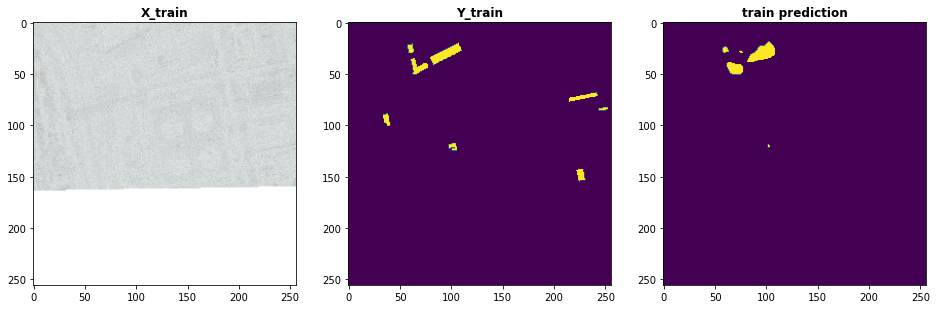

index: 78
val preds  set


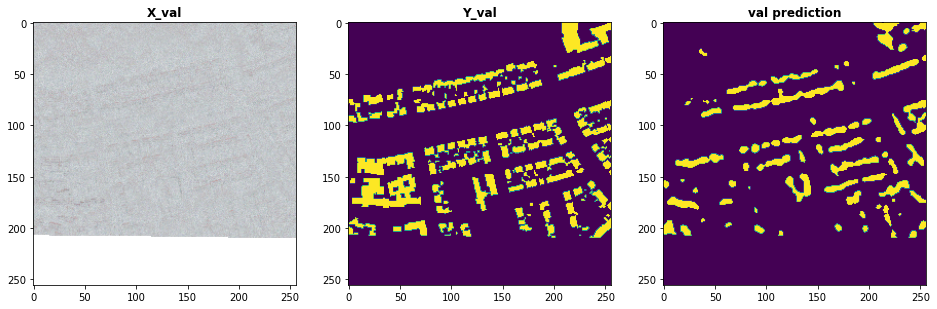

index: 19
test preds  set


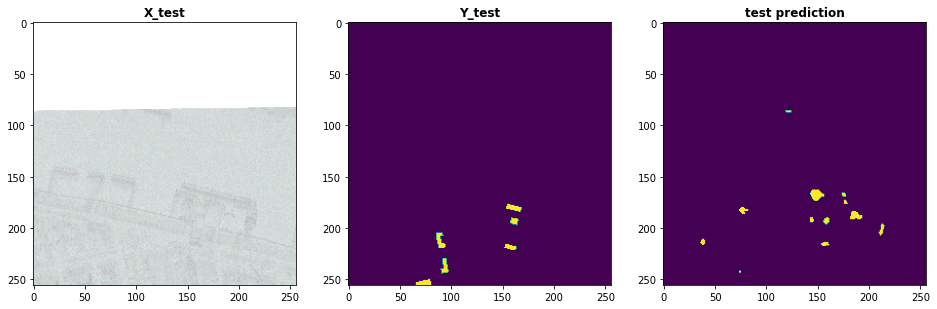

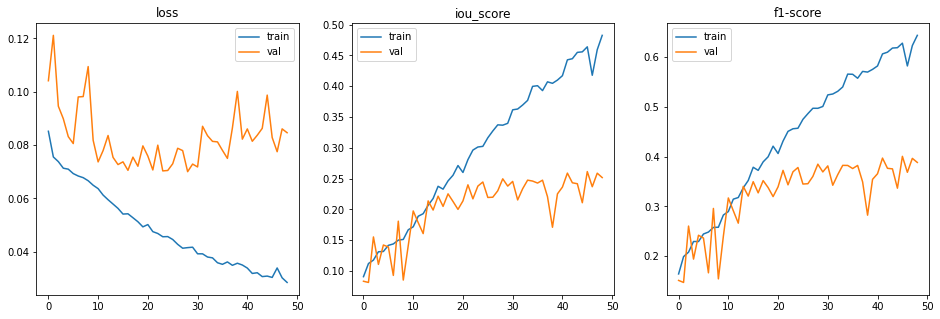

In [ ]:
''' plot predictions to visualize ''' 
plot_XY_preds('train preds', X_train[:MODEL_VAL_OFFSET], Y_train[:MODEL_VAL_OFFSET], preds_train_t, 'X_train', 'Y_train', 'train prediction')
plot_XY_preds('val preds', X_train[MODEL_VAL_OFFSET:], Y_train[MODEL_VAL_OFFSET:], preds_val_t, 'X_val', 'Y_val', 'val prediction')
plot_XY_preds('test preds', X_test, Y_test, preds_test_t, 'X_test', 'Y_test', 'test prediction')
if results != None:
  plot_history(results.history)

### ID 96. BinaryFocalLoss(alpha=0.75, gamma=0.25)

In [ ]:
''' set the train/test ''' 
IMG_TYPE, IMG_WIDTH, IMG_HEIGHT, IMG_ROTATED, IMG_CHANNELS, IMG_DTYPE_SRC, IMG_DTYPE = gen_input_image_details('SAR-Intensity', False)       # CHANGE HERE
PATH_SRC, PATH_SRC_IMAGE, PATH_SRC_MASK, PATH_DATA, PATH_IMAGE, PATH_MASK, PATH_SAMPLE, PATH_SAVED_MODELS = gen_paths(IMG_TYPE, IMG_ROTATED)
if IMG_ROTATED:
  X_train, Y_train, X_test, Y_test = X_train_rotate, Y_train_rotate, X_test_rotate, Y_test_rotate
else:
  X_train, Y_train, X_test, Y_test = X_train_no_rotate, Y_train_no_rotate, X_test_no_rotate, Y_test_no_rotate

gen_input_image_details()
IMG_TYPE: SAR-Intensity, IMG_HEIGHT: 256, IMG_WIDTH: 256, IMG_ROTATED: False, IMG_CHANNELS: 4, IMG_DTYPE_SRC: <class 'numpy.float32'>, IMG_DTYPE: <class 'numpy.uint8'>

gen_paths()
PATH_SRC: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_BACKUP/train_all/AOI_11_Rotterdam, 
PATH_SRC_IMAGE: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_BACKUP/train_all/AOI_11_Rotterdam/SAR-Intensity, 
PATH_SRC_MASK: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_BACKUP/train_all/AOI_11_Rotterdam/_mask, 
PATH_DATA: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data/SAR-Intensity_256x256, 
PATH_IMAGE: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data/SAR-Intensity_256x256/image, 
PATH_MASK: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data/SAR-Intensity_256x256/mask, 
PATH_SAMPLE: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data/SAR-Intensity_256x256/sample, 
P

In [ ]:
''' set the model parameters, train model '''
MODEL_OPTIMIZER, MODEL_LOSS, MODEL_METRICS, MODEL_VAL_SPLIT, MODEL_VAL_OFFSET, MODEL_BATCH_SIZE, MODEL_EPOCHS, MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, MODEL_COMMENTS, MODEL_ID, MODEL_NAME, model = gen_model(
     BinaryFocalLoss(alpha=0.75, gamma=0.25), 4, 100, 'segmentation-models Unet', 'efficientnetb0', ' BinaryFocalLoss(alpha=0.75, gamma=0.25)', IMG_CHANNELS, MODEL_ID=96, MODEL_COMMENTS='loss function test, early stopping patience 20')          # CHANGE HERE

results, model = gen_model_results(PATH_SAVED_MODELS, MODEL_NAME, X_train, Y_train, MODEL_BATCH_SIZE, MODEL_EPOCHS, MODEL_VAL_SPLIT, 
                                   load_weights_filename='', load_weights_epochs=0, save_model=True)                                            # CHANGE HERE

/usr/local/lib/python3.6/dist-packages/keras_applications/imagenet_utils.py:279: UserWarning: This model usually expects 1 or 3 input channels. However, it was passed an input_shape with 4 input channels.
  str(input_shape[-1]) + ' input channels.')


No weights loaded. Training new model
Train on 720 samples, validate on 80 samples
Epoch 1/100
720/720 [==============================] - 46s 64ms/step - loss: 0.0850 - iou_score: 0.1111 - f1-score: 0.1964 - val_loss: 0.1492 - val_iou_score: 0.0760 - val_f1-score: 0.1386
Epoch 2/100
720/720 [==============================] - 27s 37ms/step - loss: 0.0737 - iou_score: 0.1387 - f1-score: 0.2396 - val_loss: 0.0878 - val_iou_score: 0.1633 - val_f1-score: 0.2711
Epoch 3/100
720/720 [==============================] - 26s 37ms/step - loss: 0.0735 - iou_score: 0.1407 - f1-score: 0.2424 - val_loss: 0.1130 - val_iou_score: 0.1321 - val_f1-score: 0.2260
Epoch 4/100
720/720 [==============================] - 26s 37ms/step - loss: 0.0713 - iou_score: 0.1465 - f1-score: 0.2506 - val_loss: 0.0785 - val_iou_score: 0.1913 - val_f1-score: 0.3091
Epoch 5/100
720/720 [==============================] - 27s 37ms/step - loss: 0.0703 - iou_score: 0.1527 - f1-score: 0.2595 - val_loss: 0.1142 - val_iou_score: 0.

In [ ]:
''' predict using model '''
preds_train_t, preds_val_t, preds_test_t = gen_predictions(model, X_train, Y_train, X_test, Y_test, MODEL_VAL_OFFSET, IMG_TYPE, IMG_ROTATED, MODEL_NAME, MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, MODEL_COMMENTS, MODEL_BATCH_SIZE, MODEL_EPOCHS)

80/80 [==============================] - 0s 5ms/step
train set evaluation
720/720 [==============================] - 4s 5ms/step
loss :  0.025742903641528554
iou_score :  0.4630892872810364
f1-score :  0.6323549747467041

validation set evaluation
80/80 [==============================] - 0s 6ms/step
loss :  59.045796966552736
iou_score :  0.2152564525604248
f1-score :  0.35144153237342834

test set evaluation
80/80 [==============================] - 0s 5ms/step
loss :  0.07779683917760849
iou_score :  0.303775817155838
f1-score :  0.4656418561935425
saved model metrics


index: 284
train preds  set


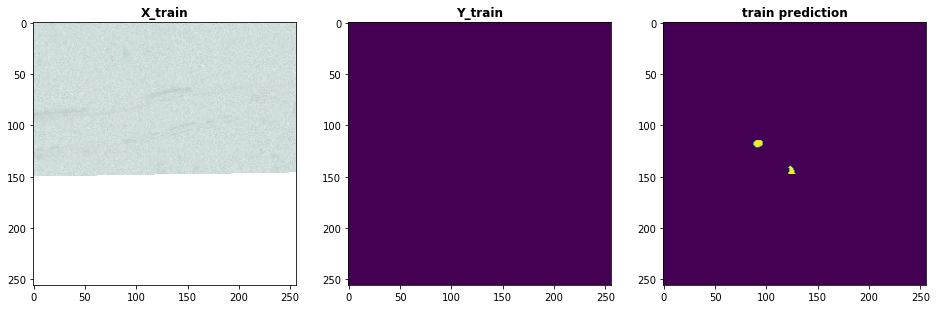

index: 29
val preds  set


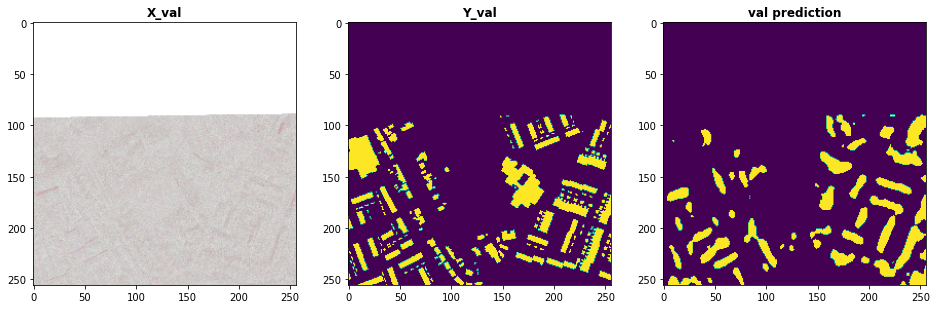

index: 28
test preds  set


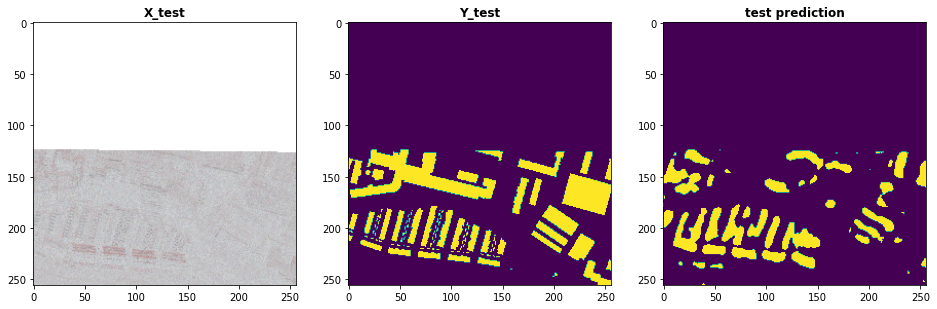

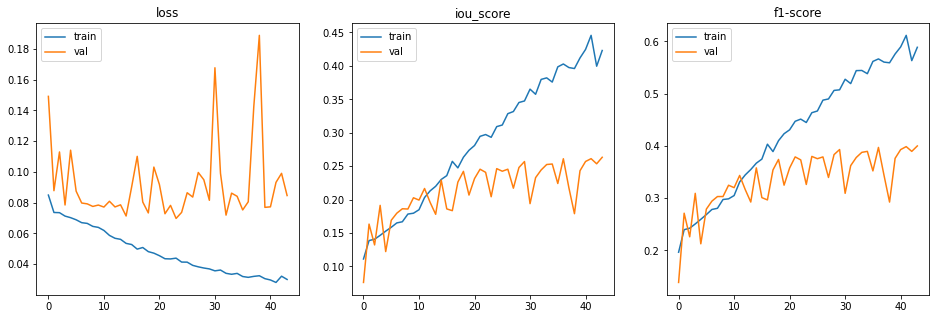

In [ ]:
''' plot predictions to visualize ''' 
plot_XY_preds('train preds', X_train[:MODEL_VAL_OFFSET], Y_train[:MODEL_VAL_OFFSET], preds_train_t, 'X_train', 'Y_train', 'train prediction')
plot_XY_preds('val preds', X_train[MODEL_VAL_OFFSET:], Y_train[MODEL_VAL_OFFSET:], preds_val_t, 'X_val', 'Y_val', 'val prediction')
plot_XY_preds('test preds', X_test, Y_test, preds_test_t, 'X_test', 'Y_test', 'test prediction')
if results != None:
  plot_history(results.history)

### ID 97. BinaryFocalLoss(alpha=0.75, gamma=0.5)

In [ ]:
''' set the train/test ''' 
IMG_TYPE, IMG_WIDTH, IMG_HEIGHT, IMG_ROTATED, IMG_CHANNELS, IMG_DTYPE_SRC, IMG_DTYPE = gen_input_image_details('SAR-Intensity', False)       # CHANGE HERE
PATH_SRC, PATH_SRC_IMAGE, PATH_SRC_MASK, PATH_DATA, PATH_IMAGE, PATH_MASK, PATH_SAMPLE, PATH_SAVED_MODELS = gen_paths(IMG_TYPE, IMG_ROTATED)
if IMG_ROTATED:
  X_train, Y_train, X_test, Y_test = X_train_rotate, Y_train_rotate, X_test_rotate, Y_test_rotate
else:
  X_train, Y_train, X_test, Y_test = X_train_no_rotate, Y_train_no_rotate, X_test_no_rotate, Y_test_no_rotate

gen_input_image_details()
IMG_TYPE: SAR-Intensity, IMG_HEIGHT: 256, IMG_WIDTH: 256, IMG_ROTATED: False, IMG_CHANNELS: 4, IMG_DTYPE_SRC: <class 'numpy.float32'>, IMG_DTYPE: <class 'numpy.uint8'>

gen_paths()
PATH_SRC: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_BACKUP/train_all/AOI_11_Rotterdam, 
PATH_SRC_IMAGE: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_BACKUP/train_all/AOI_11_Rotterdam/SAR-Intensity, 
PATH_SRC_MASK: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_BACKUP/train_all/AOI_11_Rotterdam/_mask, 
PATH_DATA: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data/SAR-Intensity_256x256, 
PATH_IMAGE: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data/SAR-Intensity_256x256/image, 
PATH_MASK: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data/SAR-Intensity_256x256/mask, 
PATH_SAMPLE: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data/SAR-Intensity_256x256/sample, 
P

In [ ]:
''' set the model parameters, train model '''
MODEL_OPTIMIZER, MODEL_LOSS, MODEL_METRICS, MODEL_VAL_SPLIT, MODEL_VAL_OFFSET, MODEL_BATCH_SIZE, MODEL_EPOCHS, MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, MODEL_COMMENTS, MODEL_ID, MODEL_NAME, model = gen_model(
     BinaryFocalLoss(alpha=0.75, gamma=0.5), 4, 100, 'segmentation-models Unet', 'efficientnetb0', ' BinaryFocalLoss(alpha=0.75, gamma=0.5)', IMG_CHANNELS, MODEL_ID=97, MODEL_COMMENTS='loss function test, early stopping patience 20')          # CHANGE HERE

results, model = gen_model_results(PATH_SAVED_MODELS, MODEL_NAME, X_train, Y_train, MODEL_BATCH_SIZE, MODEL_EPOCHS, MODEL_VAL_SPLIT, 
                                   load_weights_filename='', load_weights_epochs=0, save_model=True)                                            # CHANGE HERE

/usr/local/lib/python3.6/dist-packages/keras_applications/imagenet_utils.py:279: UserWarning: This model usually expects 1 or 3 input channels. However, it was passed an input_shape with 4 input channels.
  str(input_shape[-1]) + ' input channels.')


No weights loaded. Training new model
Train on 720 samples, validate on 80 samples
Epoch 1/100
720/720 [==============================] - 45s 63ms/step - loss: 0.0727 - iou_score: 0.1044 - f1-score: 0.1860 - val_loss: 0.1448 - val_iou_score: 0.0944 - val_f1-score: 0.1685
Epoch 2/100
720/720 [==============================] - 26s 37ms/step - loss: 0.0638 - iou_score: 0.1247 - f1-score: 0.2172 - val_loss: 0.0805 - val_iou_score: 0.1489 - val_f1-score: 0.2510
Epoch 3/100
720/720 [==============================] - 26s 37ms/step - loss: 0.0609 - iou_score: 0.1354 - f1-score: 0.2343 - val_loss: 0.0683 - val_iou_score: 0.1502 - val_f1-score: 0.2535
Epoch 4/100
720/720 [==============================] - 26s 36ms/step - loss: 0.0594 - iou_score: 0.1438 - f1-score: 0.2474 - val_loss: 0.0758 - val_iou_score: 0.1686 - val_f1-score: 0.2780
Epoch 5/100
720/720 [==============================] - 26s 37ms/step - loss: 0.0592 - iou_score: 0.1435 - f1-score: 0.2468 - val_loss: 0.0640 - val_iou_score: 0.

In [ ]:
''' predict using model '''
preds_train_t, preds_val_t, preds_test_t = gen_predictions(model, X_train, Y_train, X_test, Y_test, MODEL_VAL_OFFSET, IMG_TYPE, IMG_ROTATED, MODEL_NAME, MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, MODEL_COMMENTS, MODEL_BATCH_SIZE, MODEL_EPOCHS)

80/80 [==============================] - 0s 5ms/step
train set evaluation
720/720 [==============================] - 4s 5ms/step
loss :  0.2387780851787991
iou_score :  0.18762154877185822
f1-score :  0.3155260980129242

validation set evaluation
80/80 [==============================] - 0s 6ms/step
loss :  82.23890686035156
iou_score :  0.16397246718406677
f1-score :  0.2800910770893097

test set evaluation
80/80 [==============================] - 0s 5ms/step
loss :  0.25742767155170443
iou_score :  0.1798582822084427
f1-score :  0.30447614192962646
saved model metrics


index: 2
train preds  set


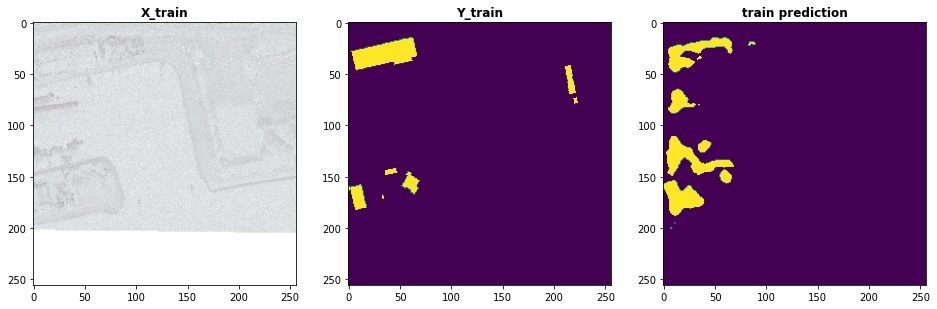

index: 37
val preds  set


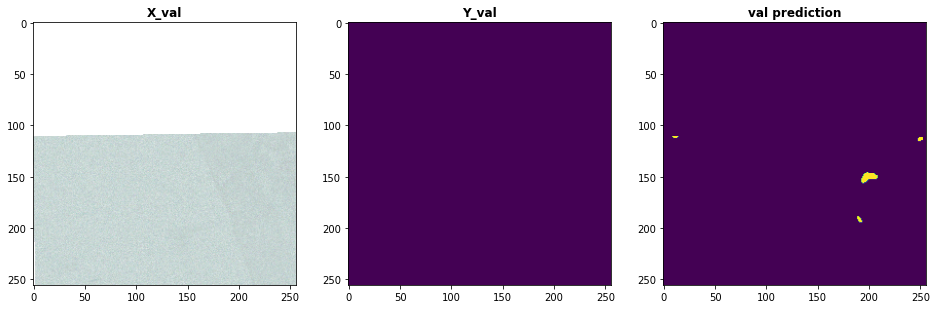

index: 33
test preds  set


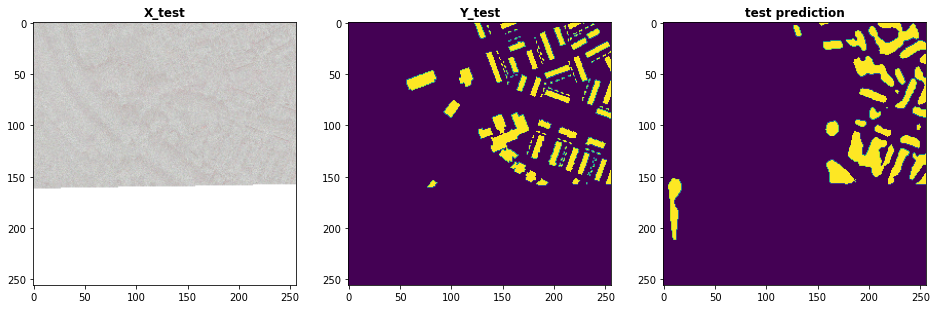

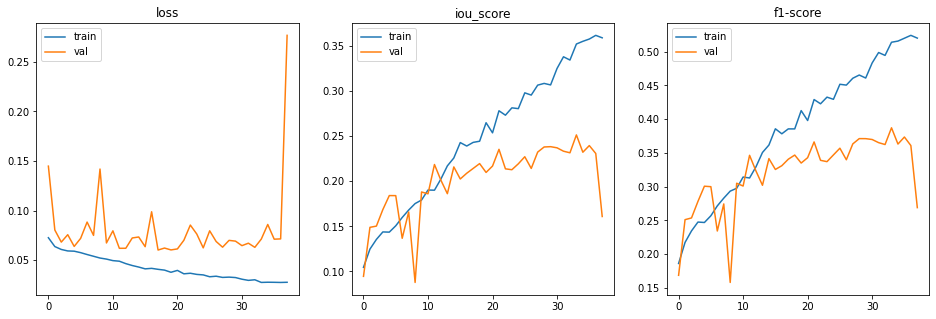

In [ ]:
''' plot predictions to visualize ''' 
plot_XY_preds('train preds', X_train[:MODEL_VAL_OFFSET], Y_train[:MODEL_VAL_OFFSET], preds_train_t, 'X_train', 'Y_train', 'train prediction')
plot_XY_preds('val preds', X_train[MODEL_VAL_OFFSET:], Y_train[MODEL_VAL_OFFSET:], preds_val_t, 'X_val', 'Y_val', 'val prediction')
plot_XY_preds('test preds', X_test, Y_test, preds_test_t, 'X_test', 'Y_test', 'test prediction')
if results != None:
  plot_history(results.history)

### ID 98. BinaryFocalLoss(alpha=0.75, gamma=0.75)

In [ ]:
''' set the train/test ''' 
IMG_TYPE, IMG_WIDTH, IMG_HEIGHT, IMG_ROTATED, IMG_CHANNELS, IMG_DTYPE_SRC, IMG_DTYPE = gen_input_image_details('SAR-Intensity', False)       # CHANGE HERE
PATH_SRC, PATH_SRC_IMAGE, PATH_SRC_MASK, PATH_DATA, PATH_IMAGE, PATH_MASK, PATH_SAMPLE, PATH_SAVED_MODELS = gen_paths(IMG_TYPE, IMG_ROTATED)
if IMG_ROTATED:
  X_train, Y_train, X_test, Y_test = X_train_rotate, Y_train_rotate, X_test_rotate, Y_test_rotate
else:
  X_train, Y_train, X_test, Y_test = X_train_no_rotate, Y_train_no_rotate, X_test_no_rotate, Y_test_no_rotate

gen_input_image_details()
IMG_TYPE: SAR-Intensity, IMG_HEIGHT: 256, IMG_WIDTH: 256, IMG_ROTATED: False, IMG_CHANNELS: 4, IMG_DTYPE_SRC: <class 'numpy.float32'>, IMG_DTYPE: <class 'numpy.uint8'>

gen_paths()
PATH_SRC: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_BACKUP/train_all/AOI_11_Rotterdam, 
PATH_SRC_IMAGE: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_BACKUP/train_all/AOI_11_Rotterdam/SAR-Intensity, 
PATH_SRC_MASK: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_BACKUP/train_all/AOI_11_Rotterdam/_mask, 
PATH_DATA: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data/SAR-Intensity_256x256, 
PATH_IMAGE: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data/SAR-Intensity_256x256/image, 
PATH_MASK: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data/SAR-Intensity_256x256/mask, 
PATH_SAMPLE: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data/SAR-Intensity_256x256/sample, 
P

In [ ]:
''' set the model parameters, train model '''
MODEL_OPTIMIZER, MODEL_LOSS, MODEL_METRICS, MODEL_VAL_SPLIT, MODEL_VAL_OFFSET, MODEL_BATCH_SIZE, MODEL_EPOCHS, MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, MODEL_COMMENTS, MODEL_ID, MODEL_NAME, model = gen_model(
     BinaryFocalLoss(alpha=0.75, gamma=0.75), 4, 100, 'segmentation-models Unet', 'efficientnetb0', ' BinaryFocalLoss(alpha=0.75, gamma=0.75)', IMG_CHANNELS, MODEL_ID=98, MODEL_COMMENTS='loss function test, early stopping patience 20')          # CHANGE HERE

results, model = gen_model_results(PATH_SAVED_MODELS, MODEL_NAME, X_train, Y_train, MODEL_BATCH_SIZE, MODEL_EPOCHS, MODEL_VAL_SPLIT, 
                                   load_weights_filename='', load_weights_epochs=0, save_model=True)                                            # CHANGE HERE

/usr/local/lib/python3.6/dist-packages/keras_applications/imagenet_utils.py:279: UserWarning: This model usually expects 1 or 3 input channels. However, it was passed an input_shape with 4 input channels.
  str(input_shape[-1]) + ' input channels.')


No weights loaded. Training new model
Train on 720 samples, validate on 80 samples
Epoch 1/100
720/720 [==============================] - 45s 63ms/step - loss: 0.0597 - iou_score: 0.1031 - f1-score: 0.1842 - val_loss: 0.1015 - val_iou_score: 0.0873 - val_f1-score: 0.1577
Epoch 2/100
720/720 [==============================] - 27s 37ms/step - loss: 0.0543 - iou_score: 0.1190 - f1-score: 0.2089 - val_loss: 0.1127 - val_iou_score: 0.1324 - val_f1-score: 0.2269
Epoch 3/100
720/720 [==============================] - 27s 37ms/step - loss: 0.0521 - iou_score: 0.1272 - f1-score: 0.2217 - val_loss: 0.0610 - val_iou_score: 0.1553 - val_f1-score: 0.2606
Epoch 4/100
720/720 [==============================] - 27s 37ms/step - loss: 0.0515 - iou_score: 0.1302 - f1-score: 0.2263 - val_loss: 0.0573 - val_iou_score: 0.1651 - val_f1-score: 0.2743
Epoch 5/100
720/720 [==============================] - 27s 37ms/step - loss: 0.0501 - iou_score: 0.1375 - f1-score: 0.2378 - val_loss: 0.0753 - val_iou_score: 0.

In [ ]:
''' predict using model '''
preds_train_t, preds_val_t, preds_test_t = gen_predictions(model, X_train, Y_train, X_test, Y_test, MODEL_VAL_OFFSET, IMG_TYPE, IMG_ROTATED, MODEL_NAME, MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, MODEL_COMMENTS, MODEL_BATCH_SIZE, MODEL_EPOCHS)

80/80 [==============================] - 0s 5ms/step
train set evaluation
720/720 [==============================] - 4s 5ms/step
loss :  0.019490206779705154
iou_score :  0.40797168016433716
f1-score :  0.5788134932518005

validation set evaluation
80/80 [==============================] - 1s 6ms/step
loss :  48.33429718017578
iou_score :  0.2114972621202469
f1-score :  0.34475865960121155

test set evaluation
80/80 [==============================] - 0s 5ms/step
loss :  0.06826214045286179
iou_score :  0.2653297483921051
f1-score :  0.4189938008785248
saved model metrics


index: 608
train preds  set


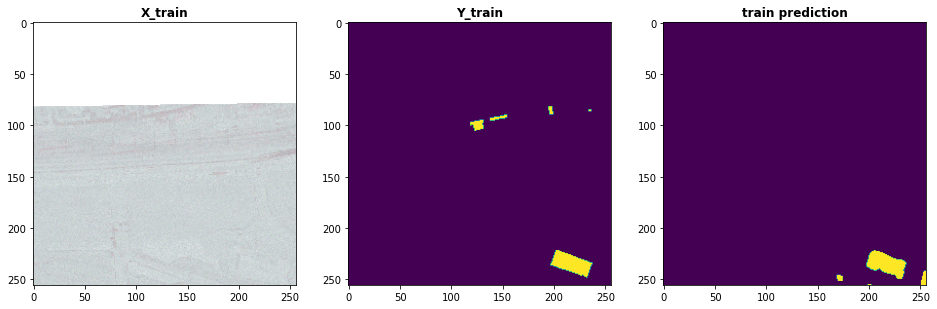

index: 38
val preds  set


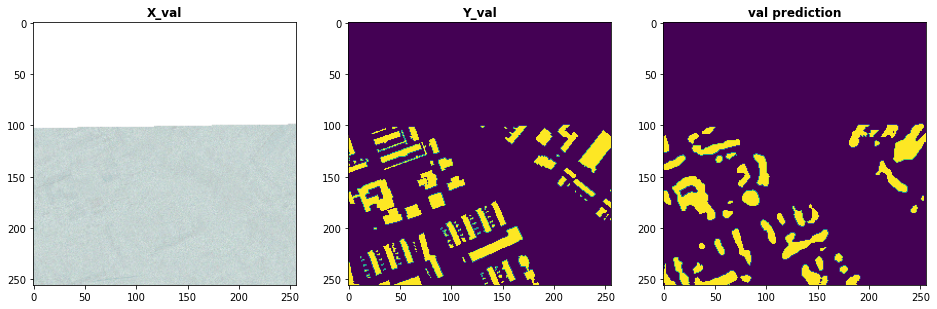

index: 77
test preds  set


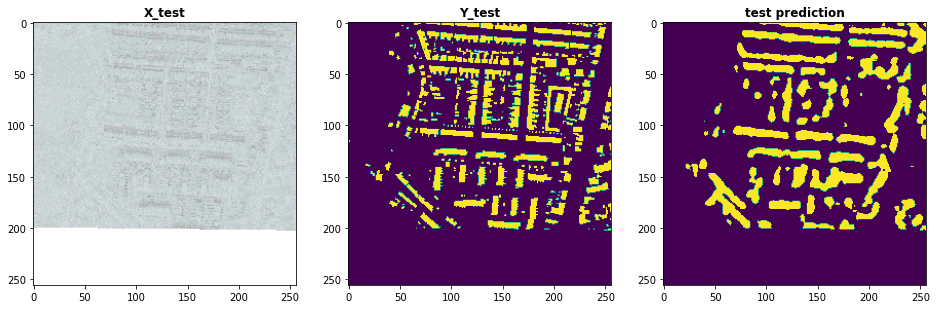

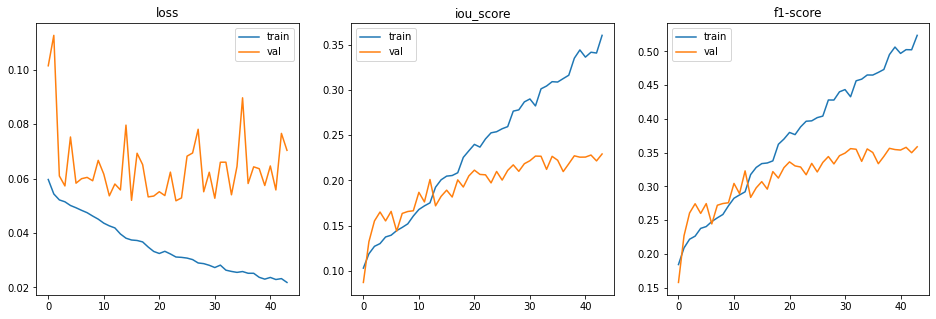

In [ ]:
''' plot predictions to visualize ''' 
plot_XY_preds('train preds', X_train[:MODEL_VAL_OFFSET], Y_train[:MODEL_VAL_OFFSET], preds_train_t, 'X_train', 'Y_train', 'train prediction')
plot_XY_preds('val preds', X_train[MODEL_VAL_OFFSET:], Y_train[MODEL_VAL_OFFSET:], preds_val_t, 'X_val', 'Y_val', 'val prediction')
plot_XY_preds('test preds', X_test, Y_test, preds_test_t, 'X_test', 'Y_test', 'test prediction')
if results != None:
  plot_history(results.history)

### ID 99. BinaryFocalLoss(alpha=0.75, gamma=1.0)

In [ ]:
''' set the train/test ''' 
IMG_TYPE, IMG_WIDTH, IMG_HEIGHT, IMG_ROTATED, IMG_CHANNELS, IMG_DTYPE_SRC, IMG_DTYPE = gen_input_image_details('SAR-Intensity', False)       # CHANGE HERE
PATH_SRC, PATH_SRC_IMAGE, PATH_SRC_MASK, PATH_DATA, PATH_IMAGE, PATH_MASK, PATH_SAMPLE, PATH_SAVED_MODELS = gen_paths(IMG_TYPE, IMG_ROTATED)
if IMG_ROTATED:
  X_train, Y_train, X_test, Y_test = X_train_rotate, Y_train_rotate, X_test_rotate, Y_test_rotate
else:
  X_train, Y_train, X_test, Y_test = X_train_no_rotate, Y_train_no_rotate, X_test_no_rotate, Y_test_no_rotate

gen_input_image_details()
IMG_TYPE: SAR-Intensity, IMG_HEIGHT: 256, IMG_WIDTH: 256, IMG_ROTATED: False, IMG_CHANNELS: 4, IMG_DTYPE_SRC: <class 'numpy.float32'>, IMG_DTYPE: <class 'numpy.uint8'>

gen_paths()
PATH_SRC: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_BACKUP/train_all/AOI_11_Rotterdam, 
PATH_SRC_IMAGE: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_BACKUP/train_all/AOI_11_Rotterdam/SAR-Intensity, 
PATH_SRC_MASK: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_BACKUP/train_all/AOI_11_Rotterdam/_mask, 
PATH_DATA: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data/SAR-Intensity_256x256, 
PATH_IMAGE: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data/SAR-Intensity_256x256/image, 
PATH_MASK: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data/SAR-Intensity_256x256/mask, 
PATH_SAMPLE: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data/SAR-Intensity_256x256/sample, 
P

In [ ]:
''' set the model parameters, train model '''
MODEL_OPTIMIZER, MODEL_LOSS, MODEL_METRICS, MODEL_VAL_SPLIT, MODEL_VAL_OFFSET, MODEL_BATCH_SIZE, MODEL_EPOCHS, MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, MODEL_COMMENTS, MODEL_ID, MODEL_NAME, model = gen_model(
     BinaryFocalLoss(alpha=0.75, gamma=1.0), 4, 100, 'segmentation-models Unet', 'efficientnetb0', ' BinaryFocalLoss(alpha=0.75, gamma=1.0)', IMG_CHANNELS, MODEL_ID=99, MODEL_COMMENTS='loss function test, early stopping patience 20')          # CHANGE HERE

results, model = gen_model_results(PATH_SAVED_MODELS, MODEL_NAME, X_train, Y_train, MODEL_BATCH_SIZE, MODEL_EPOCHS, MODEL_VAL_SPLIT, 
                                   load_weights_filename='', load_weights_epochs=0, save_model=True)                                            # CHANGE HERE

/usr/local/lib/python3.6/dist-packages/keras_applications/imagenet_utils.py:279: UserWarning: This model usually expects 1 or 3 input channels. However, it was passed an input_shape with 4 input channels.
  str(input_shape[-1]) + ' input channels.')


No weights loaded. Training new model
Train on 720 samples, validate on 80 samples
Epoch 1/100
720/720 [==============================] - 44s 62ms/step - loss: 0.0582 - iou_score: 0.0915 - f1-score: 0.1647 - val_loss: 0.0848 - val_iou_score: 0.0770 - val_f1-score: 0.1409
Epoch 2/100
720/720 [==============================] - 26s 37ms/step - loss: 0.0461 - iou_score: 0.1117 - f1-score: 0.1976 - val_loss: 0.0761 - val_iou_score: 0.1119 - val_f1-score: 0.1961
Epoch 3/100
720/720 [==============================] - 27s 37ms/step - loss: 0.0442 - iou_score: 0.1198 - f1-score: 0.2104 - val_loss: 0.0517 - val_iou_score: 0.1365 - val_f1-score: 0.2334
Epoch 4/100
720/720 [==============================] - 27s 37ms/step - loss: 0.0428 - iou_score: 0.1282 - f1-score: 0.2239 - val_loss: 0.0485 - val_iou_score: 0.1574 - val_f1-score: 0.2632
Epoch 5/100
720/720 [==============================] - 27s 37ms/step - loss: 0.0424 - iou_score: 0.1288 - f1-score: 0.2239 - val_loss: 0.0574 - val_iou_score: 0.

In [ ]:
''' predict using model '''
preds_train_t, preds_val_t, preds_test_t = gen_predictions(model, X_train, Y_train, X_test, Y_test, MODEL_VAL_OFFSET, IMG_TYPE, IMG_ROTATED, MODEL_NAME, MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, MODEL_COMMENTS, MODEL_BATCH_SIZE, MODEL_EPOCHS)

80/80 [==============================] - 0s 5ms/step
train set evaluation
720/720 [==============================] - 4s 5ms/step
loss :  0.01910731063948737
iou_score :  0.34613484144210815
f1-score :  0.5133299827575684

validation set evaluation
80/80 [==============================] - 1s 6ms/step
loss :  37.57991676330566
iou_score :  0.24740435183048248
f1-score :  0.3928389549255371

test set evaluation
80/80 [==============================] - 0s 5ms/step
loss :  0.050643067061901095
iou_score :  0.25734958052635193
f1-score :  0.4088553190231323
saved model metrics


index: 461
train preds  set


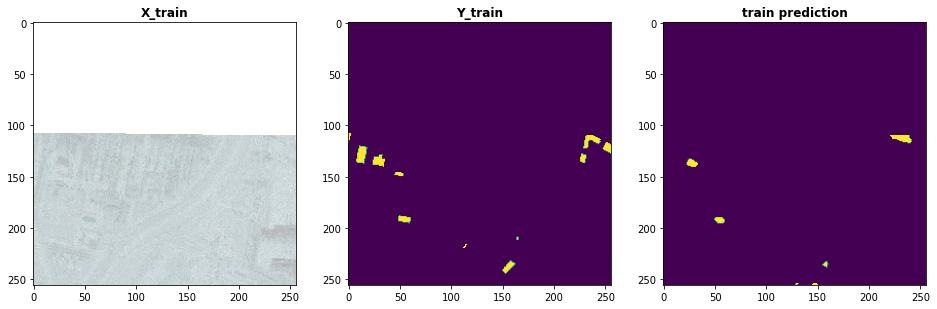

index: 38
val preds  set


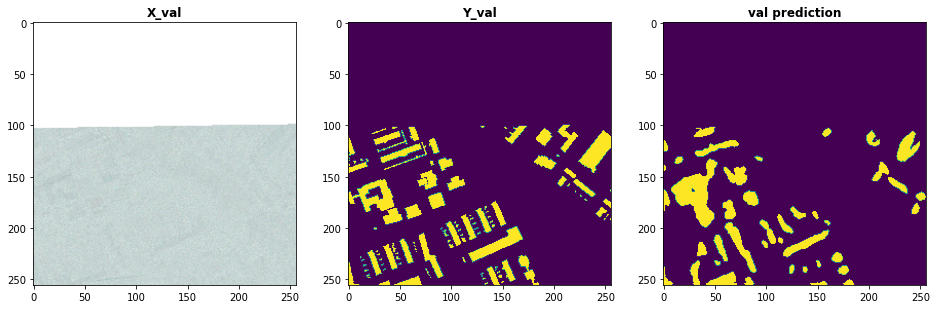

index: 42
test preds  set


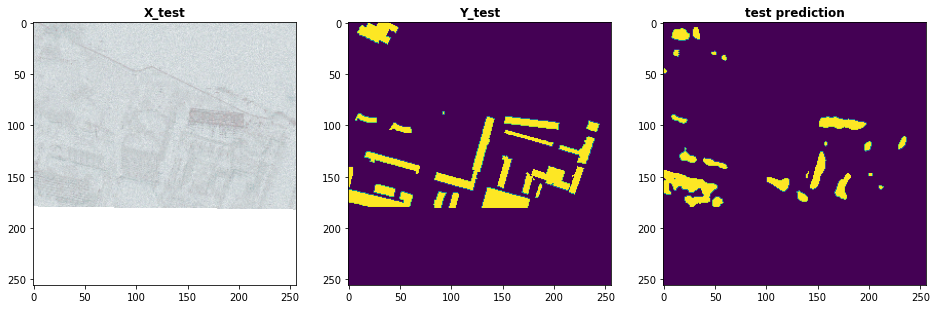

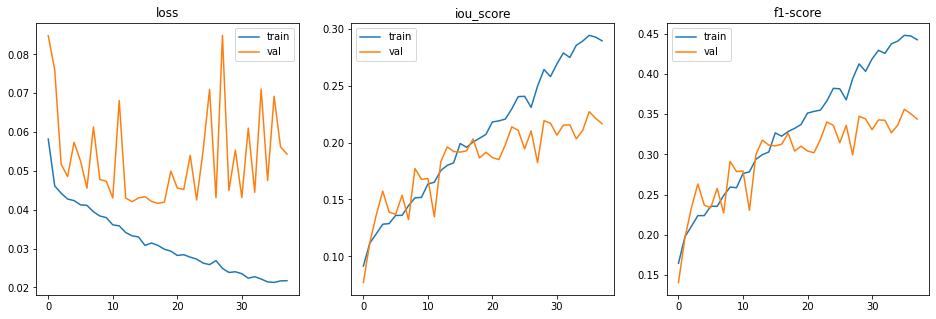

In [ ]:
''' plot predictions to visualize ''' 
plot_XY_preds('train preds', X_train[:MODEL_VAL_OFFSET], Y_train[:MODEL_VAL_OFFSET], preds_train_t, 'X_train', 'Y_train', 'train prediction')
plot_XY_preds('val preds', X_train[MODEL_VAL_OFFSET:], Y_train[MODEL_VAL_OFFSET:], preds_val_t, 'X_val', 'Y_val', 'val prediction')
plot_XY_preds('test preds', X_test, Y_test, preds_test_t, 'X_test', 'Y_test', 'test prediction')
if results != None:
  plot_history(results.history)

### ID 100. BinaryFocalLoss(alpha=0.75, gamma=1.5)

In [ ]:
''' set the train/test ''' 
IMG_TYPE, IMG_WIDTH, IMG_HEIGHT, IMG_ROTATED, IMG_CHANNELS, IMG_DTYPE_SRC, IMG_DTYPE = gen_input_image_details('SAR-Intensity', False)       # CHANGE HERE
PATH_SRC, PATH_SRC_IMAGE, PATH_SRC_MASK, PATH_DATA, PATH_IMAGE, PATH_MASK, PATH_SAMPLE, PATH_SAVED_MODELS = gen_paths(IMG_TYPE, IMG_ROTATED)
if IMG_ROTATED:
  X_train, Y_train, X_test, Y_test = X_train_rotate, Y_train_rotate, X_test_rotate, Y_test_rotate
else:
  X_train, Y_train, X_test, Y_test = X_train_no_rotate, Y_train_no_rotate, X_test_no_rotate, Y_test_no_rotate

gen_input_image_details()
IMG_TYPE: SAR-Intensity, IMG_HEIGHT: 256, IMG_WIDTH: 256, IMG_ROTATED: False, IMG_CHANNELS: 4, IMG_DTYPE_SRC: <class 'numpy.float32'>, IMG_DTYPE: <class 'numpy.uint8'>

gen_paths()
PATH_SRC: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_BACKUP/train_all/AOI_11_Rotterdam, 
PATH_SRC_IMAGE: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_BACKUP/train_all/AOI_11_Rotterdam/SAR-Intensity, 
PATH_SRC_MASK: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_BACKUP/train_all/AOI_11_Rotterdam/_mask, 
PATH_DATA: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data/SAR-Intensity_256x256, 
PATH_IMAGE: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data/SAR-Intensity_256x256/image, 
PATH_MASK: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data/SAR-Intensity_256x256/mask, 
PATH_SAMPLE: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data/SAR-Intensity_256x256/sample, 
P

In [ ]:
''' set the model parameters, train model '''
MODEL_OPTIMIZER, MODEL_LOSS, MODEL_METRICS, MODEL_VAL_SPLIT, MODEL_VAL_OFFSET, MODEL_BATCH_SIZE, MODEL_EPOCHS, MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, MODEL_COMMENTS, MODEL_ID, MODEL_NAME, model = gen_model(
     BinaryFocalLoss(alpha=0.75, gamma=1.5), 4, 100, 'segmentation-models Unet', 'efficientnetb0', ' BinaryFocalLoss(alpha=0.75, gamma=1.5)', IMG_CHANNELS, MODEL_ID=100, MODEL_COMMENTS='loss function test, early stopping patience 20')          # CHANGE HERE

results, model = gen_model_results(PATH_SAVED_MODELS, MODEL_NAME, X_train, Y_train, MODEL_BATCH_SIZE, MODEL_EPOCHS, MODEL_VAL_SPLIT, 
                                   load_weights_filename='', load_weights_epochs=0, save_model=True)                                            # CHANGE HERE

/usr/local/lib/python3.6/dist-packages/keras_applications/imagenet_utils.py:279: UserWarning: This model usually expects 1 or 3 input channels. However, it was passed an input_shape with 4 input channels.
  str(input_shape[-1]) + ' input channels.')


No weights loaded. Training new model
Train on 720 samples, validate on 80 samples
Epoch 1/100
720/720 [==============================] - 46s 64ms/step - loss: 0.0444 - iou_score: 0.0856 - f1-score: 0.1550 - val_loss: 0.0749 - val_iou_score: 0.0839 - val_f1-score: 0.1522
Epoch 2/100
720/720 [==============================] - 27s 37ms/step - loss: 0.0333 - iou_score: 0.1022 - f1-score: 0.1826 - val_loss: 0.0448 - val_iou_score: 0.1156 - val_f1-score: 0.2014
Epoch 3/100
720/720 [==============================] - 27s 37ms/step - loss: 0.0324 - iou_score: 0.1070 - f1-score: 0.1900 - val_loss: 0.0386 - val_iou_score: 0.1268 - val_f1-score: 0.2176
Epoch 4/100
720/720 [==============================] - 27s 37ms/step - loss: 0.0318 - iou_score: 0.1115 - f1-score: 0.1972 - val_loss: 0.0386 - val_iou_score: 0.1291 - val_f1-score: 0.2222
Epoch 5/100
720/720 [==============================] - 27s 37ms/step - loss: 0.0308 - iou_score: 0.1157 - f1-score: 0.2044 - val_loss: 0.0522 - val_iou_score: 0.

In [ ]:
''' predict using model '''
preds_train_t, preds_val_t, preds_test_t = gen_predictions(model, X_train, Y_train, X_test, Y_test, MODEL_VAL_OFFSET, IMG_TYPE, IMG_ROTATED, MODEL_NAME, MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, MODEL_COMMENTS, MODEL_BATCH_SIZE, MODEL_EPOCHS)

80/80 [==============================] - 0s 5ms/step
train set evaluation
720/720 [==============================] - 4s 5ms/step
loss :  0.015714503824710846
iou_score :  0.24777072668075562
f1-score :  0.39660751819610596

validation set evaluation
80/80 [==============================] - 0s 6ms/step
loss :  26.166253662109376
iou_score :  0.36386632919311523
f1-score :  0.5279802680015564

test set evaluation
80/80 [==============================] - 0s 5ms/step
loss :  0.03101278841495514
iou_score :  0.21223318576812744
f1-score :  0.34966349601745605
saved model metrics


index: 499
train preds  set


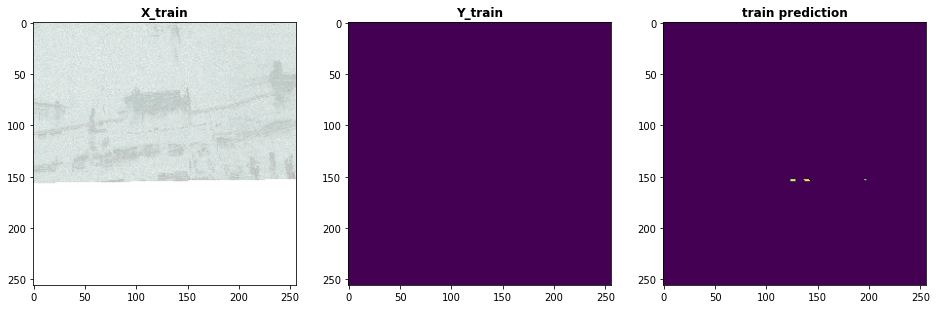

index: 10
val preds  set


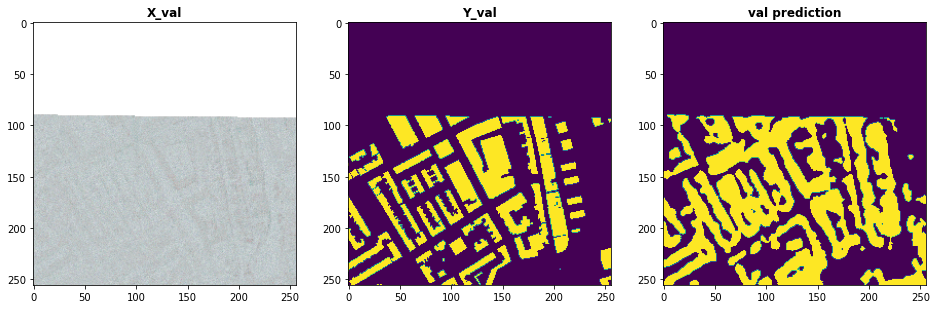

index: 3
test preds  set


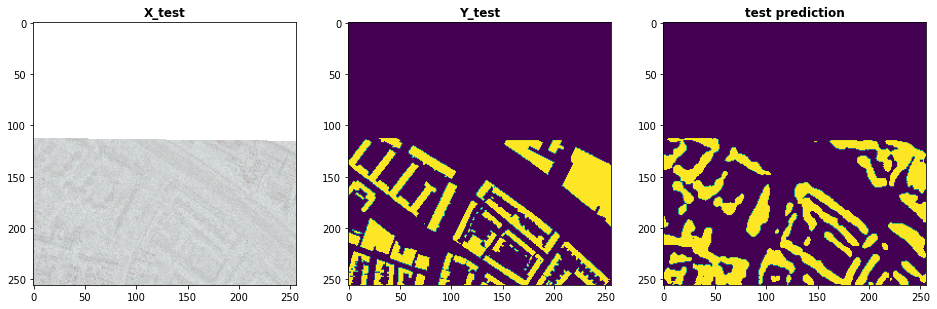

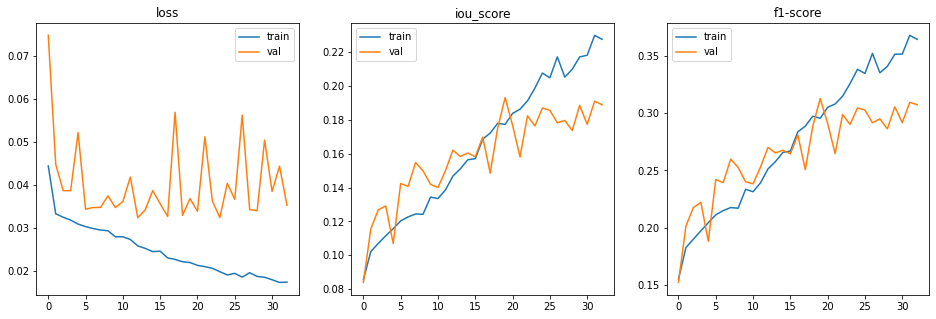

In [ ]:
''' plot predictions to visualize ''' 
plot_XY_preds('train preds', X_train[:MODEL_VAL_OFFSET], Y_train[:MODEL_VAL_OFFSET], preds_train_t, 'X_train', 'Y_train', 'train prediction')
plot_XY_preds('val preds', X_train[MODEL_VAL_OFFSET:], Y_train[MODEL_VAL_OFFSET:], preds_val_t, 'X_val', 'Y_val', 'val prediction')
plot_XY_preds('test preds', X_test, Y_test, preds_test_t, 'X_test', 'Y_test', 'test prediction')
if results != None:
  plot_history(results.history)

## Findings

BinaryFocalLoss does not perform better than JaccardLoss for the efficientnetb0 model

That said, alpha=0.75, gamma=0.75 seem to be the best combination for BinaryFocalLoss()